## Network Trace Analysis
The network information of some mobile phones in wifi and LTE is collected, mainly simulating the network status under strong network, medium network and weak network. The format is:

| Timestamp (s)  | Throughput (Mbps) | Rtt (ms) |
| :---: | :---: | :---: |
| 0.5  | 1.478  | ...  |
| 1.0  | 2.476  | ...  |
| ...  | ...  | ...  |

In [1]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import os

%matplotlib inline
matplotlib.style.use('ggplot')

In [2]:
def plot_thp_rtt(trace_file, title):
    time_s = []
    thp_mbps = []
    rtt_ms = []
    with open(trace_file, 'rb') as f:
        for line in f:
            parse = line.split()
            time_s.append(float(parse[0]))
            thp_mbps.append(float(parse[1]))
            rtt_ms.append(float(parse[2]))
    time_s = np.array(time_s)
    thp_mbps = np.array(thp_mbps)
    rtt_ms = np.array(rtt_ms)
    
    fig, axs = plt.subplot(2, 1)
    axs[0].plot(time_s, thp_mbps)
    axs[0].set_xlabel('time')
    axs[0].set_ylabel('throughput (Mbps)')
    axs[0].grid(True)
    
    axs[1].plot(time_s, rtt_ms)
    axs[1].set_ylabel('rtt (ms)')

    fig.tight_layout()
    plt.title(title)
    plt.show()
    
    return thp_mbps, rtt_ms

In [115]:
def plot_thp(trace_file, title, start=0, end=5800, scale=False):
    time_s = []
    thp_mbps = []
    with open(trace_file, 'rb') as f:
        for line in f:
            parse = line.split()
            if len(parse) == 2:
                try:
                    time_s.append(float(parse[0]))
                    thp_mbps.append(float(parse[1]))
                except ValueError:
                    print('we got an error: ', parse[0], parse[1])
    time_s = np.array(time_s)
    thp_mbps = np.array(thp_mbps)
    if scale:
        thp_mbps = 0.5 + (0.095/0.52)*(thp_mbps-1.22)
    
    fig = plt.figure(figsize=(20,10))
    plt.plot(time_s[start:end], thp_mbps[start:end])
    plt.xlabel('time')
    plt.ylabel('throughput (Mbps)')
    plt.title(title)
#     plt.tight_layout()
    plt.show()
    
    return thp_mbps[start:end]

In [116]:
def get_analysis_result(path, start=0, end=5800, scale=False):
    for root, dirnames, filenames in os.walk(os.path.abspath(path)):
        for filename in filenames:
            trace_file = os.path.join(root, filename)
            parse = trace_file.split('/')
            title = parse[-1]
        
            thp_mbps = plot_thp(trace_file, title, start, end, scale)

            print('Mean: %.3f' % (np.average(thp_mbps)))
            print('Std: %.3f' % (np.std(thp_mbps)))
            print('Max: %.3f' % (np.max(thp_mbps)))
            print('Min: %.3f' % (np.min(thp_mbps)))
#             print('Median: %.3f' % (np.median(thp_mbps)))
            print('Percentile (5): %.3f' % (np.percentile(thp_mbps, 5)))
            print('Percentile (20): %.3f' % (np.percentile(thp_mbps, 20)))
            print('Percentile (50): %.3f' % (np.percentile(thp_mbps, 50)))
            print('Percentile (80): %.3f' % (np.percentile(thp_mbps, 80)))
            print('Percentile (95): %.3f' % (np.percentile(thp_mbps, 95)))
            

## Pensieve trace analysis

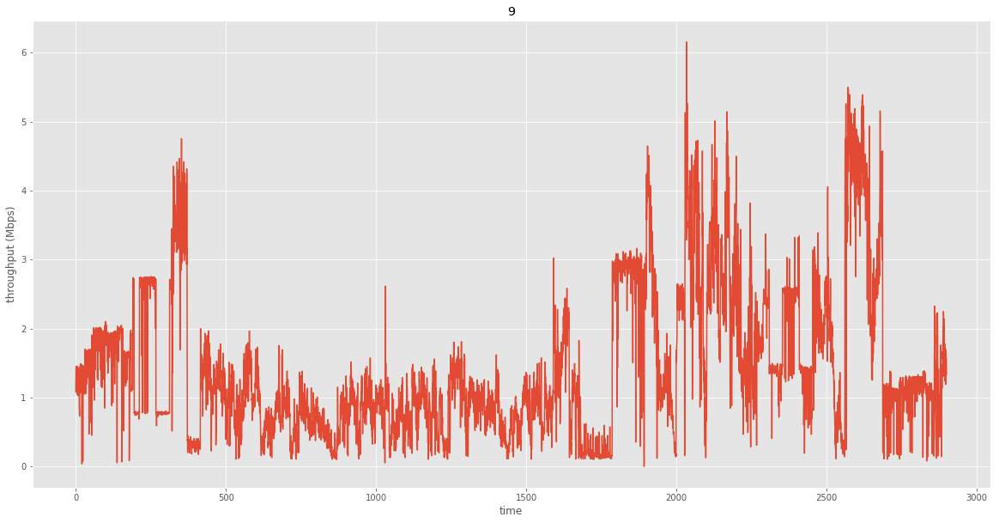

Mean: 1.456
Std: 1.071
Max: 6.154
Min: 0.001
Percentile (5): 0.191
Percentile (20): 0.603
Percentile (50): 1.138
Percentile (80): 2.380
Percentile (95): 3.742


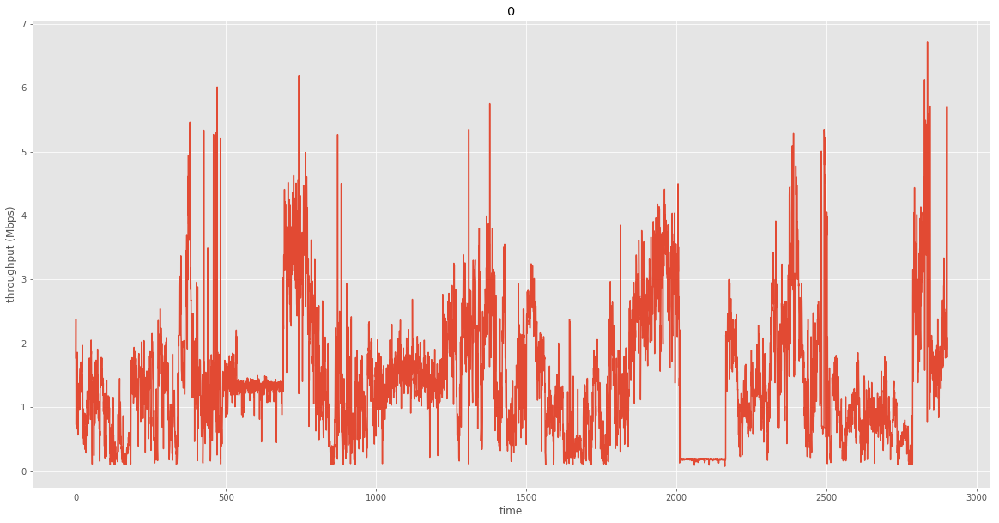

Mean: 1.468
Std: 0.985
Max: 6.714
Min: 0.077
Percentile (5): 0.191
Percentile (20): 0.617
Percentile (50): 1.329
Percentile (80): 2.148
Percentile (95): 3.404


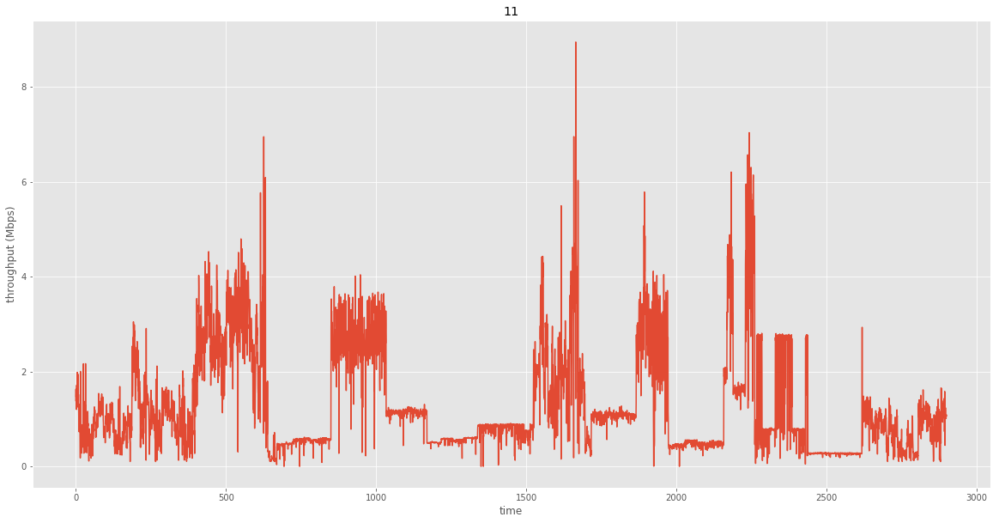

Mean: 1.311
Std: 1.065
Max: 8.952
Min: 0.000
Percentile (5): 0.267
Percentile (20): 0.487
Percentile (50): 0.937
Percentile (80): 2.319
Percentile (95): 3.454


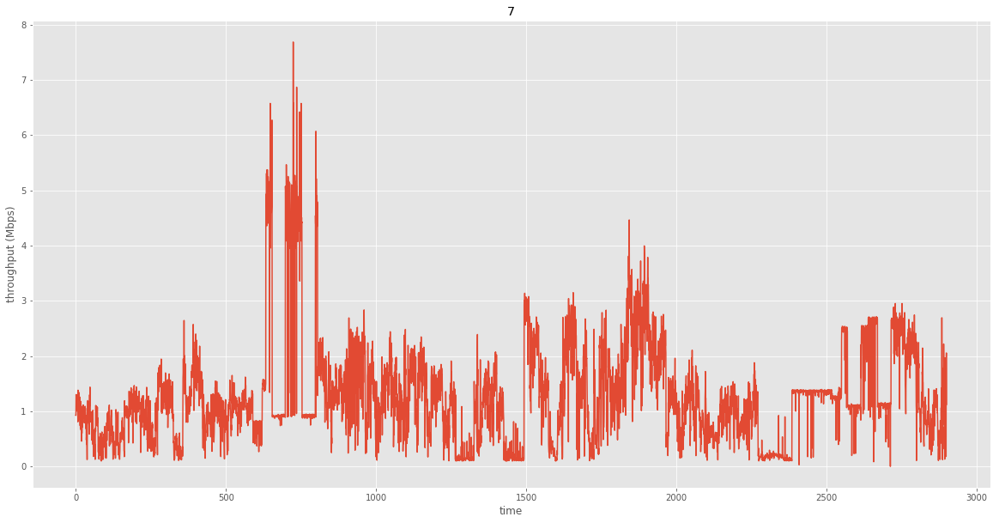

Mean: 1.278
Std: 0.920
Max: 7.686
Min: 0.003
Percentile (5): 0.153
Percentile (20): 0.563
Percentile (50): 1.120
Percentile (80): 1.794
Percentile (95): 2.713


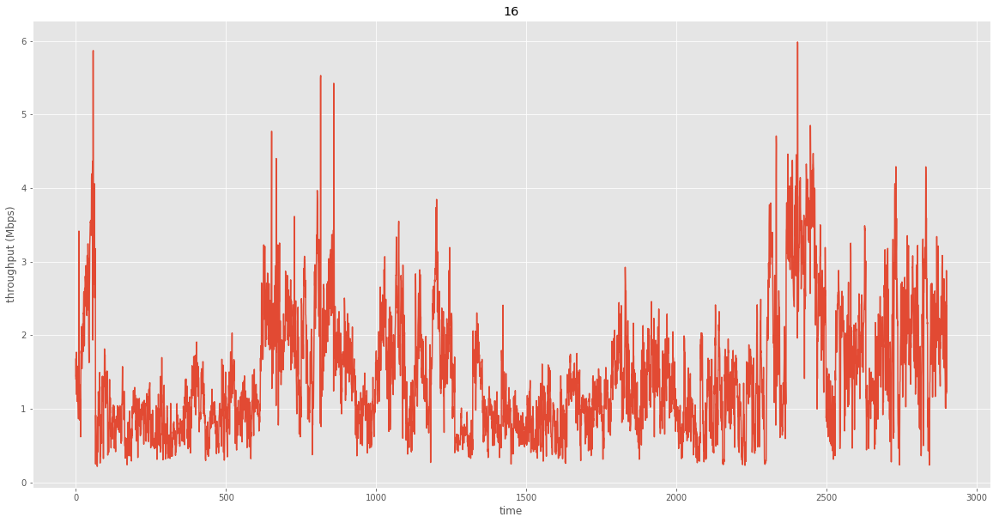

Mean: 1.450
Std: 0.831
Max: 5.986
Min: 0.219
Percentile (5): 0.464
Percentile (20): 0.754
Percentile (50): 1.253
Percentile (80): 2.069
Percentile (95): 3.090


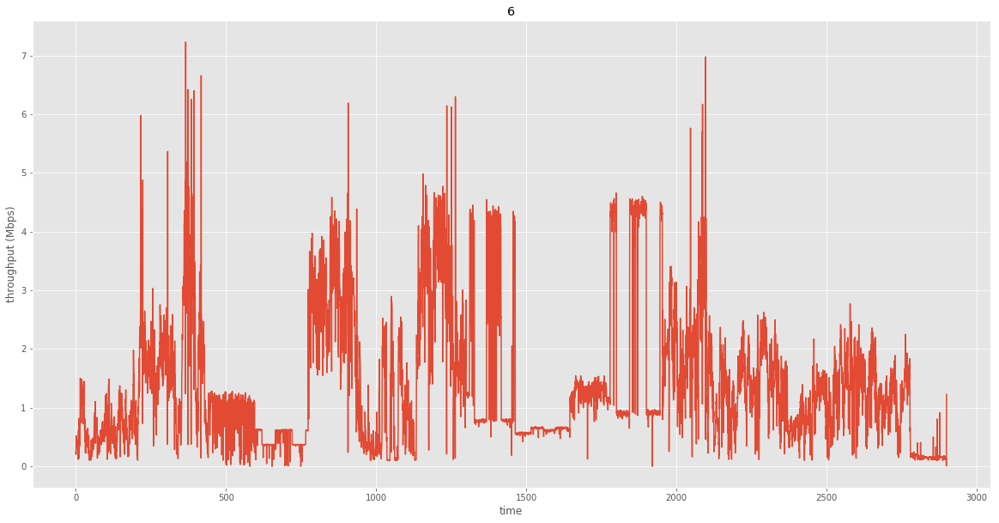

Mean: 1.418
Std: 1.143
Max: 7.230
Min: 0.000
Percentile (5): 0.161
Percentile (20): 0.558
Percentile (50): 1.094
Percentile (80): 2.140
Percentile (95): 4.197


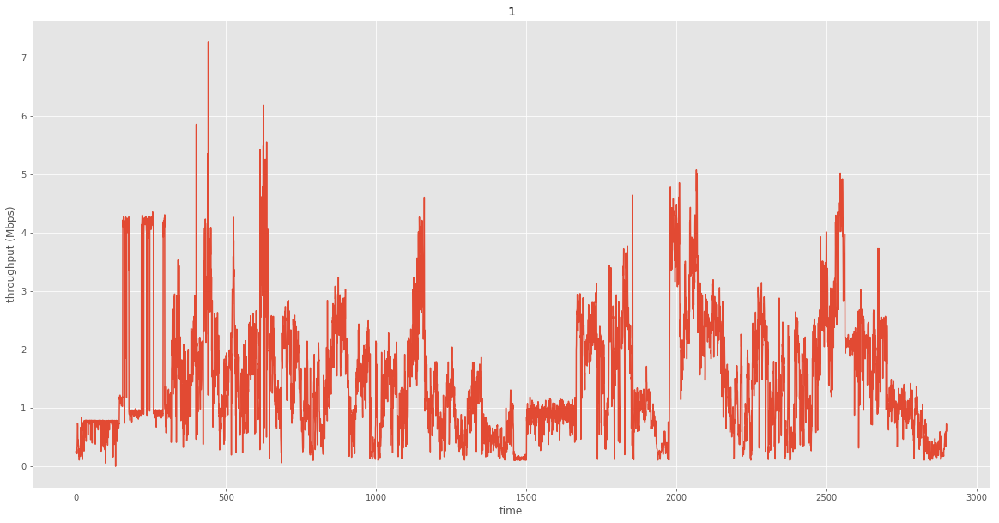

Mean: 1.499
Std: 1.027
Max: 7.266
Min: 0.000
Percentile (5): 0.239
Percentile (20): 0.669
Percentile (50): 1.209
Percentile (80): 2.304
Percentile (95): 3.728


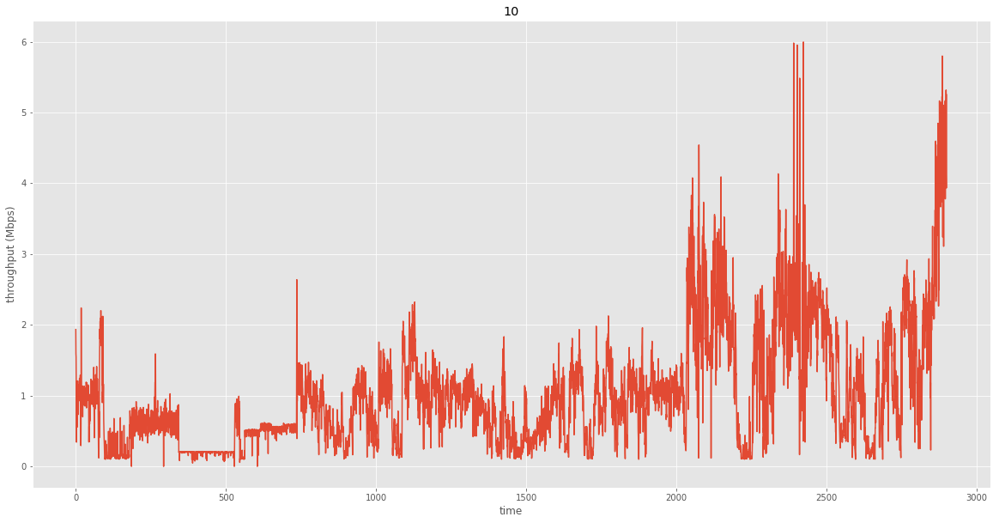

Mean: 1.017
Std: 0.811
Max: 5.997
Min: 0.000
Percentile (5): 0.150
Percentile (20): 0.361
Percentile (50): 0.845
Percentile (80): 1.487
Percentile (95): 2.552


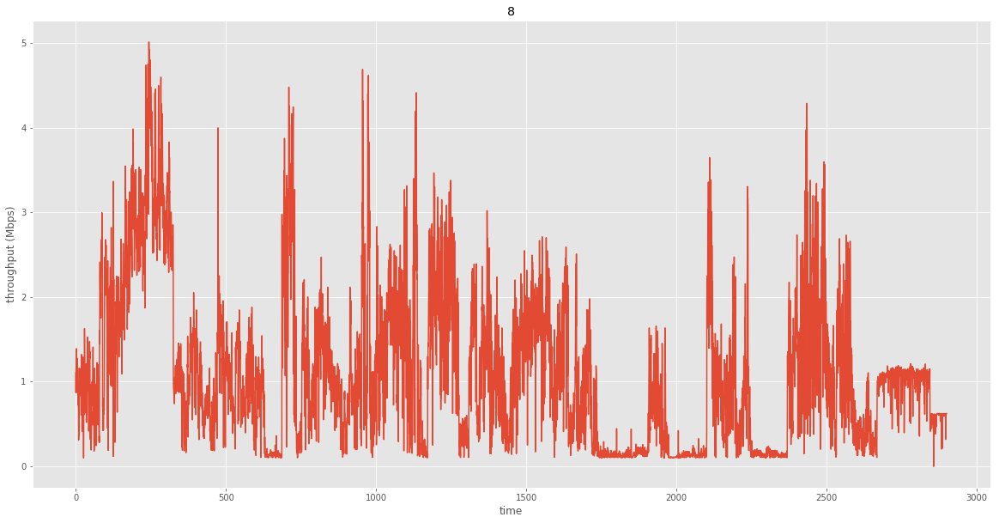

Mean: 1.107
Std: 0.897
Max: 5.012
Min: 0.000
Percentile (5): 0.116
Percentile (20): 0.227
Percentile (50): 0.942
Percentile (80): 1.791
Percentile (95): 2.886


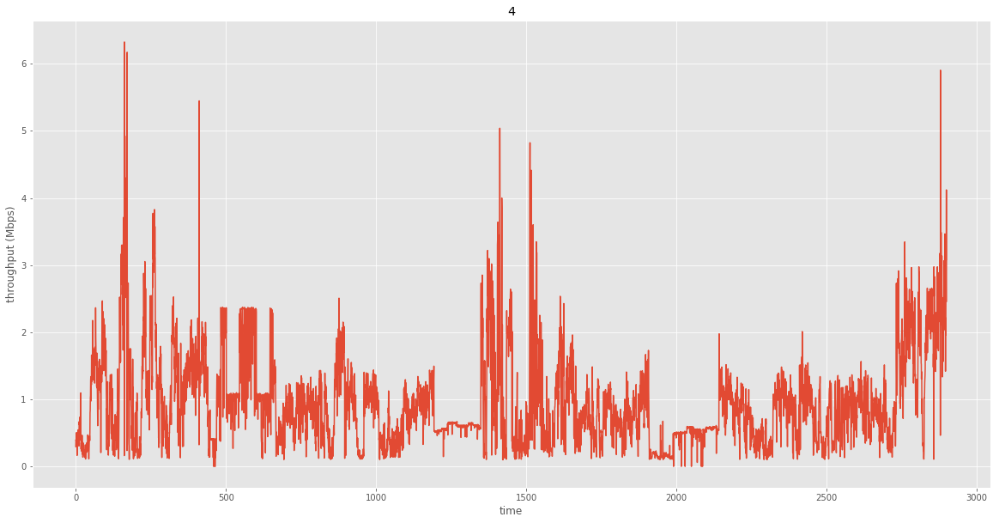

Mean: 0.947
Std: 0.672
Max: 6.325
Min: 0.000
Percentile (5): 0.164
Percentile (20): 0.410
Percentile (50): 0.807
Percentile (80): 1.346
Percentile (95): 2.326


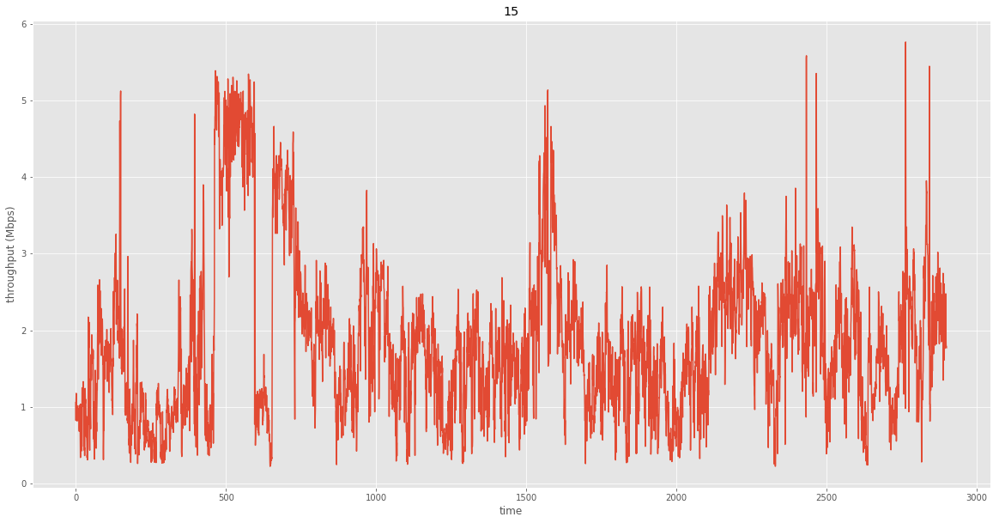

Mean: 1.858
Std: 1.017
Max: 5.763
Min: 0.222
Percentile (5): 0.545
Percentile (20): 1.006
Percentile (50): 1.714
Percentile (80): 2.478
Percentile (95): 4.108


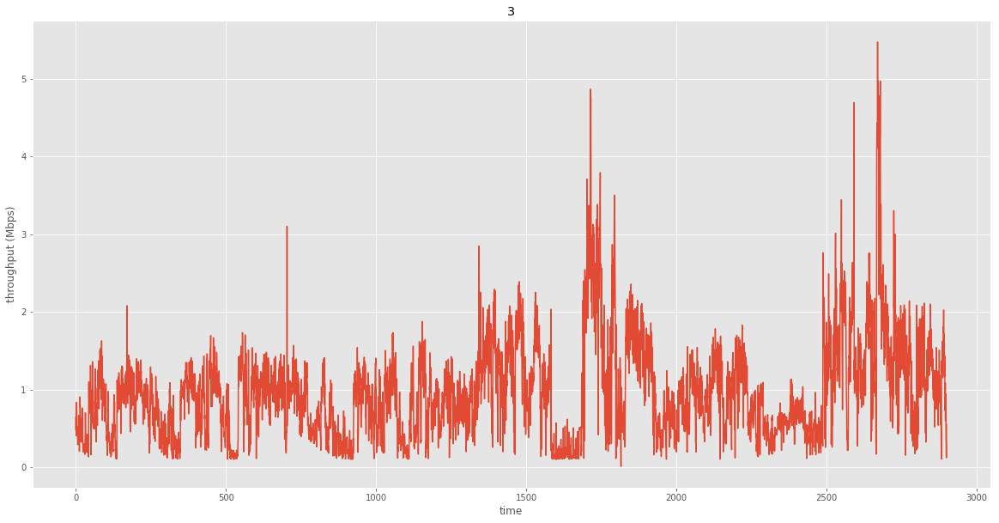

Mean: 0.956
Std: 0.621
Max: 5.477
Min: 0.009
Percentile (5): 0.170
Percentile (20): 0.436
Percentile (50): 0.895
Percentile (80): 1.358
Percentile (95): 2.024


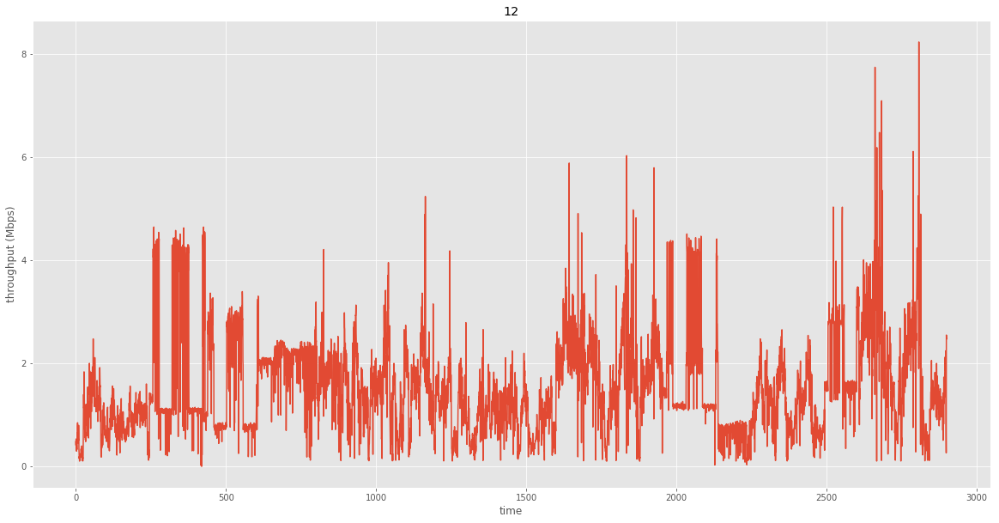

Mean: 1.555
Std: 0.938
Max: 8.242
Min: 0.000
Percentile (5): 0.337
Percentile (20): 0.773
Percentile (50): 1.355
Percentile (80): 2.223
Percentile (95): 3.301


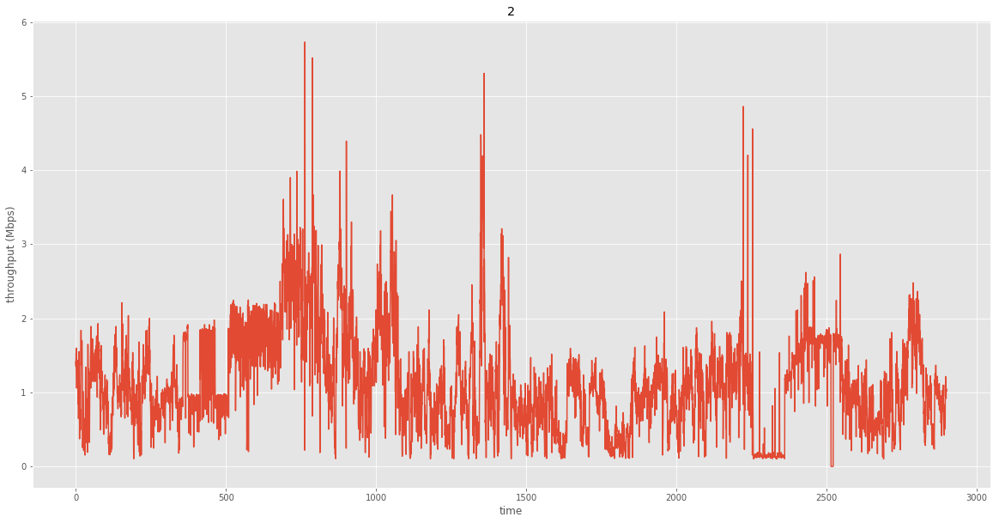

Mean: 1.135
Std: 0.652
Max: 5.731
Min: 0.000
Percentile (5): 0.169
Percentile (20): 0.574
Percentile (50): 1.051
Percentile (80): 1.664
Percentile (95): 2.261


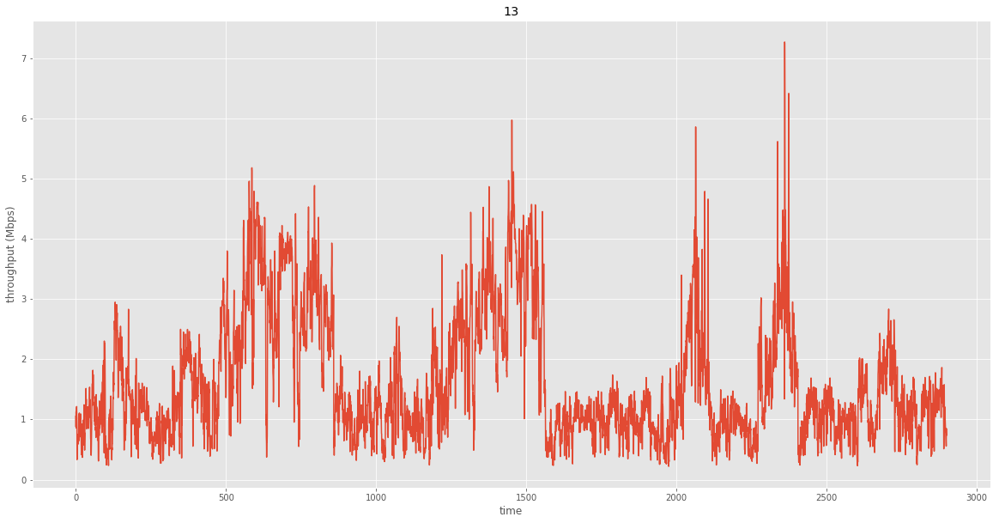

Mean: 1.639
Std: 1.034
Max: 7.273
Min: 0.221
Percentile (5): 0.479
Percentile (20): 0.824
Percentile (50): 1.282
Percentile (80): 2.465
Percentile (95): 3.827


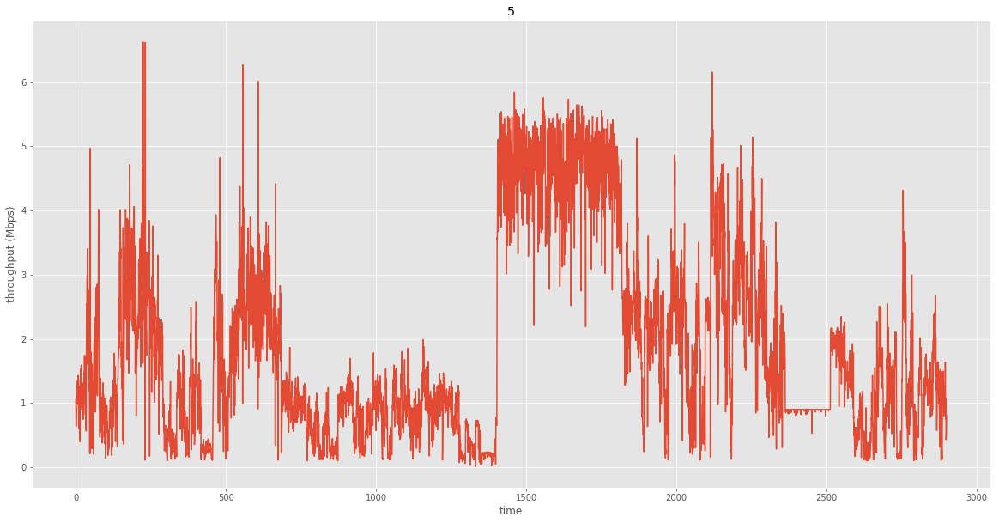

Mean: 1.881
Std: 1.479
Max: 6.624
Min: 0.014
Percentile (5): 0.215
Percentile (20): 0.652
Percentile (50): 1.342
Percentile (80): 3.137
Percentile (95): 4.951


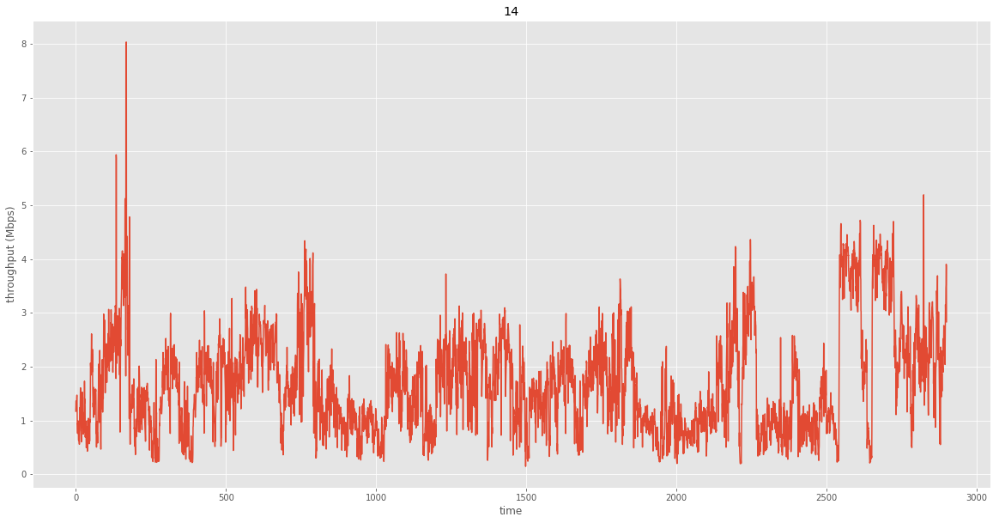

Mean: 1.700
Std: 0.932
Max: 8.034
Min: 0.149
Percentile (5): 0.474
Percentile (20): 0.887
Percentile (50): 1.565
Percentile (80): 2.398
Percentile (95): 3.563


In [104]:
get_analysis_result('cooked_trace/')

### Mixed Network Trace Analysis

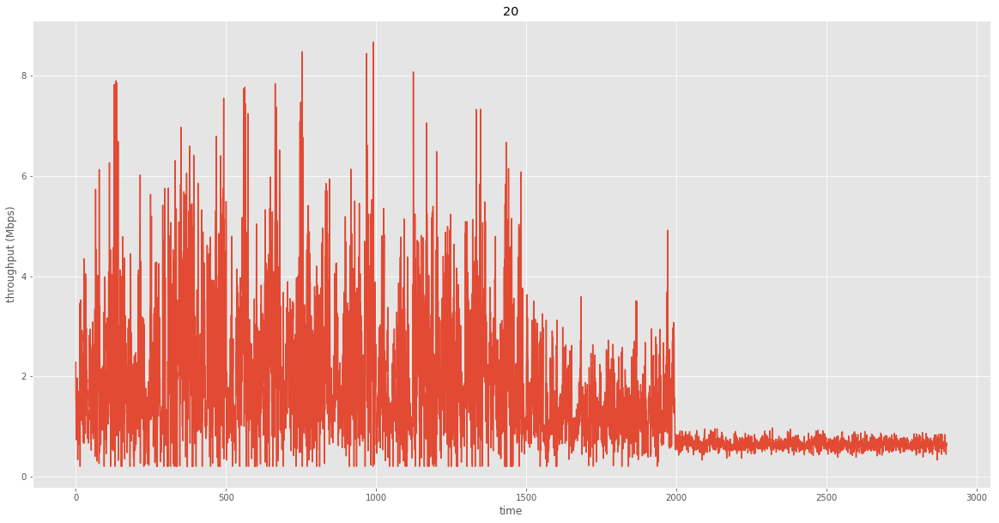

Mean: 1.615
Std: 1.245
Max: 8.678
Min: 0.200
Percentile (5): 0.502
Percentile (20): 0.642
Percentile (50): 1.172
Percentile (80): 2.498
Percentile (95): 4.150


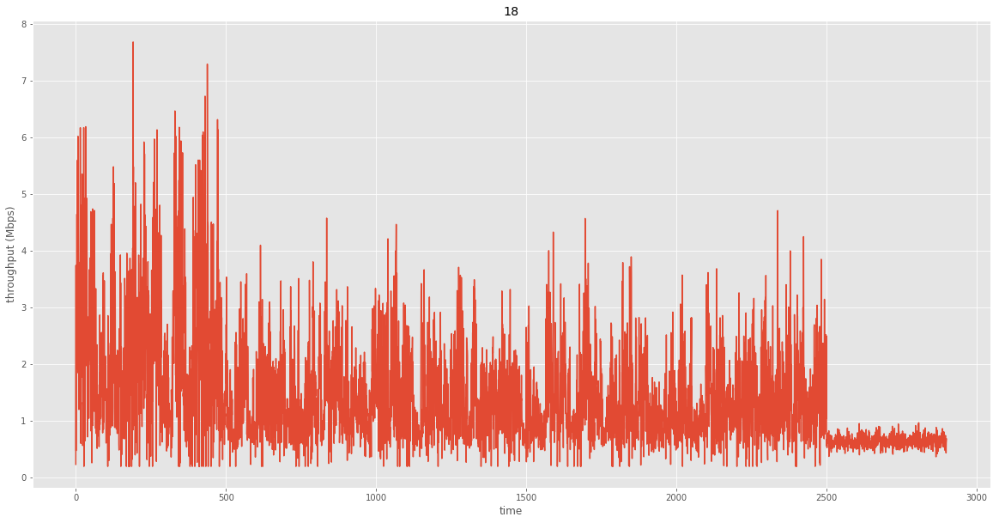

Mean: 1.430
Std: 0.912
Max: 7.680
Min: 0.200
Percentile (5): 0.518
Percentile (20): 0.698
Percentile (50): 1.183
Percentile (80): 2.033
Percentile (95): 3.182


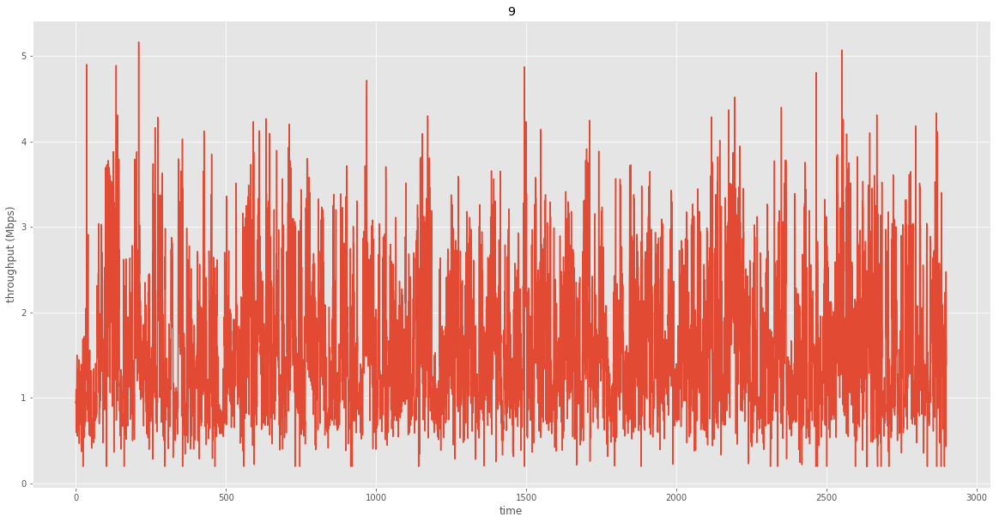

Mean: 1.634
Std: 0.791
Max: 5.164
Min: 0.200
Percentile (5): 0.627
Percentile (20): 0.937
Percentile (50): 1.488
Percentile (80): 2.301
Percentile (95): 3.140


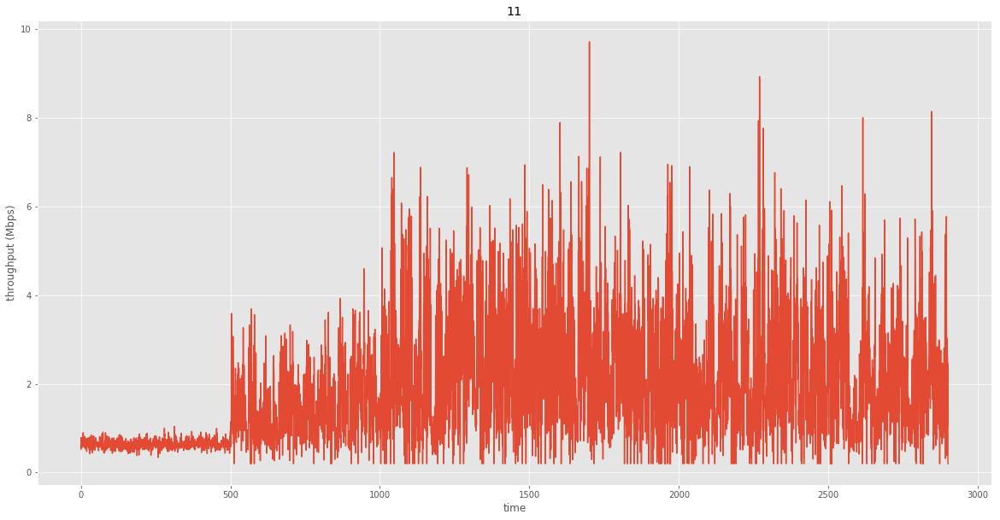

Mean: 1.933
Std: 1.321
Max: 9.717
Min: 0.200
Percentile (5): 0.515
Percentile (20): 0.714
Percentile (50): 1.639
Percentile (80): 3.012
Percentile (95): 4.497


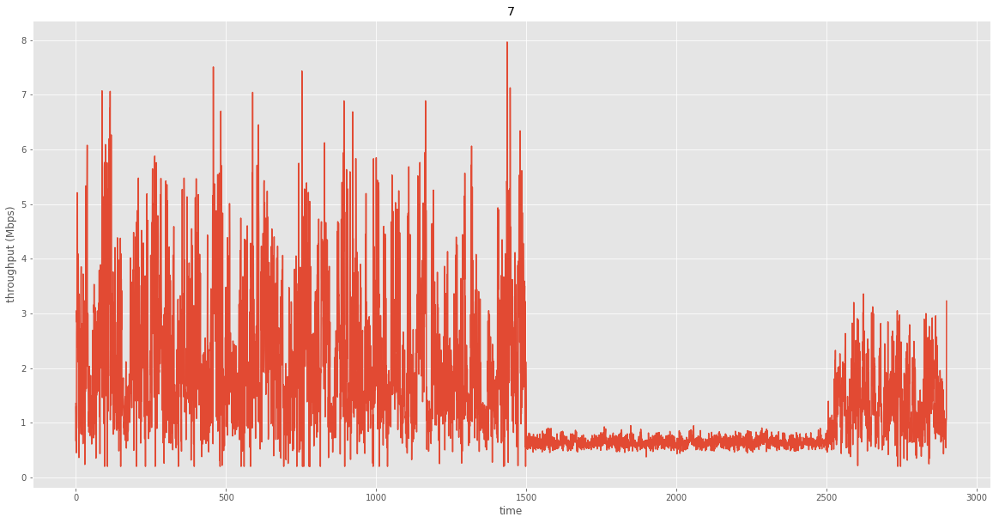

Mean: 1.598
Std: 1.189
Max: 7.966
Min: 0.200
Percentile (5): 0.542
Percentile (20): 0.640
Percentile (50): 1.185
Percentile (80): 2.478
Percentile (95): 4.061


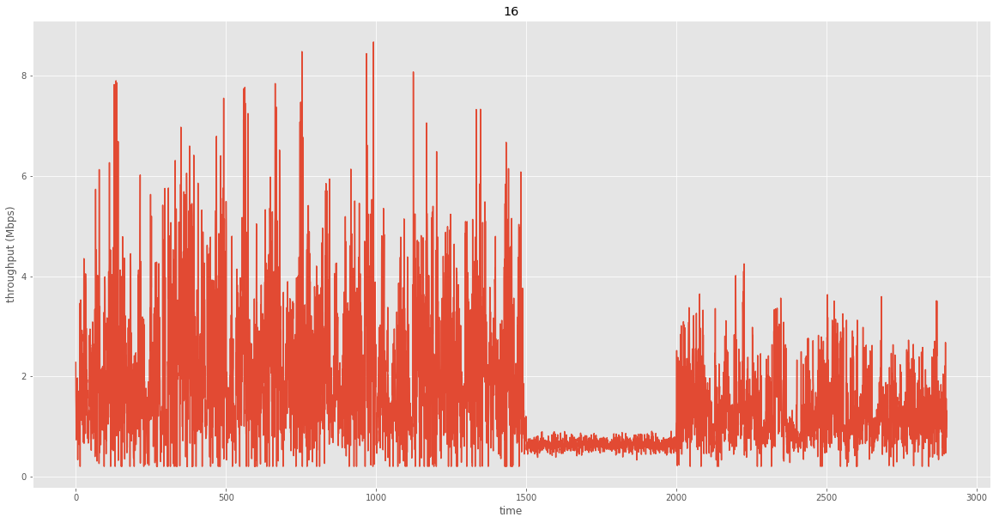

Mean: 1.712
Std: 1.220
Max: 8.678
Min: 0.200
Percentile (5): 0.502
Percentile (20): 0.687
Percentile (50): 1.382
Percentile (80): 2.575
Percentile (95): 4.150


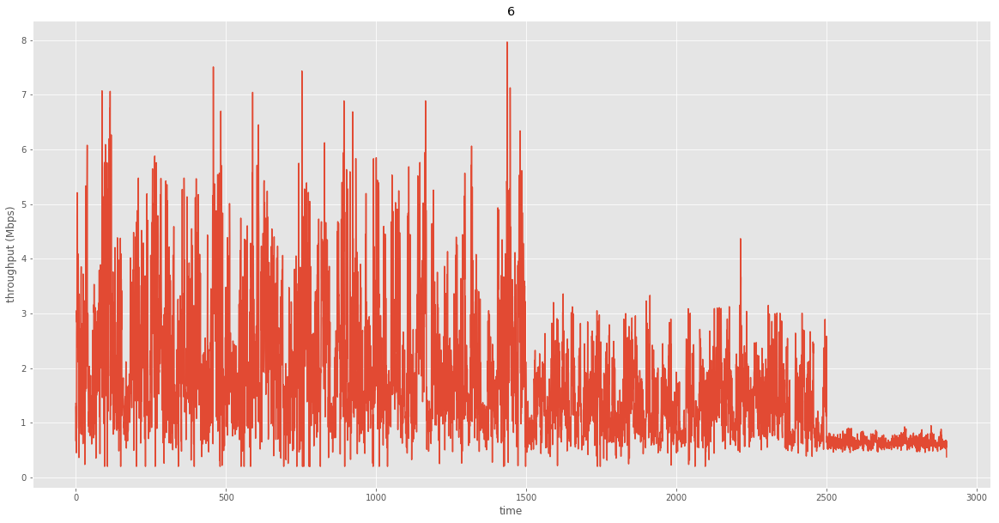

Mean: 1.748
Std: 1.135
Max: 7.966
Min: 0.200
Percentile (5): 0.565
Percentile (20): 0.748
Percentile (50): 1.477
Percentile (80): 2.538
Percentile (95): 4.061


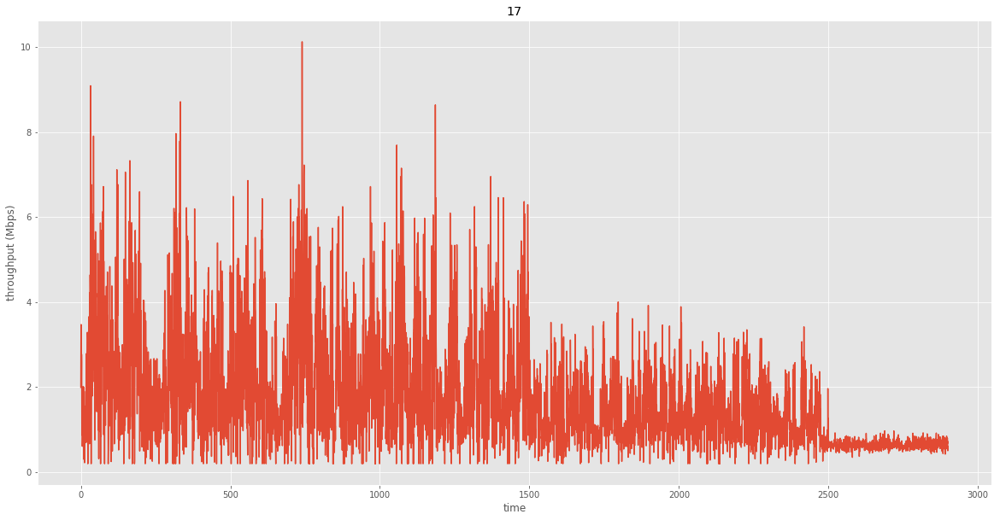

Mean: 1.763
Std: 1.239
Max: 10.125
Min: 0.200
Percentile (5): 0.511
Percentile (20): 0.723
Percentile (50): 1.423
Percentile (80): 2.618
Percentile (95): 4.268


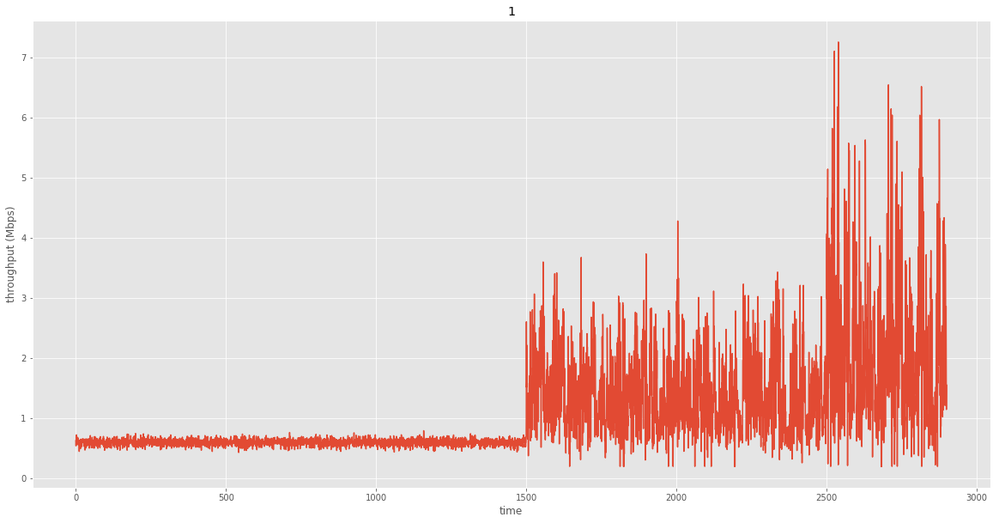

Mean: 1.094
Std: 0.803
Max: 7.264
Min: 0.200
Percentile (5): 0.526
Percentile (20): 0.582
Percentile (50): 0.664
Percentile (80): 1.587
Percentile (95): 2.694


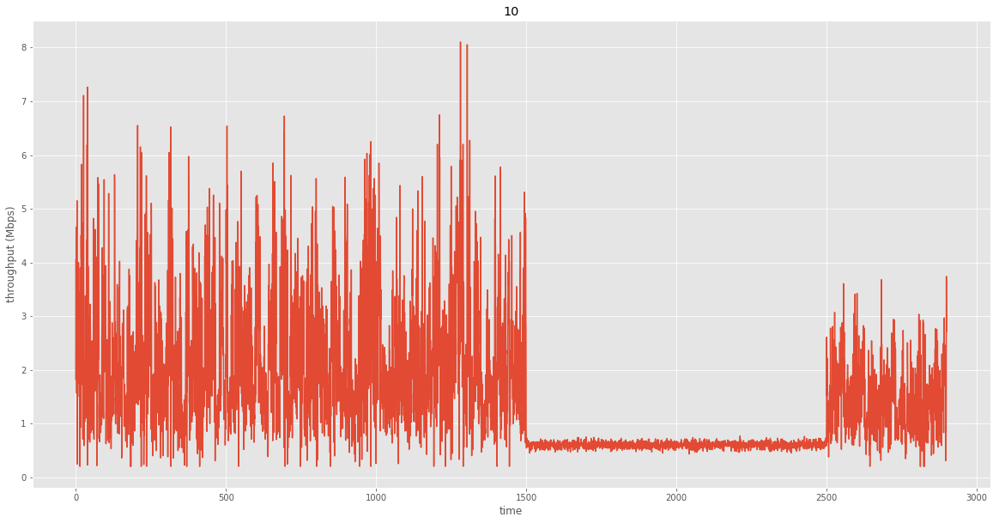

Mean: 1.563
Std: 1.149
Max: 8.105
Min: 0.200
Percentile (5): 0.536
Percentile (20): 0.604
Percentile (50): 1.225
Percentile (80): 2.444
Percentile (95): 3.899


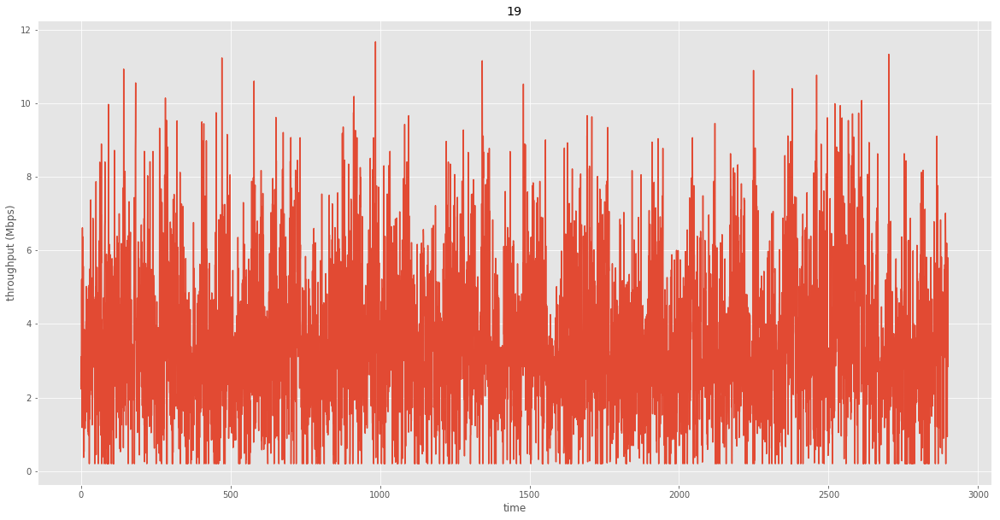

Mean: 3.593
Std: 1.967
Max: 11.679
Min: 0.200
Percentile (5): 0.500
Percentile (20): 1.927
Percentile (50): 3.382
Percentile (80): 5.156
Percentile (95): 7.174


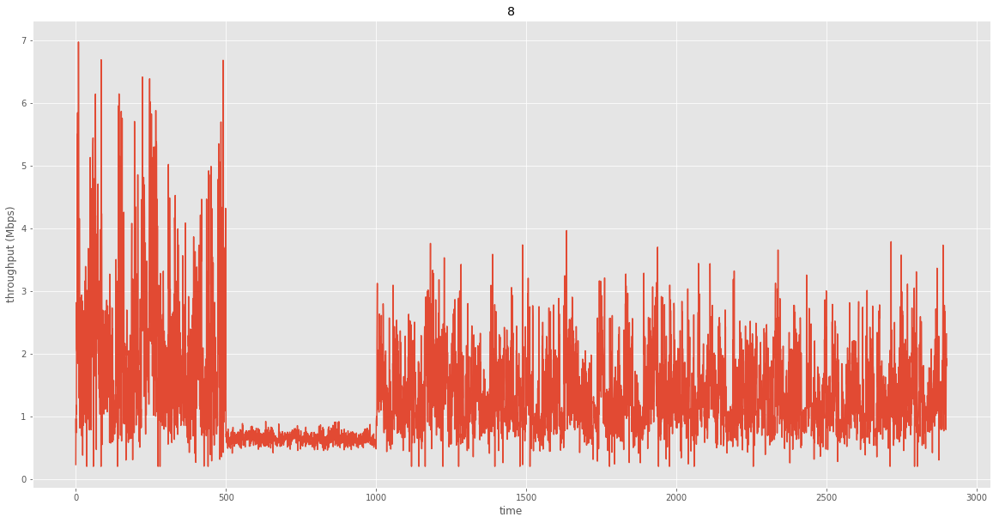

Mean: 1.402
Std: 0.839
Max: 6.973
Min: 0.200
Percentile (5): 0.567
Percentile (20): 0.714
Percentile (50): 1.192
Percentile (80): 1.932
Percentile (95): 2.937


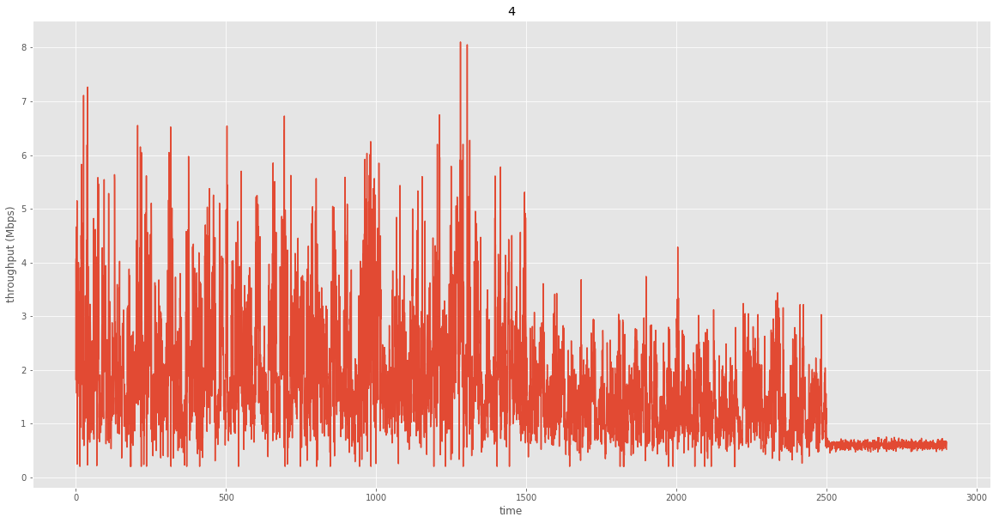

Mean: 1.722
Std: 1.088
Max: 8.105
Min: 0.200
Percentile (5): 0.557
Percentile (20): 0.731
Percentile (50): 1.463
Percentile (80): 2.519
Percentile (95): 3.900


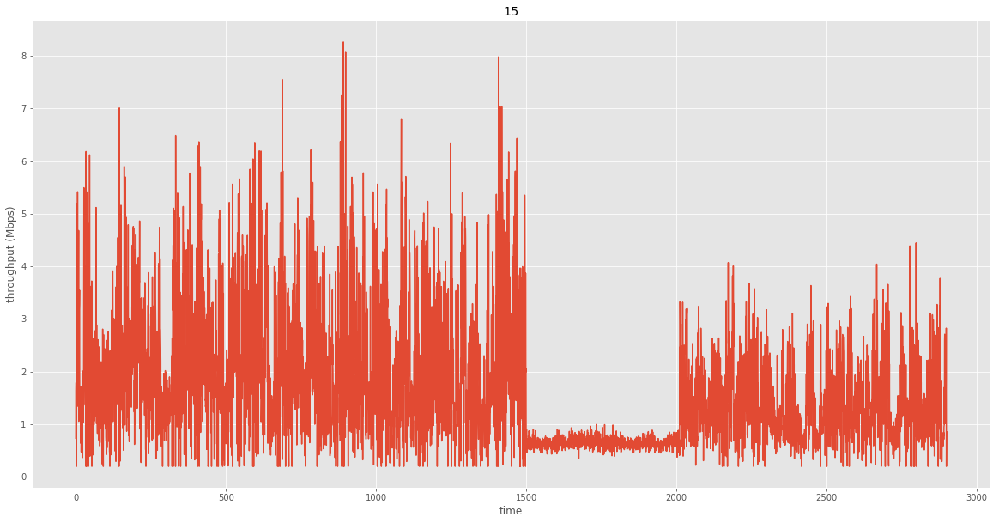

Mean: 1.696
Std: 1.169
Max: 8.261
Min: 0.200
Percentile (5): 0.501
Percentile (20): 0.690
Percentile (50): 1.386
Percentile (80): 2.565
Percentile (95): 4.021


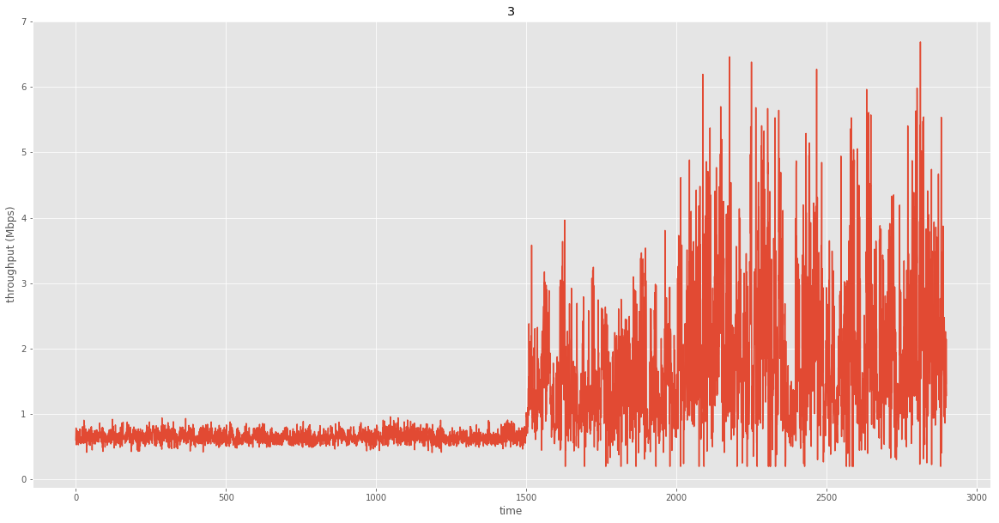

Mean: 1.260
Std: 0.969
Max: 6.687
Min: 0.200
Percentile (5): 0.538
Percentile (20): 0.616
Percentile (50): 0.757
Percentile (80): 1.884
Percentile (95): 3.357


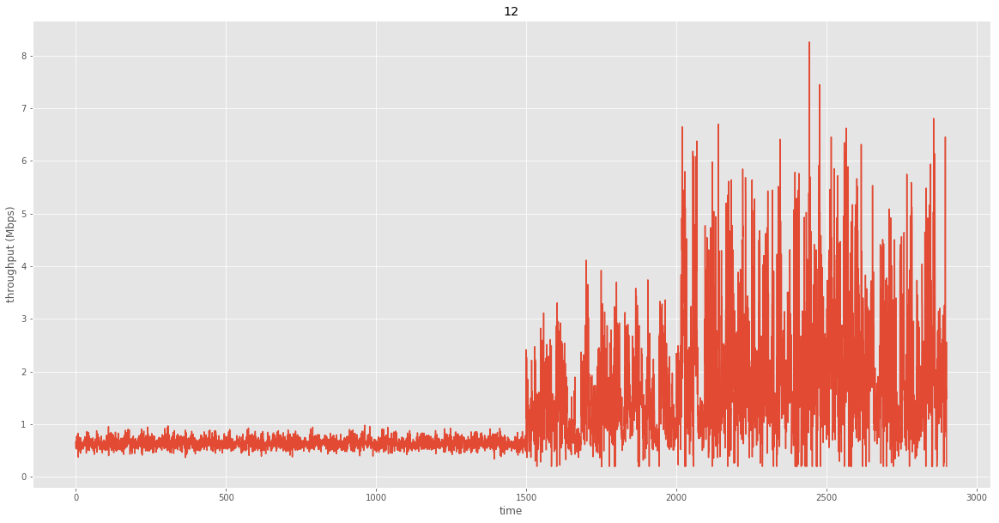

Mean: 1.265
Std: 1.048
Max: 8.258
Min: 0.200
Percentile (5): 0.507
Percentile (20): 0.602
Percentile (50): 0.745
Percentile (80): 1.904
Percentile (95): 3.532


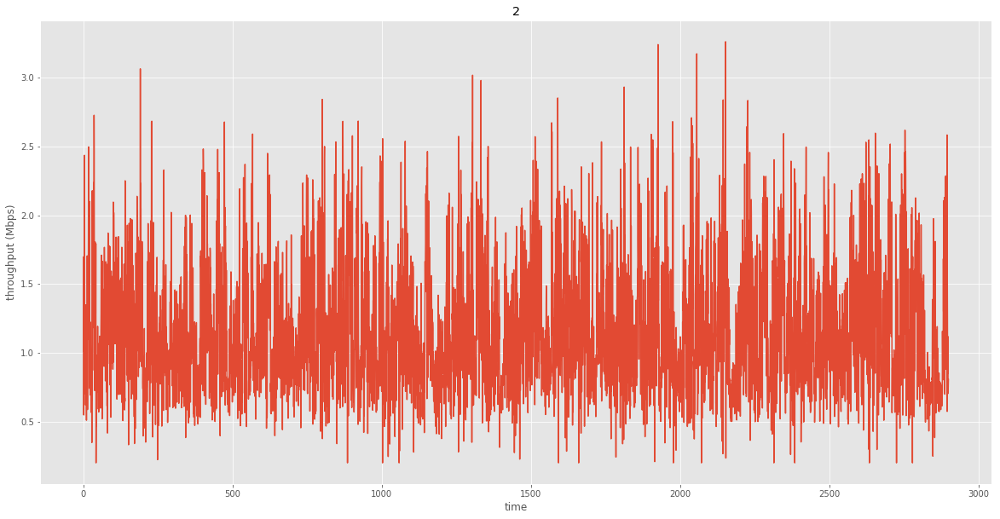

Mean: 1.171
Std: 0.446
Max: 3.262
Min: 0.200
Percentile (5): 0.583
Percentile (20): 0.790
Percentile (50): 1.095
Percentile (80): 1.531
Percentile (95): 2.016


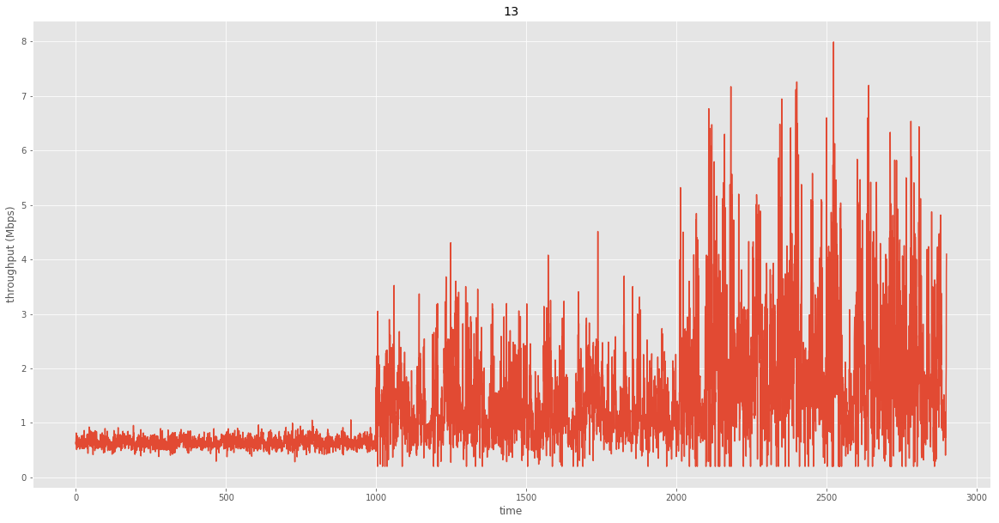

Mean: 1.346
Std: 1.028
Max: 7.993
Min: 0.200
Percentile (5): 0.503
Percentile (20): 0.625
Percentile (50): 0.937
Percentile (80): 1.945
Percentile (95): 3.501


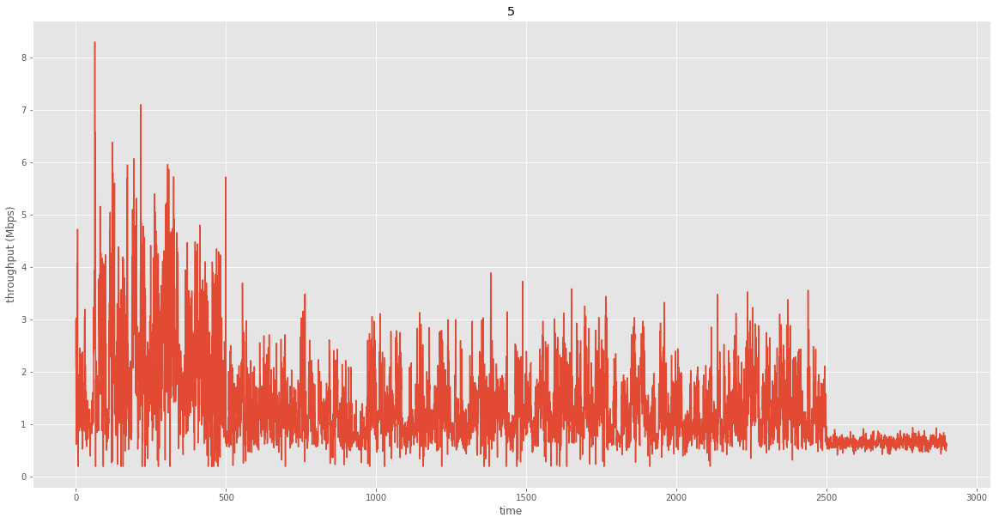

Mean: 1.375
Std: 0.831
Max: 8.288
Min: 0.200
Percentile (5): 0.569
Percentile (20): 0.720
Percentile (50): 1.151
Percentile (80): 1.869
Percentile (95): 3.026


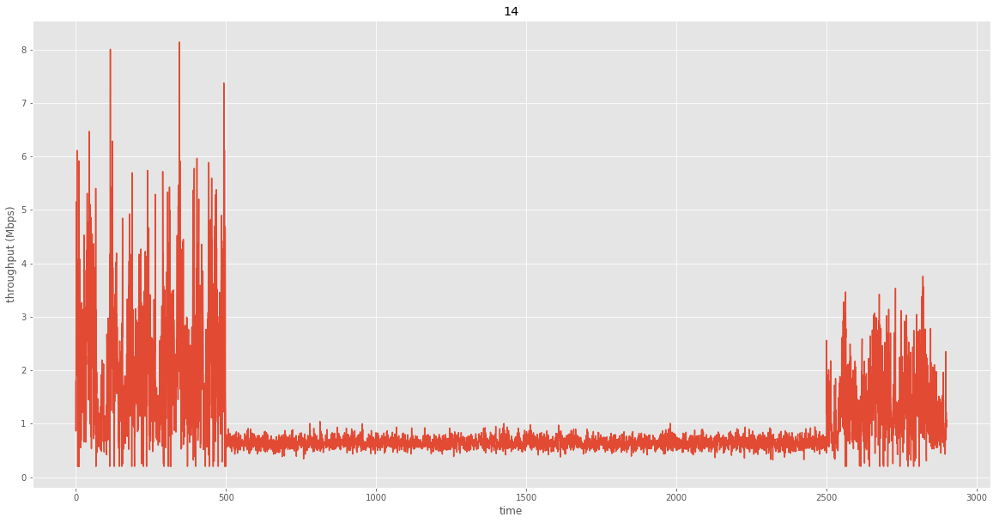

Mean: 1.018
Std: 0.841
Max: 8.142
Min: 0.200
Percentile (5): 0.507
Percentile (20): 0.587
Percentile (50): 0.685
Percentile (80): 1.266
Percentile (95): 2.830


In [119]:
get_analysis_result('new_network_trace/')

### Middle Network Analysis

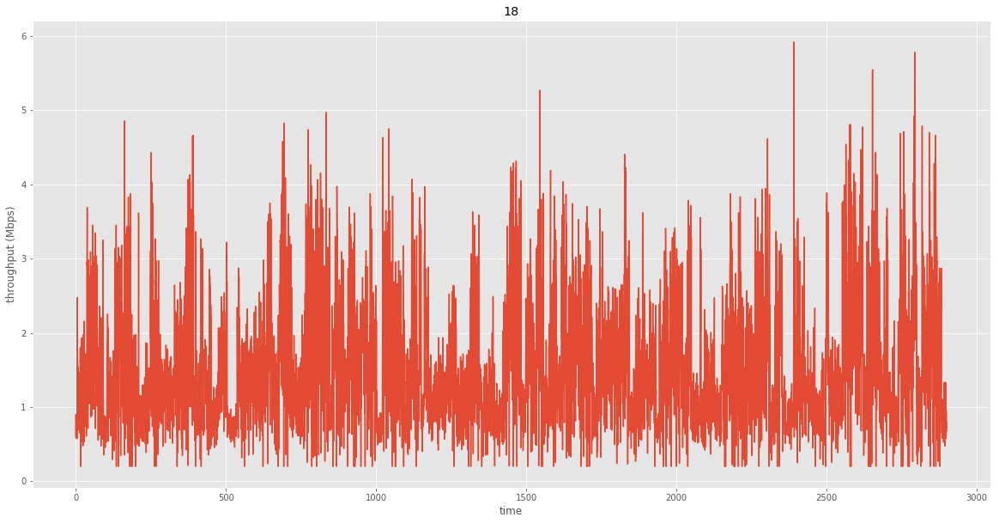

Mean: 1.543
Std: 0.831
Max: 5.920
Min: 0.200
Percentile (5): 0.523
Percentile (20): 0.853
Percentile (50): 1.362
Percentile (80): 2.194
Percentile (95): 3.179


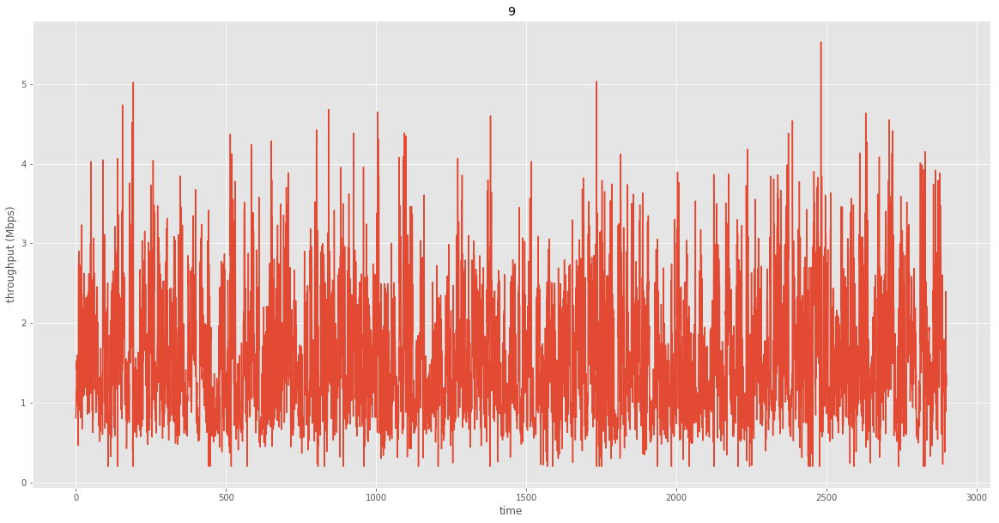

Mean: 1.600
Std: 0.778
Max: 5.529
Min: 0.200
Percentile (5): 0.608
Percentile (20): 0.905
Percentile (50): 1.463
Percentile (80): 2.240
Percentile (95): 3.045


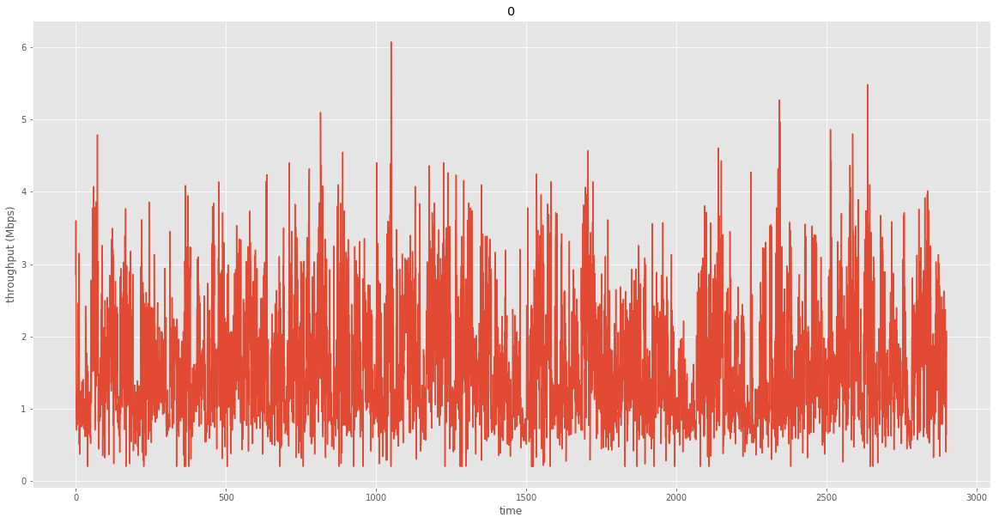

Mean: 1.636
Std: 0.794
Max: 6.073
Min: 0.200
Percentile (5): 0.620
Percentile (20): 0.939
Percentile (50): 1.491
Percentile (80): 2.274
Percentile (95): 3.122


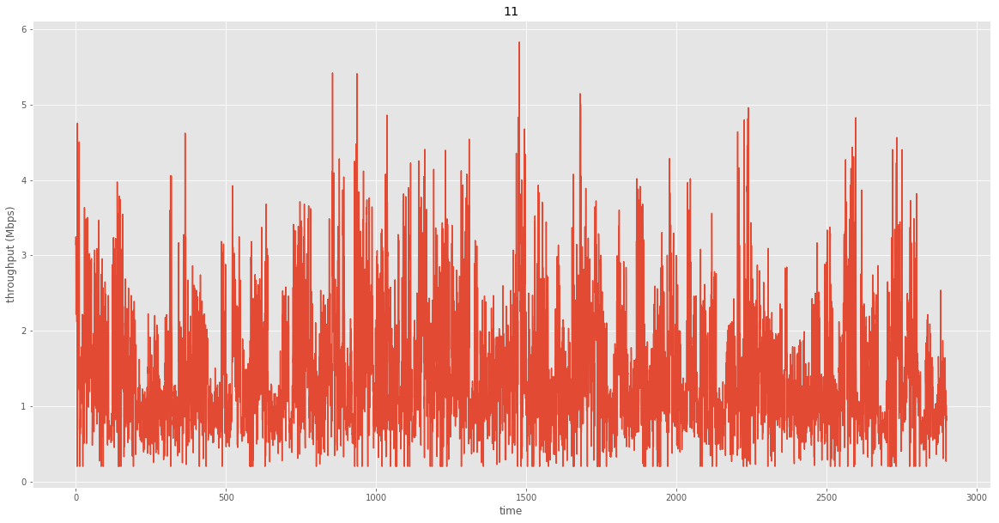

Mean: 1.490
Std: 0.808
Max: 5.830
Min: 0.200
Percentile (5): 0.481
Percentile (20): 0.817
Percentile (50): 1.317
Percentile (80): 2.102
Percentile (95): 3.081


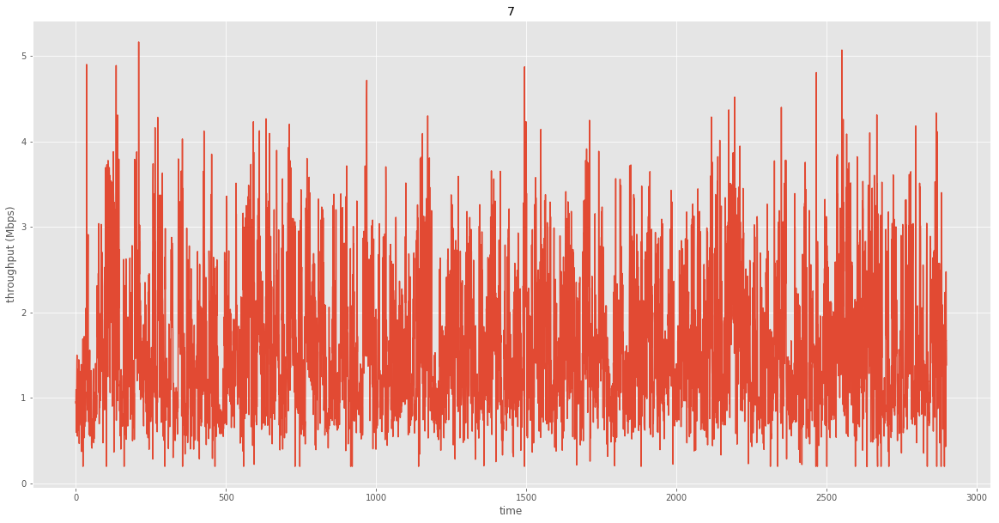

Mean: 1.634
Std: 0.791
Max: 5.164
Min: 0.200
Percentile (5): 0.627
Percentile (20): 0.937
Percentile (50): 1.488
Percentile (80): 2.301
Percentile (95): 3.140


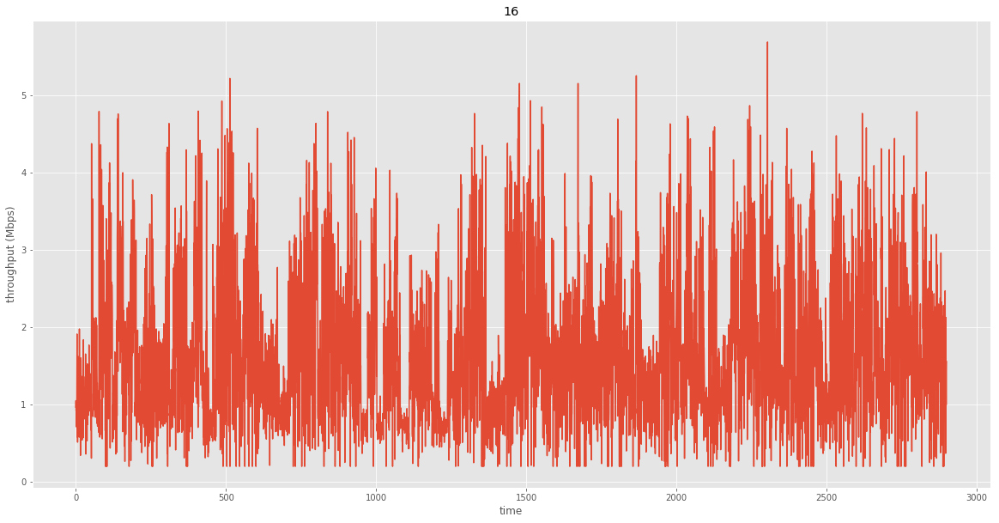

Mean: 1.680
Std: 0.900
Max: 5.687
Min: 0.200
Percentile (5): 0.512
Percentile (20): 0.888
Percentile (50): 1.524
Percentile (80): 2.392
Percentile (95): 3.396


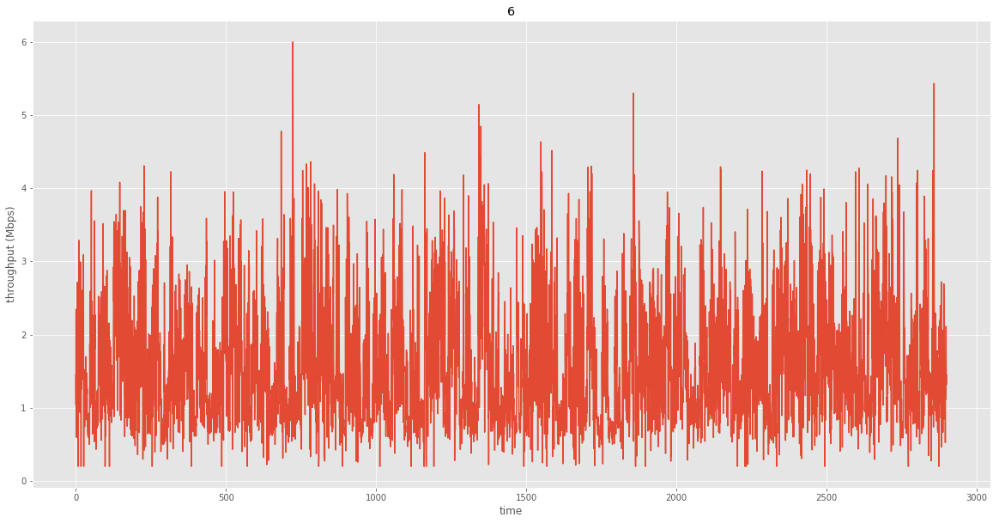

Mean: 1.623
Std: 0.808
Max: 5.999
Min: 0.200
Percentile (5): 0.621
Percentile (20): 0.909
Percentile (50): 1.464
Percentile (80): 2.282
Percentile (95): 3.206


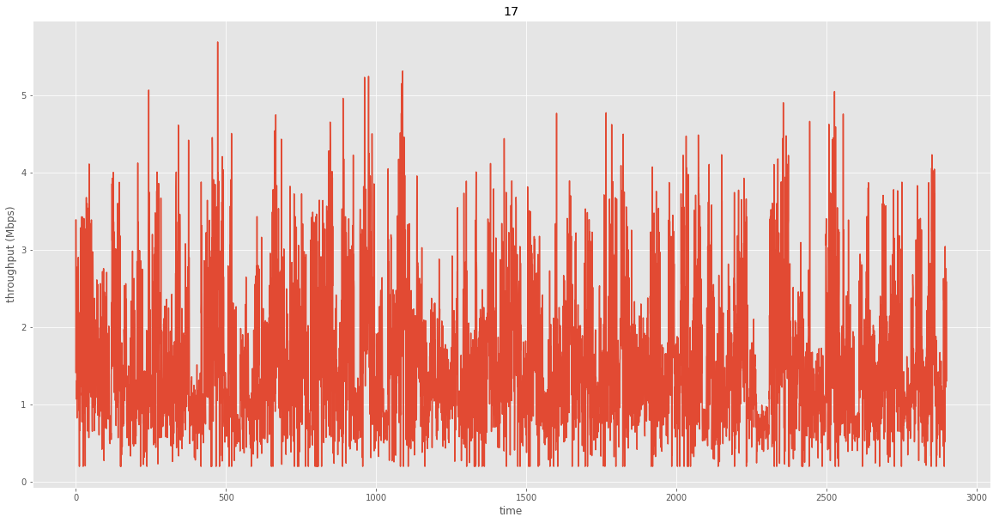

Mean: 1.595
Std: 0.864
Max: 5.689
Min: 0.200
Percentile (5): 0.512
Percentile (20): 0.870
Percentile (50): 1.420
Percentile (80): 2.256
Percentile (95): 3.317


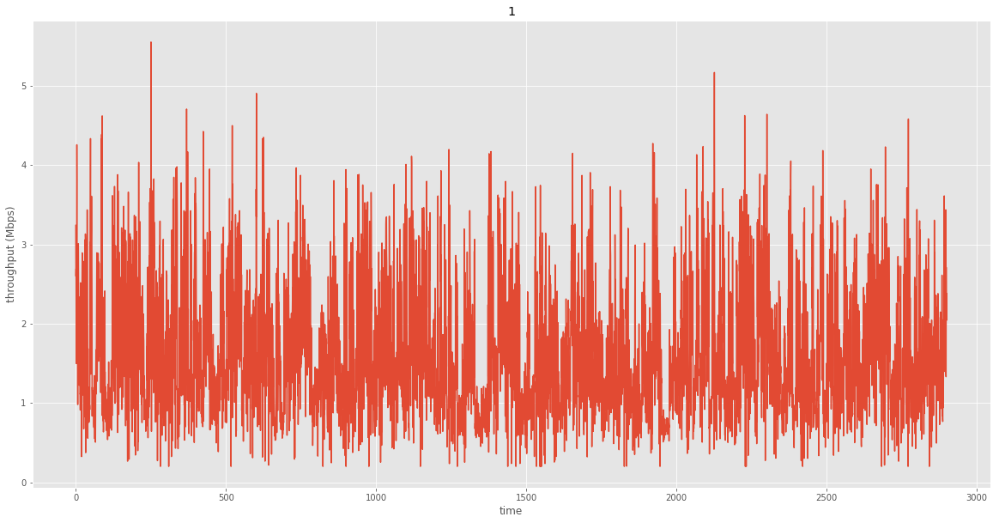

Mean: 1.645
Std: 0.786
Max: 5.555
Min: 0.200
Percentile (5): 0.636
Percentile (20): 0.952
Percentile (50): 1.502
Percentile (80): 2.293
Percentile (95): 3.136


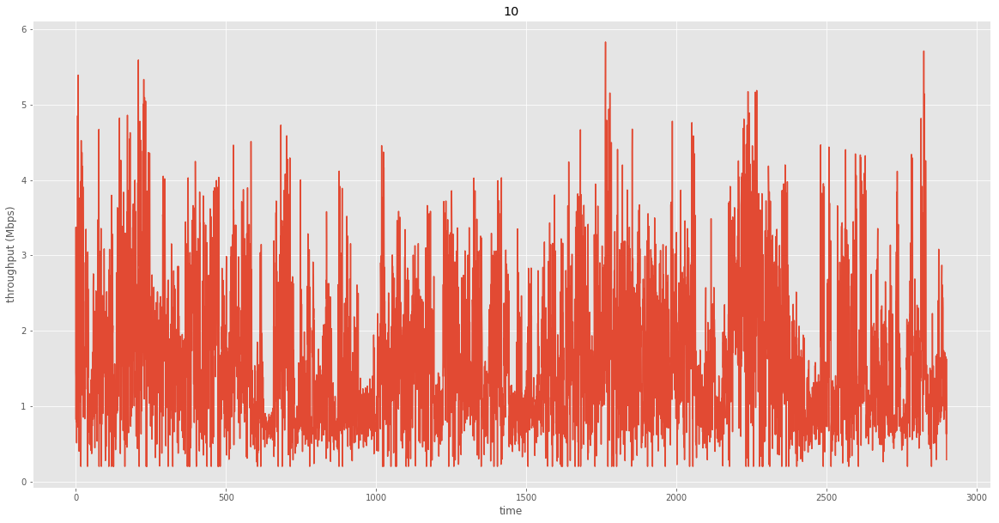

Mean: 1.654
Std: 0.918
Max: 5.833
Min: 0.200
Percentile (5): 0.495
Percentile (20): 0.851
Percentile (50): 1.476
Percentile (80): 2.391
Percentile (95): 3.410


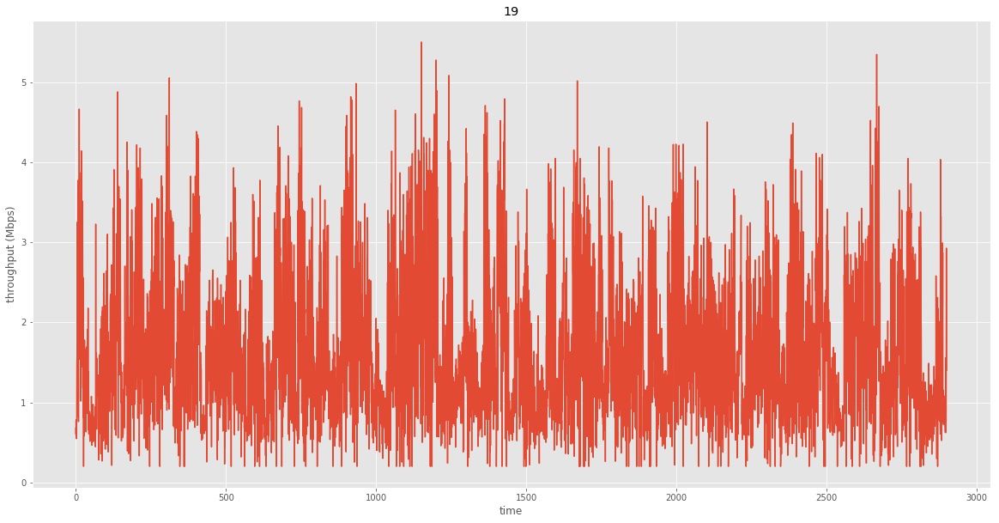

Mean: 1.656
Std: 0.880
Max: 5.508
Min: 0.200
Percentile (5): 0.533
Percentile (20): 0.891
Percentile (50): 1.477
Percentile (80): 2.366
Percentile (95): 3.341


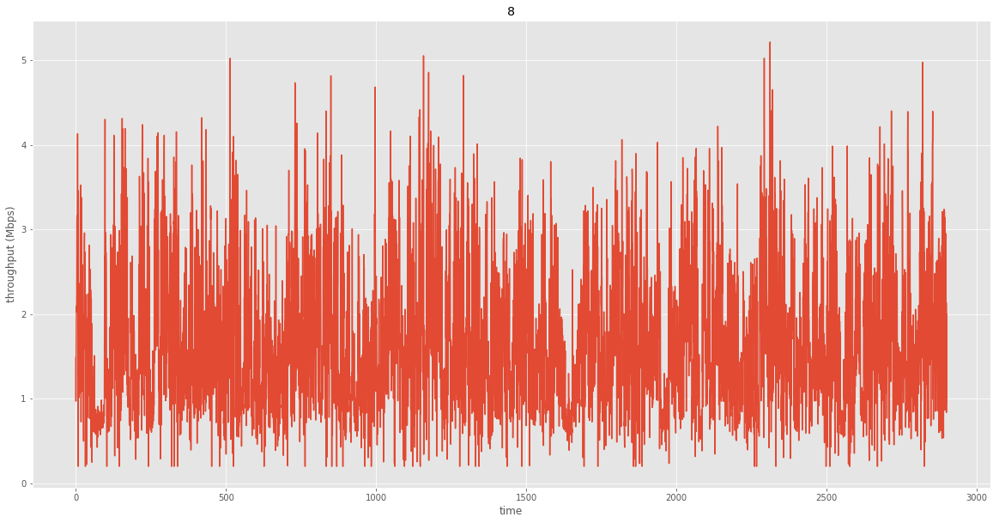

Mean: 1.693
Std: 0.826
Max: 5.218
Min: 0.200
Percentile (5): 0.617
Percentile (20): 0.951
Percentile (50): 1.560
Percentile (80): 2.384
Percentile (95): 3.241


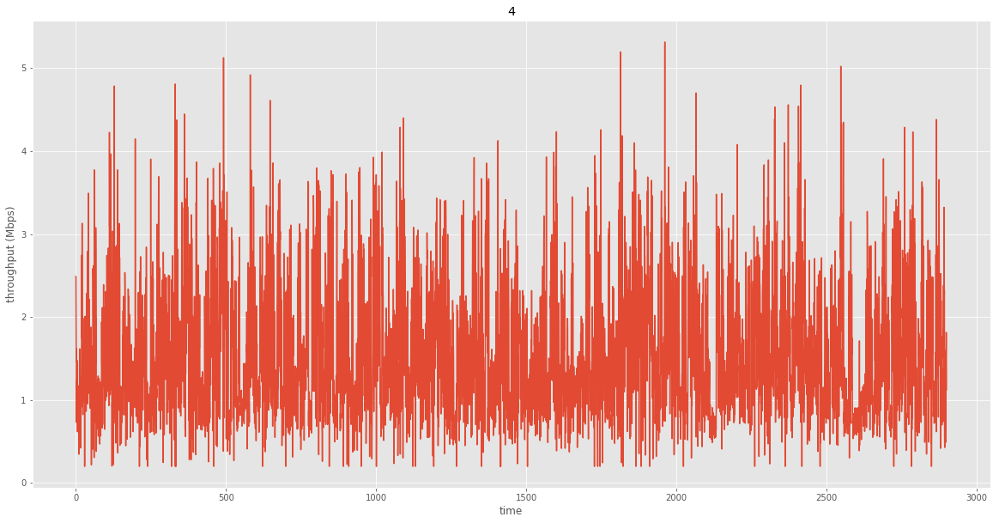

Mean: 1.591
Std: 0.775
Max: 5.316
Min: 0.200
Percentile (5): 0.607
Percentile (20): 0.903
Percentile (50): 1.464
Percentile (80): 2.217
Percentile (95): 3.064


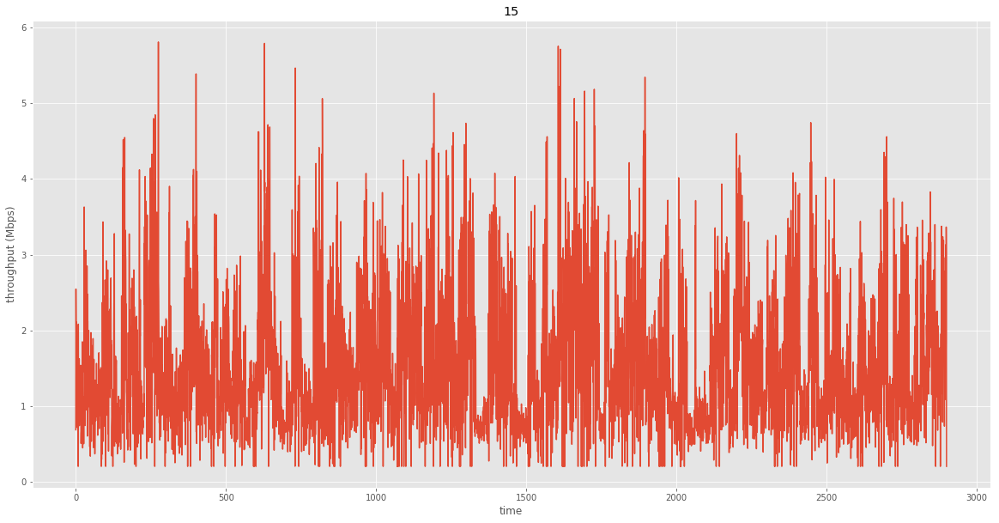

Mean: 1.560
Std: 0.866
Max: 5.812
Min: 0.200
Percentile (5): 0.512
Percentile (20): 0.822
Percentile (50): 1.361
Percentile (80): 2.242
Percentile (95): 3.212


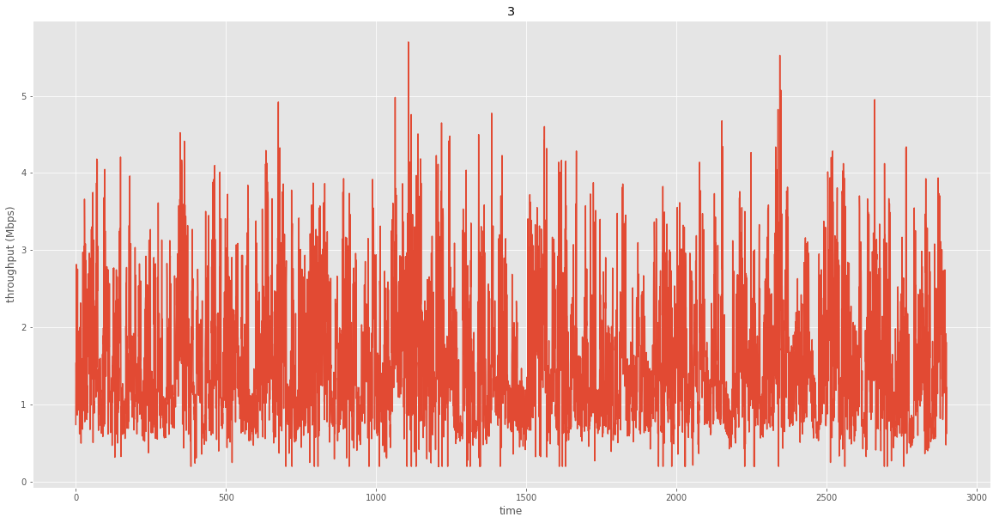

Mean: 1.632
Std: 0.814
Max: 5.697
Min: 0.200
Percentile (5): 0.627
Percentile (20): 0.914
Percentile (50): 1.480
Percentile (80): 2.297
Percentile (95): 3.189


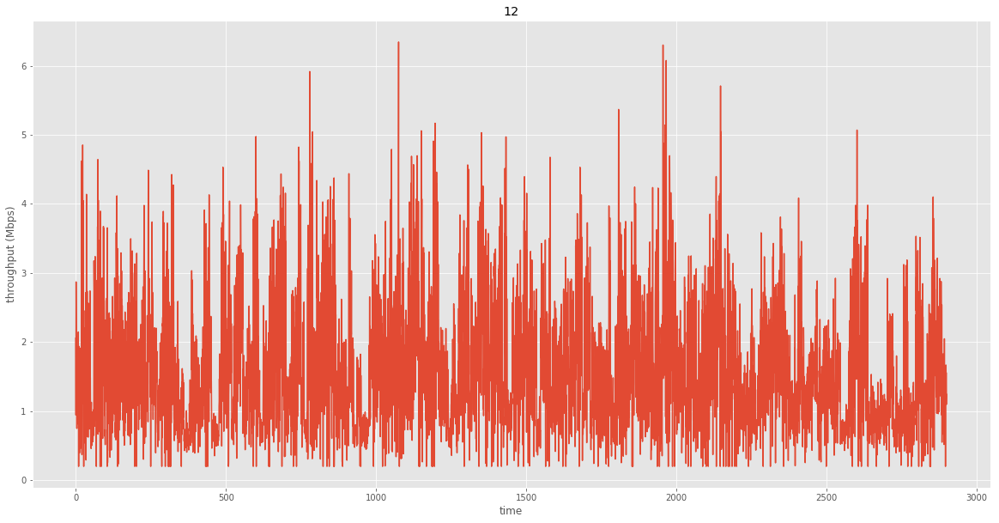

Mean: 1.615
Std: 0.887
Max: 6.344
Min: 0.200
Percentile (5): 0.497
Percentile (20): 0.844
Percentile (50): 1.451
Percentile (80): 2.317
Percentile (95): 3.317


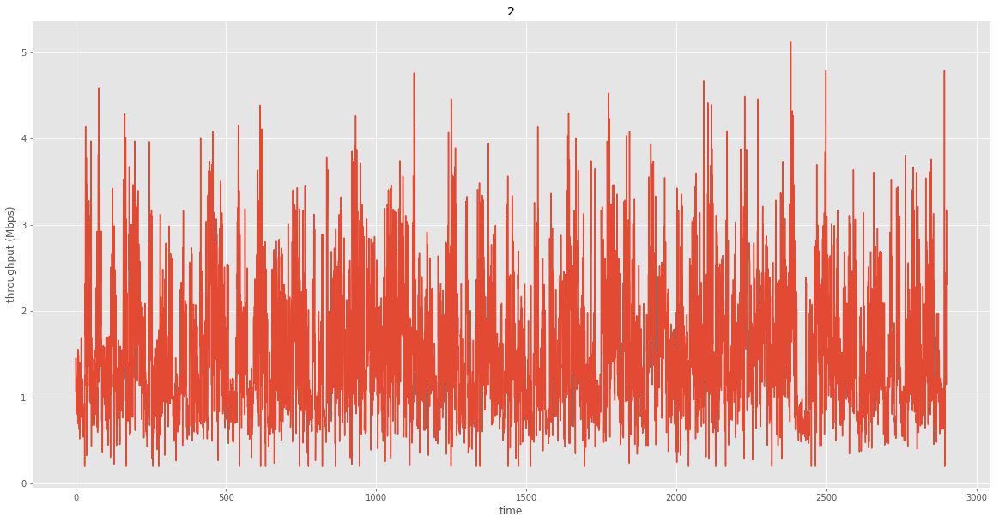

Mean: 1.575
Std: 0.758
Max: 5.117
Min: 0.200
Percentile (5): 0.618
Percentile (20): 0.914
Percentile (50): 1.437
Percentile (80): 2.174
Percentile (95): 3.024


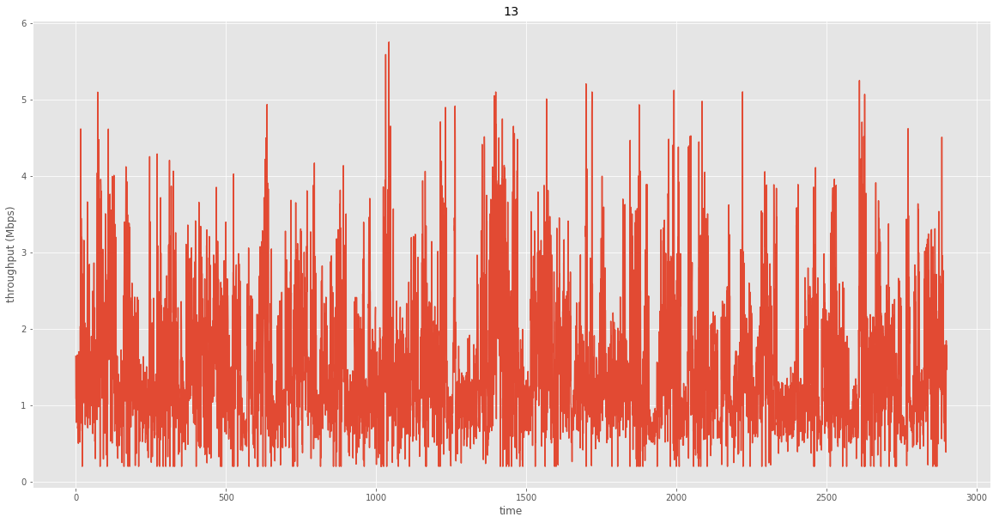

Mean: 1.551
Std: 0.855
Max: 5.749
Min: 0.200
Percentile (5): 0.500
Percentile (20): 0.839
Percentile (50): 1.359
Percentile (80): 2.200
Percentile (95): 3.232


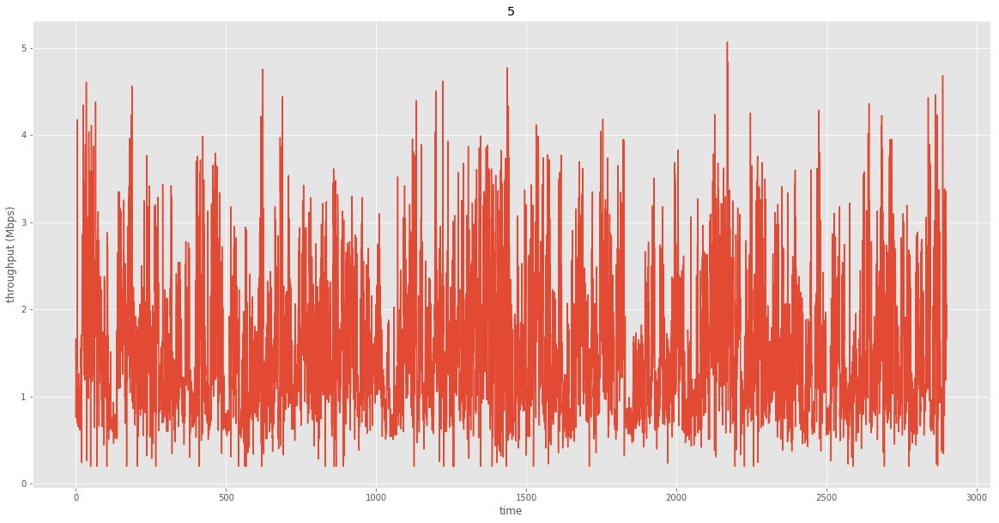

Mean: 1.584
Std: 0.789
Max: 5.066
Min: 0.200
Percentile (5): 0.612
Percentile (20): 0.883
Percentile (50): 1.425
Percentile (80): 2.216
Percentile (95): 3.113


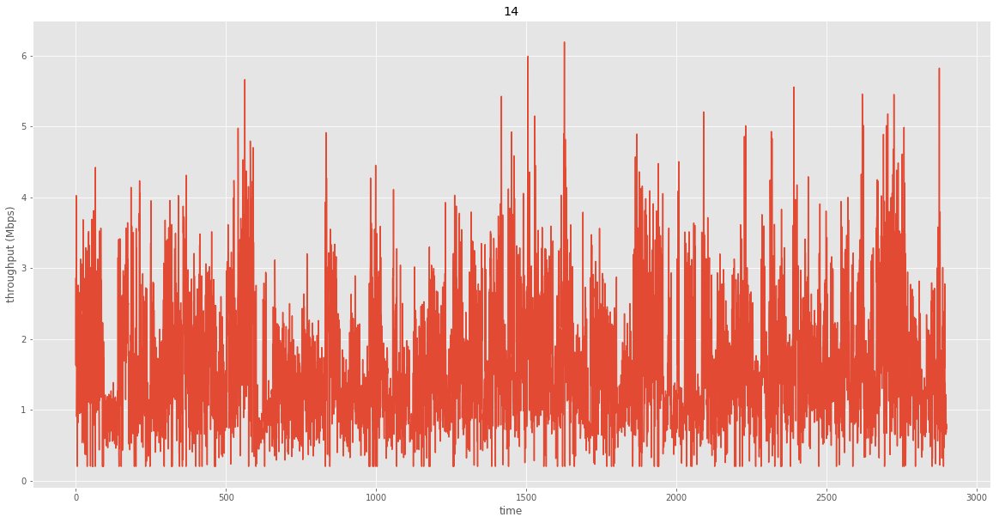

Mean: 1.660
Std: 0.879
Max: 6.190
Min: 0.200
Percentile (5): 0.527
Percentile (20): 0.912
Percentile (50): 1.500
Percentile (80): 2.349
Percentile (95): 3.325


In [50]:
get_analysis_result('network_trace/middle/')

### Weak Network Analysis

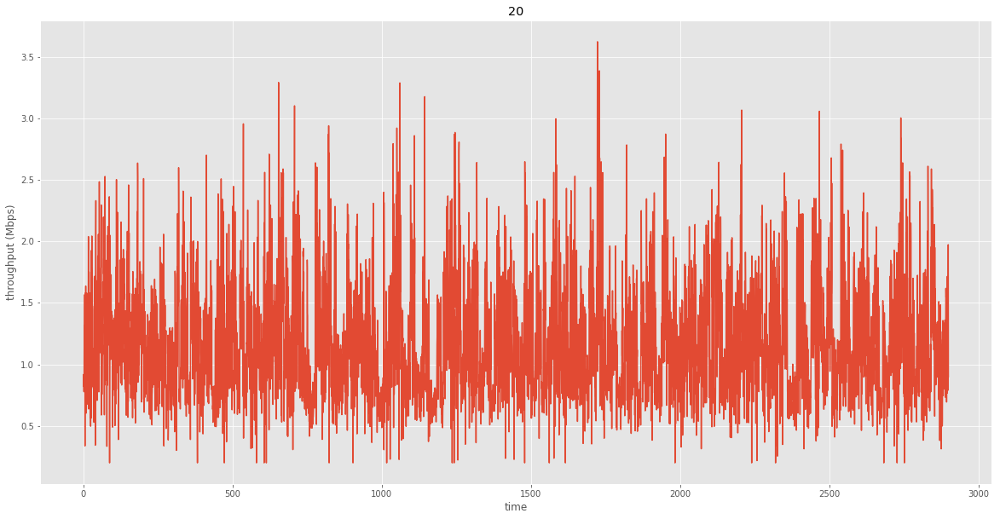

Mean: 1.178
Std: 0.456
Max: 3.623
Min: 0.200
Percentile (5): 0.586
Percentile (20): 0.781
Percentile (50): 1.101
Percentile (80): 1.536
Percentile (95): 2.036


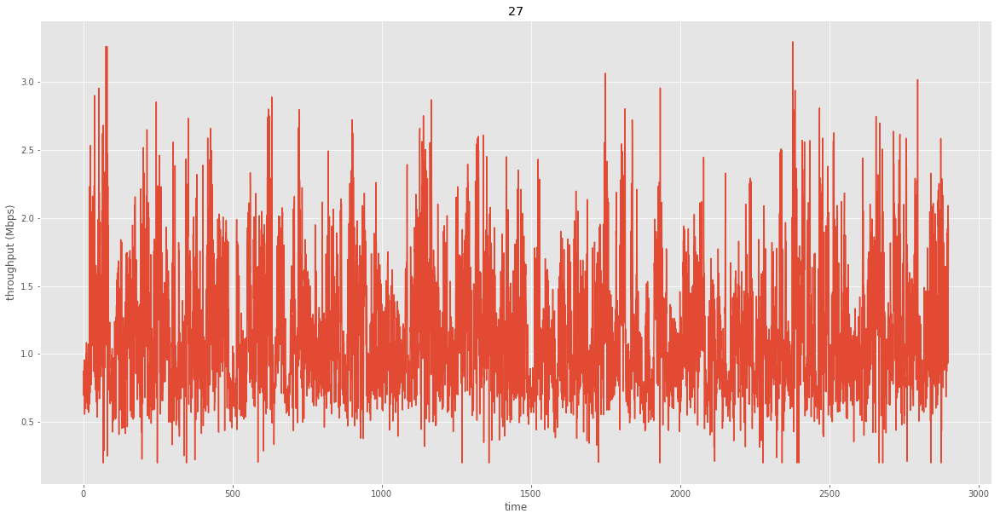

Mean: 1.163
Std: 0.457
Max: 3.296
Min: 0.200
Percentile (5): 0.590
Percentile (20): 0.775
Percentile (50): 1.076
Percentile (80): 1.520
Percentile (95): 2.037


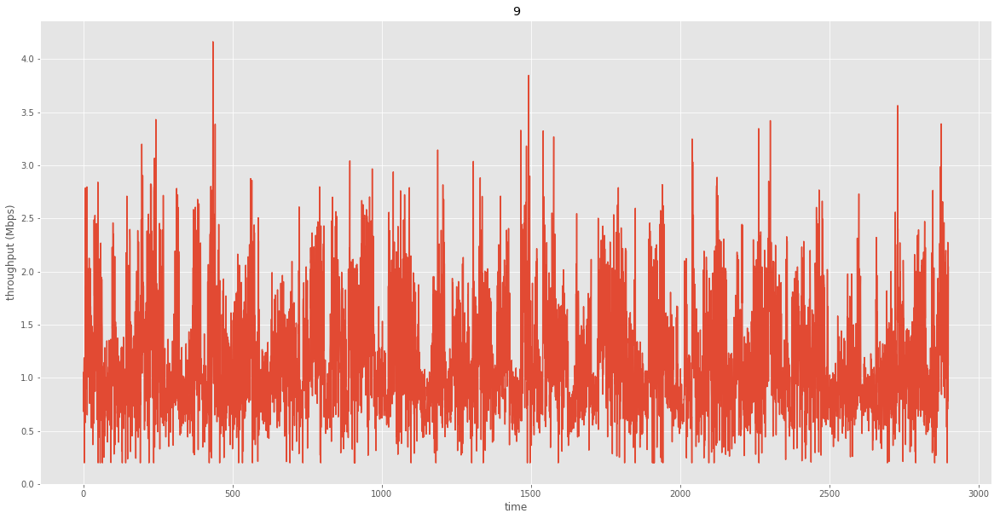

Mean: 1.193
Std: 0.526
Max: 4.164
Min: 0.200
Percentile (5): 0.513
Percentile (20): 0.757
Percentile (50): 1.089
Percentile (80): 1.614
Percentile (95): 2.199


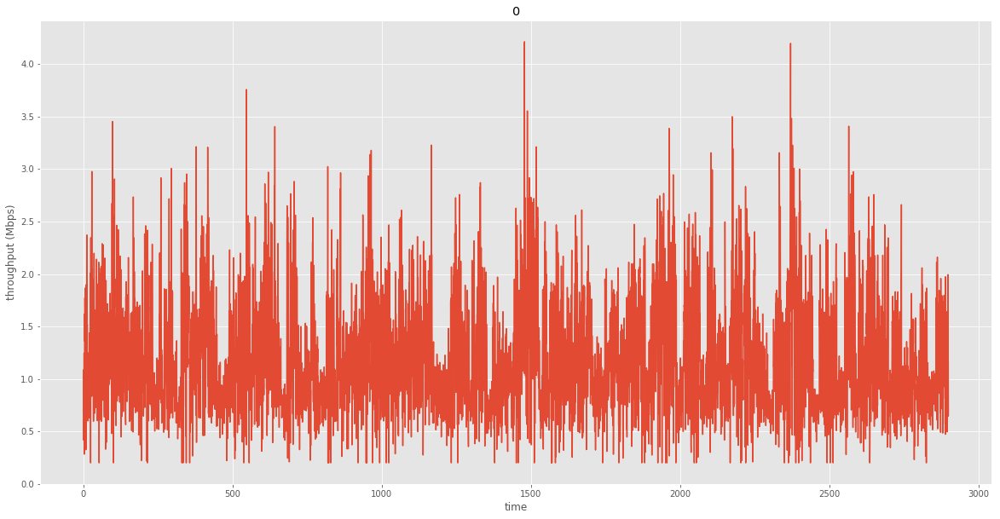

Mean: 1.207
Std: 0.529
Max: 4.215
Min: 0.200
Percentile (5): 0.511
Percentile (20): 0.759
Percentile (50): 1.118
Percentile (80): 1.632
Percentile (95): 2.198


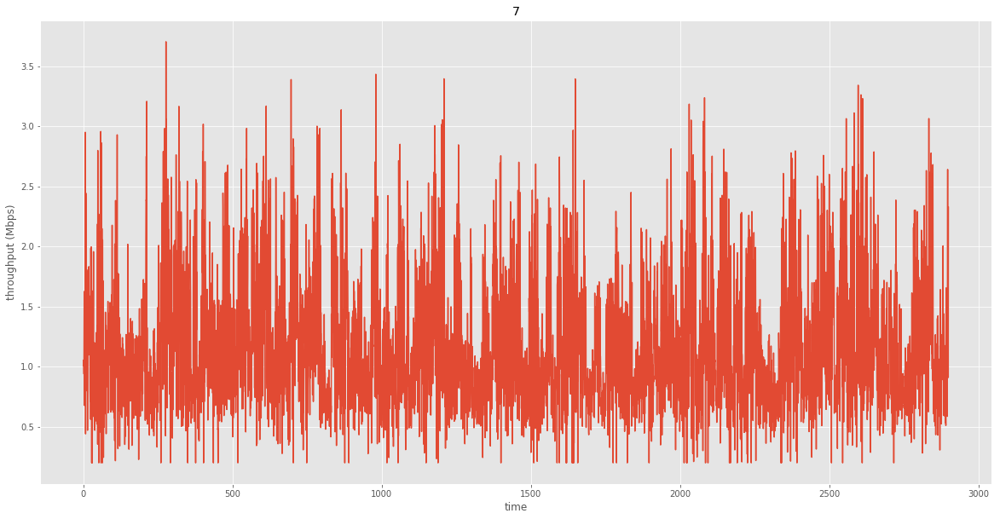

Mean: 1.190
Std: 0.527
Max: 3.703
Min: 0.200
Percentile (5): 0.512
Percentile (20): 0.758
Percentile (50): 1.085
Percentile (80): 1.600
Percentile (95): 2.202


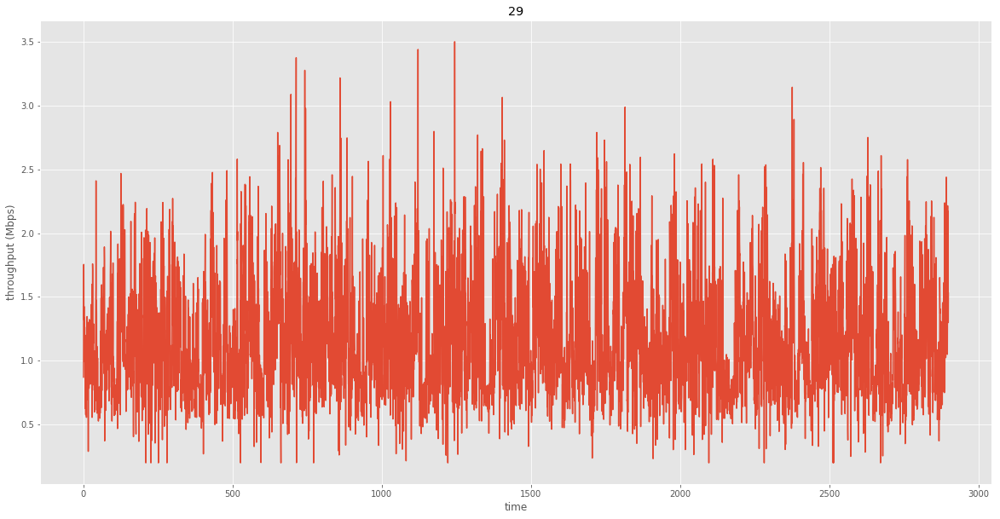

Mean: 1.183
Std: 0.457
Max: 3.501
Min: 0.200
Percentile (5): 0.585
Percentile (20): 0.792
Percentile (50): 1.106
Percentile (80): 1.551
Percentile (95): 2.040


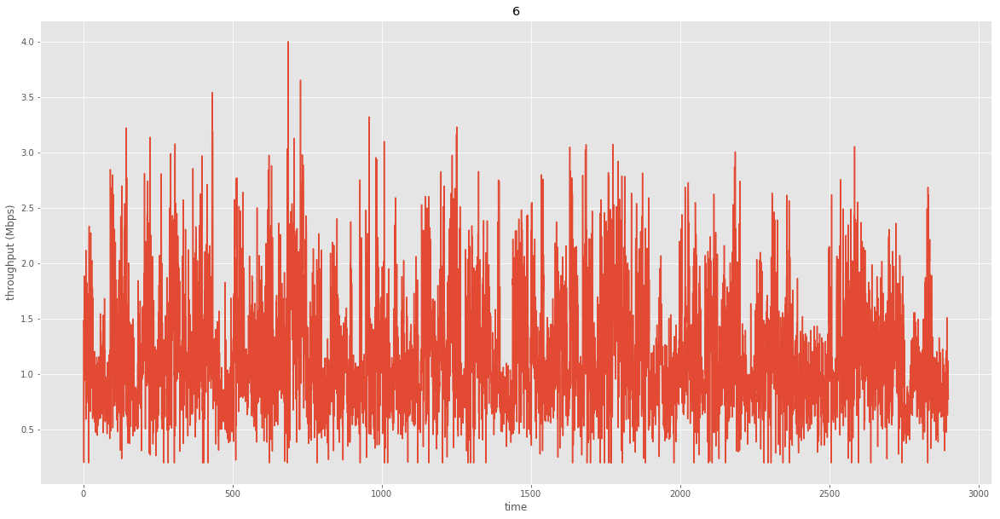

Mean: 1.194
Std: 0.524
Max: 4.004
Min: 0.200
Percentile (5): 0.505
Percentile (20): 0.761
Percentile (50): 1.089
Percentile (80): 1.606
Percentile (95): 2.192


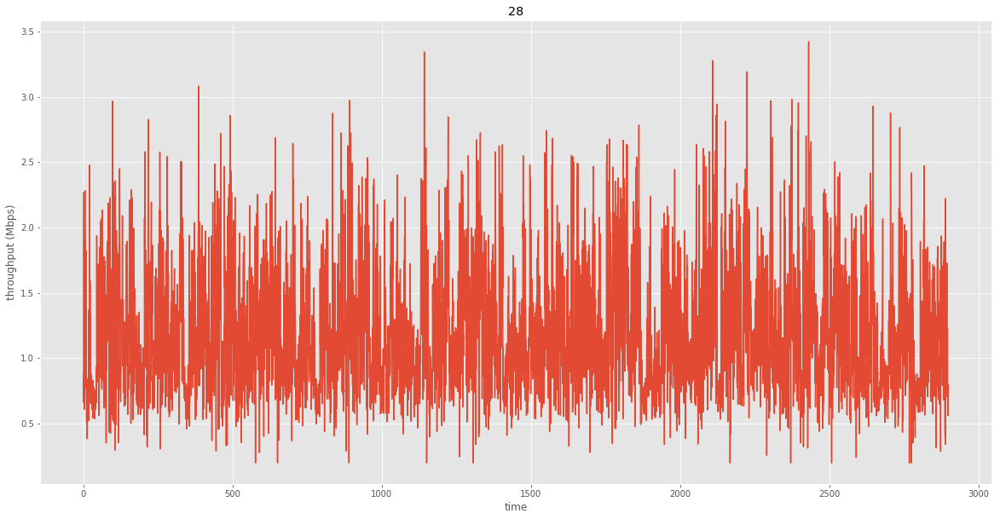

Mean: 1.198
Std: 0.466
Max: 3.422
Min: 0.200
Percentile (5): 0.606
Percentile (20): 0.793
Percentile (50): 1.108
Percentile (80): 1.576
Percentile (95): 2.071


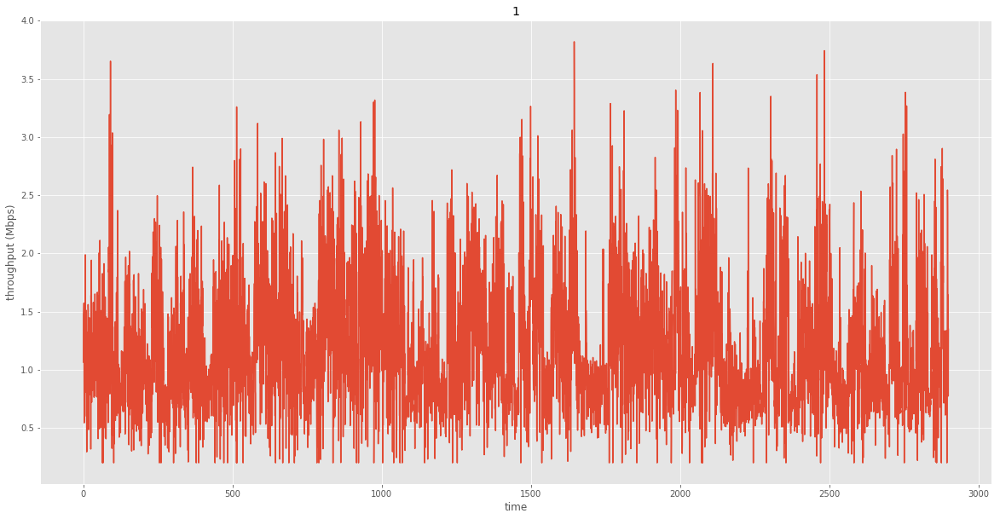

Mean: 1.212
Std: 0.538
Max: 3.821
Min: 0.200
Percentile (5): 0.504
Percentile (20): 0.759
Percentile (50): 1.120
Percentile (80): 1.636
Percentile (95): 2.228


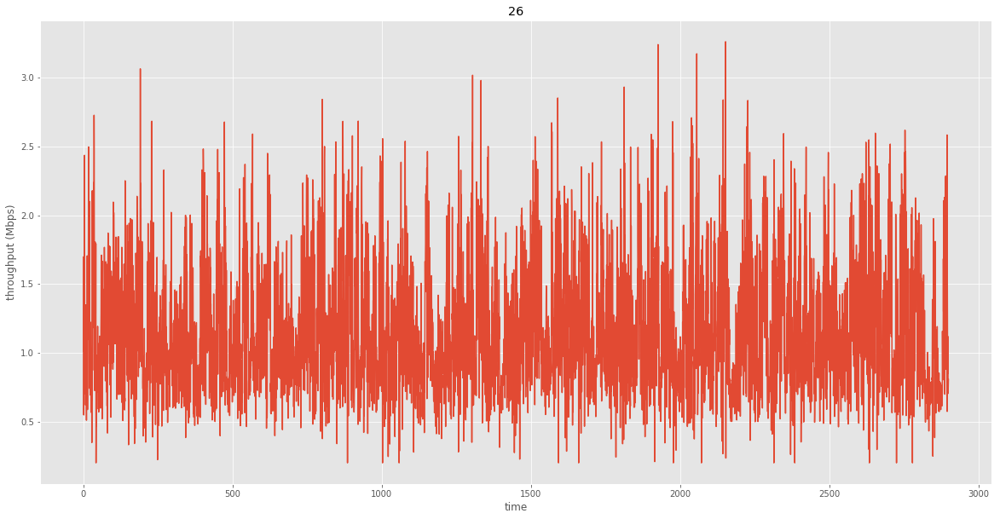

Mean: 1.171
Std: 0.446
Max: 3.262
Min: 0.200
Percentile (5): 0.583
Percentile (20): 0.790
Percentile (50): 1.095
Percentile (80): 1.531
Percentile (95): 2.016


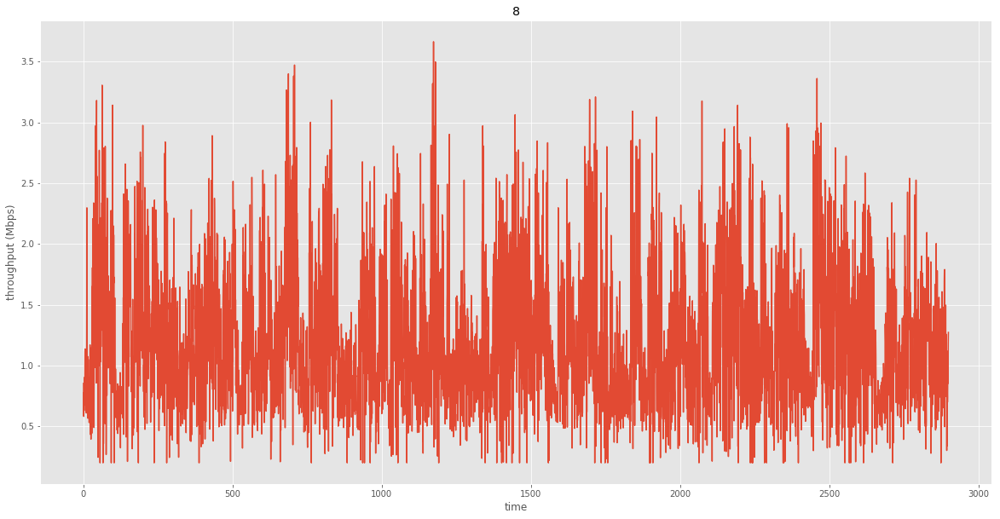

Mean: 1.219
Std: 0.545
Max: 3.664
Min: 0.200
Percentile (5): 0.500
Percentile (20): 0.759
Percentile (50): 1.118
Percentile (80): 1.640
Percentile (95): 2.257


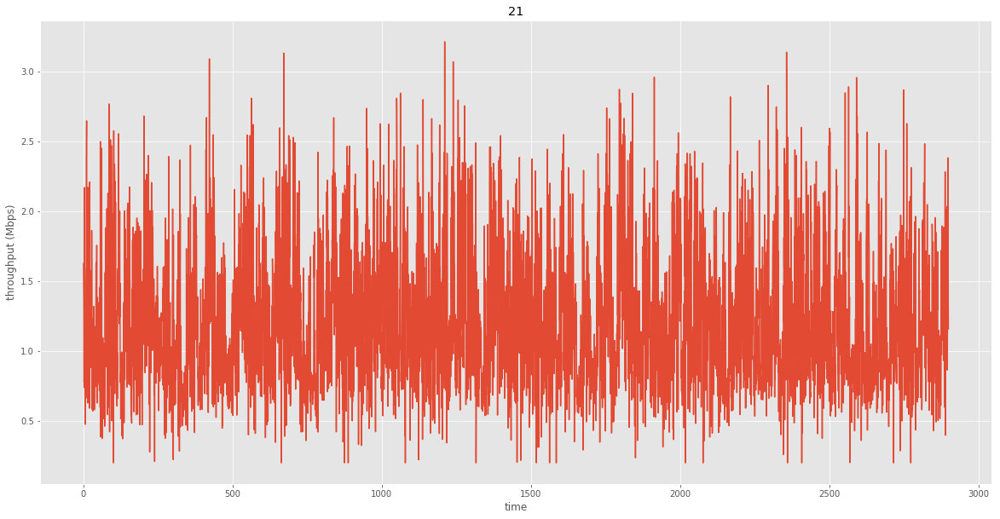

Mean: 1.227
Std: 0.478
Max: 3.212
Min: 0.200
Percentile (5): 0.598
Percentile (20): 0.818
Percentile (50): 1.145
Percentile (80): 1.619
Percentile (95): 2.134


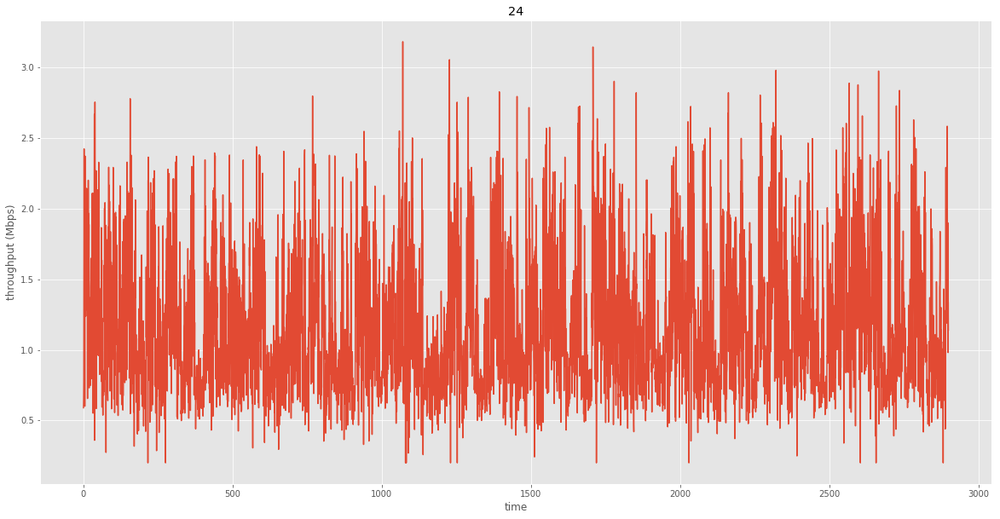

Mean: 1.174
Std: 0.468
Max: 3.184
Min: 0.200
Percentile (5): 0.589
Percentile (20): 0.772
Percentile (50): 1.068
Percentile (80): 1.573
Percentile (95): 2.078


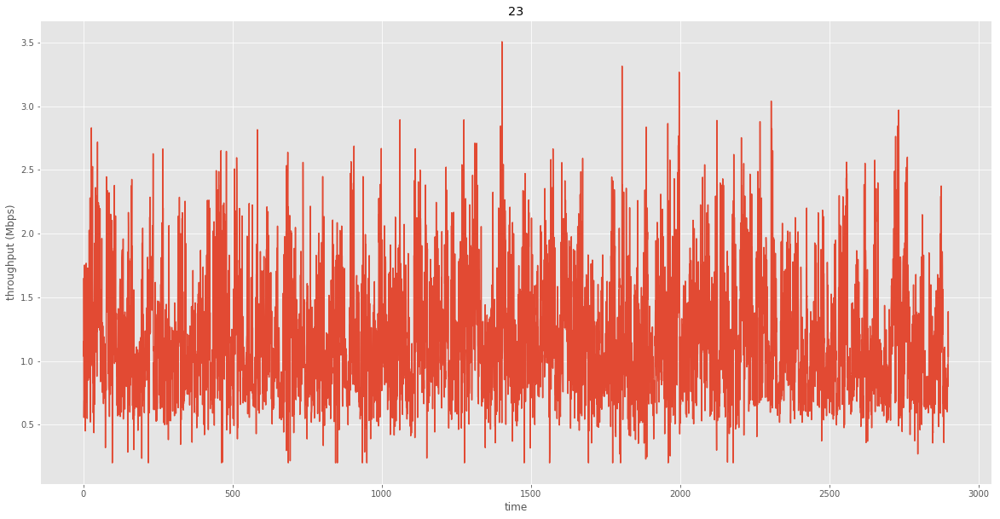

Mean: 1.198
Std: 0.463
Max: 3.507
Min: 0.200
Percentile (5): 0.596
Percentile (20): 0.797
Percentile (50): 1.118
Percentile (80): 1.563
Percentile (95): 2.083


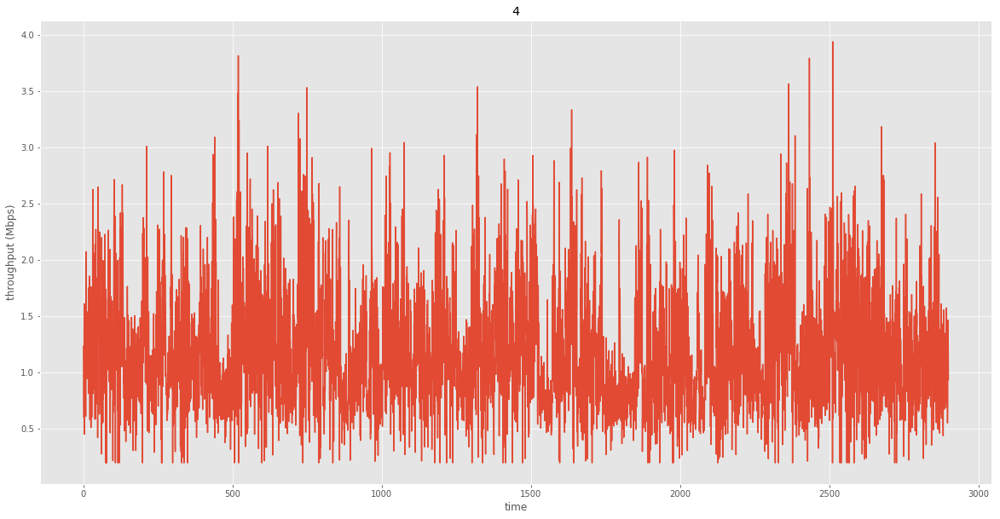

Mean: 1.204
Std: 0.514
Max: 3.940
Min: 0.200
Percentile (5): 0.522
Percentile (20): 0.780
Percentile (50): 1.117
Percentile (80): 1.612
Percentile (95): 2.172


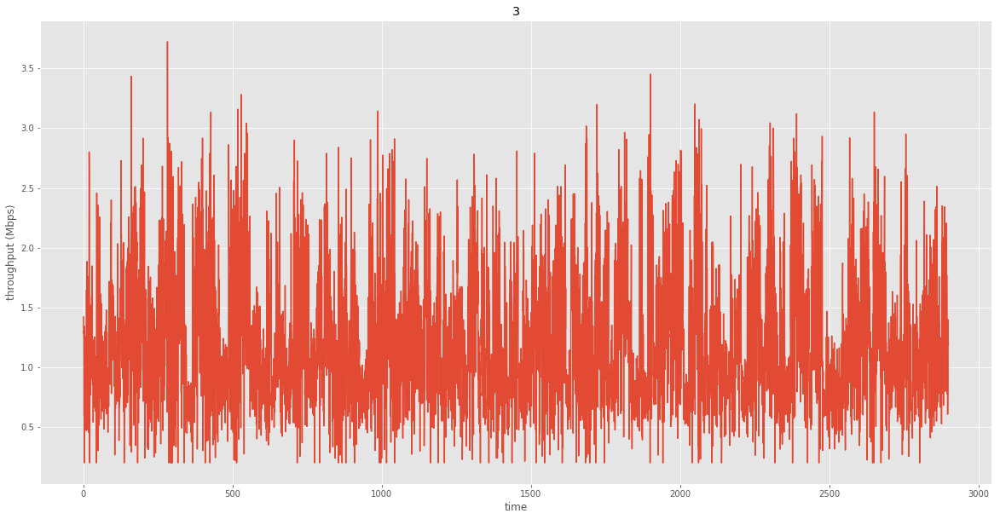

Mean: 1.225
Std: 0.541
Max: 3.724
Min: 0.200
Percentile (5): 0.496
Percentile (20): 0.766
Percentile (50): 1.137
Percentile (80): 1.677
Percentile (95): 2.250


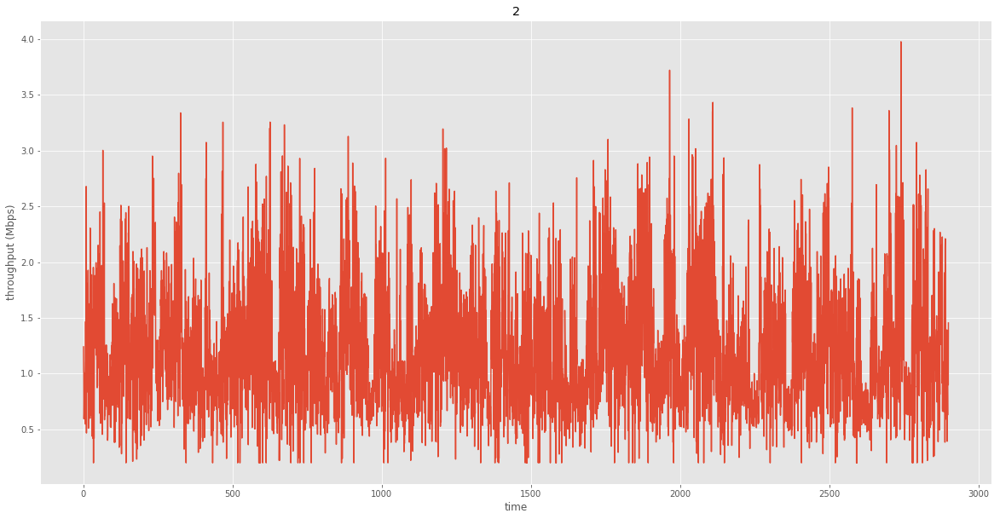

Mean: 1.228
Std: 0.538
Max: 3.978
Min: 0.200
Percentile (5): 0.517
Percentile (20): 0.766
Percentile (50): 1.143
Percentile (80): 1.662
Percentile (95): 2.247


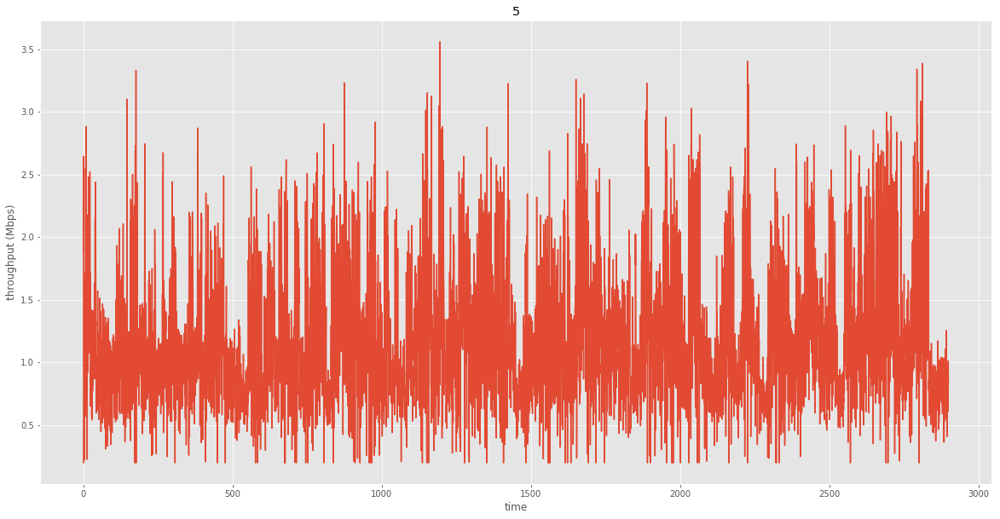

Mean: 1.193
Std: 0.527
Max: 3.559
Min: 0.200
Percentile (5): 0.518
Percentile (20): 0.757
Percentile (50): 1.091
Percentile (80): 1.598
Percentile (95): 2.209


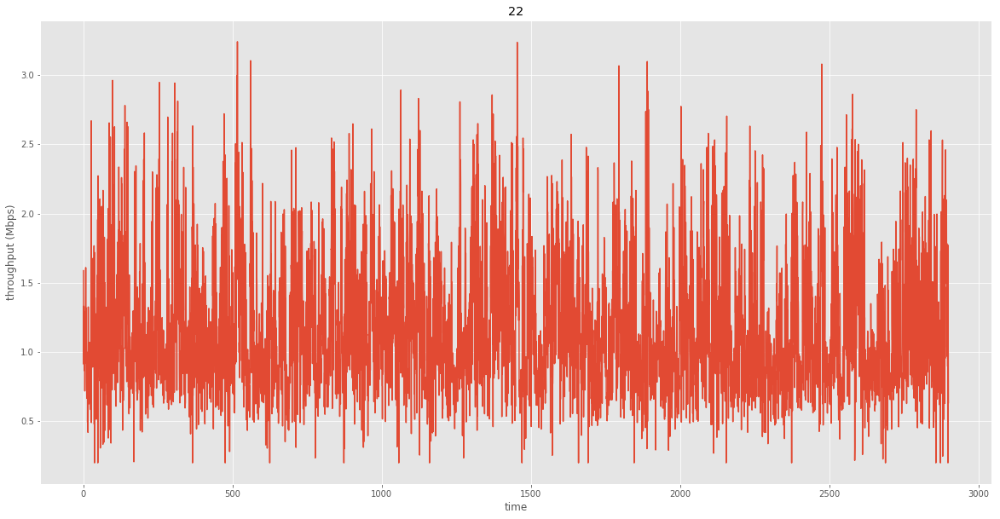

Mean: 1.189
Std: 0.469
Max: 3.242
Min: 0.200
Percentile (5): 0.589
Percentile (20): 0.794
Percentile (50): 1.096
Percentile (80): 1.571
Percentile (95): 2.083


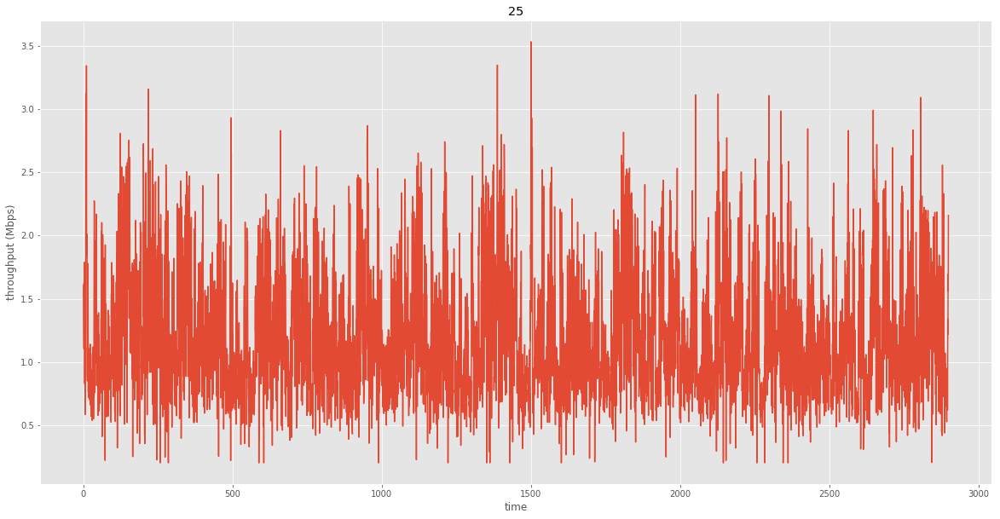

Mean: 1.210
Std: 0.483
Max: 3.537
Min: 0.200
Percentile (5): 0.593
Percentile (20): 0.803
Percentile (50): 1.114
Percentile (80): 1.596
Percentile (95): 2.134


In [51]:
get_analysis_result('network_trace/low/')

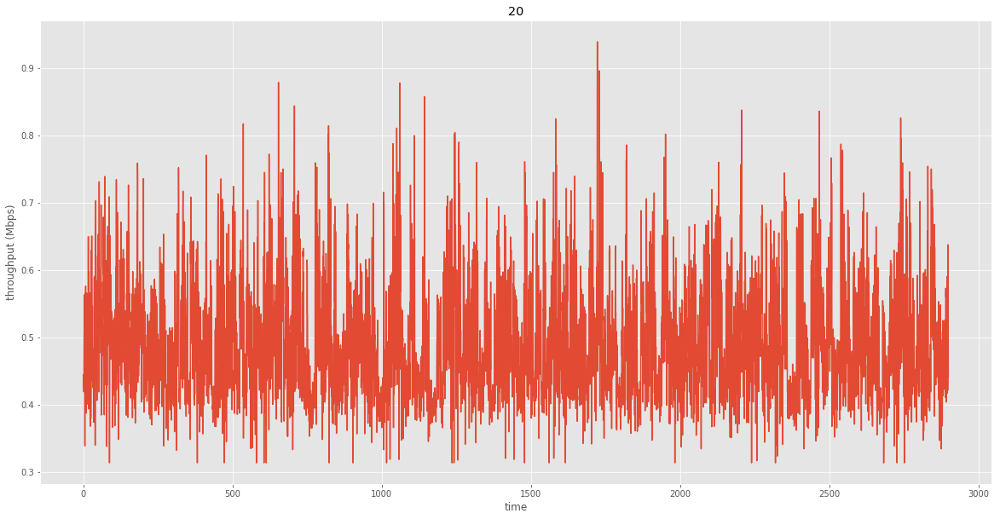

Mean: 0.492
Std: 0.083
Max: 0.939
Min: 0.314
Percentile (5): 0.384
Percentile (20): 0.420
Percentile (50): 0.478
Percentile (80): 0.558
Percentile (95): 0.649


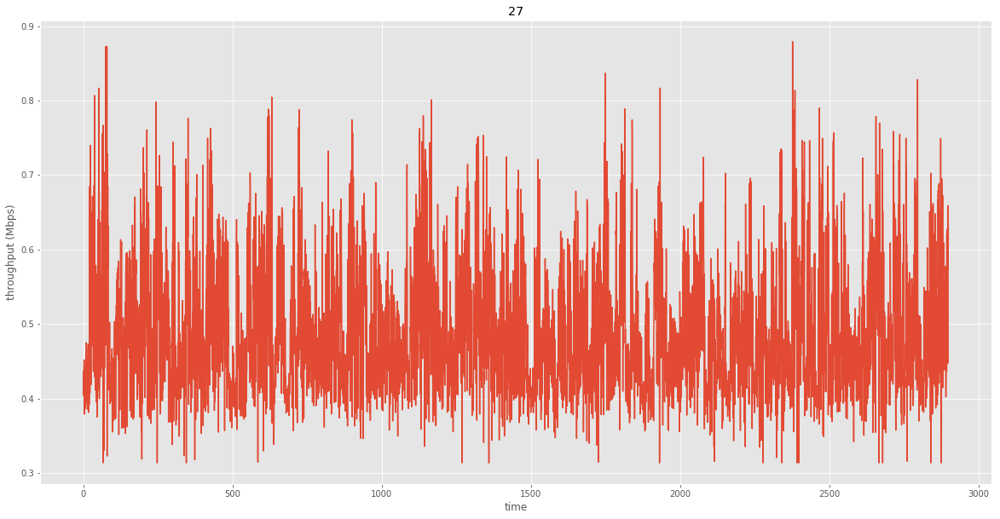

Mean: 0.490
Std: 0.083
Max: 0.879
Min: 0.314
Percentile (5): 0.385
Percentile (20): 0.419
Percentile (50): 0.474
Percentile (80): 0.555
Percentile (95): 0.649


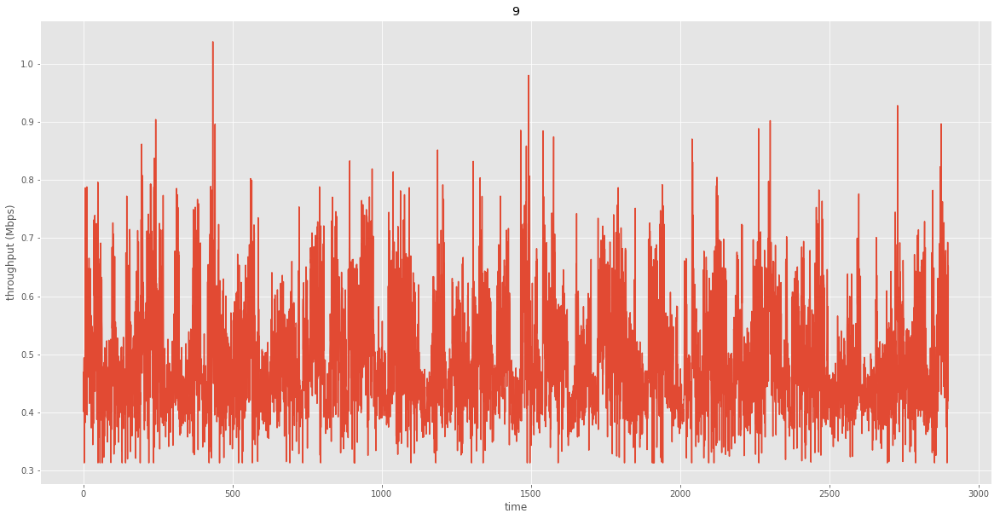

Mean: 0.495
Std: 0.096
Max: 1.038
Min: 0.314
Percentile (5): 0.371
Percentile (20): 0.415
Percentile (50): 0.476
Percentile (80): 0.572
Percentile (95): 0.679


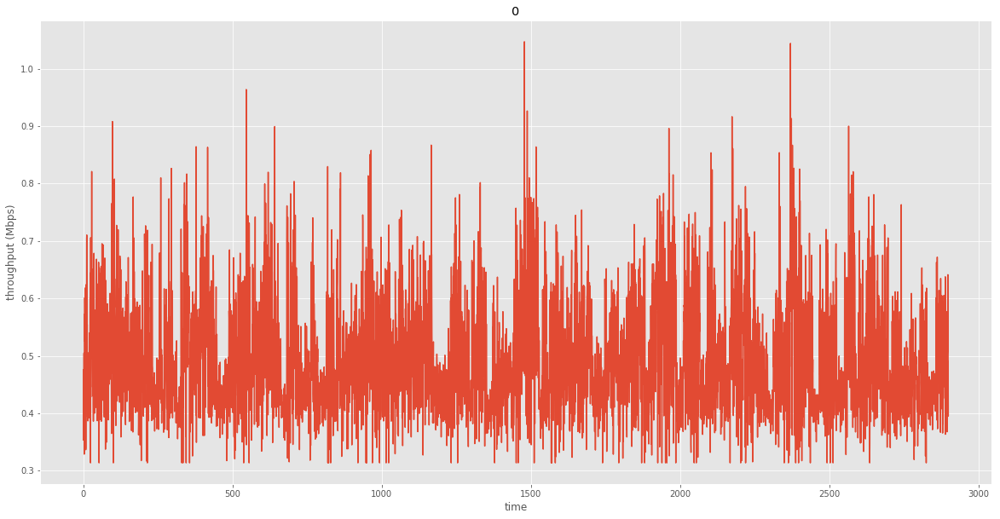

Mean: 0.498
Std: 0.097
Max: 1.047
Min: 0.314
Percentile (5): 0.371
Percentile (20): 0.416
Percentile (50): 0.481
Percentile (80): 0.575
Percentile (95): 0.679


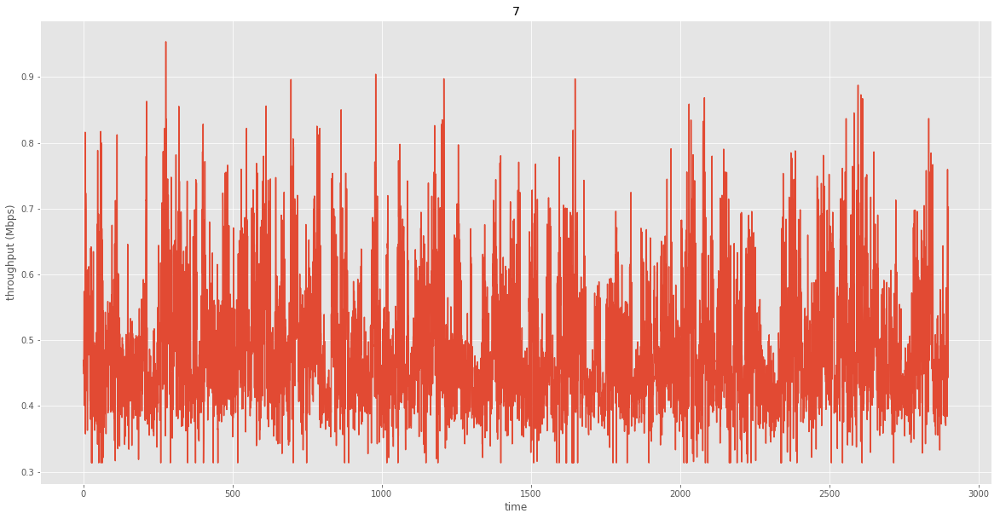

Mean: 0.495
Std: 0.096
Max: 0.954
Min: 0.314
Percentile (5): 0.371
Percentile (20): 0.416
Percentile (50): 0.475
Percentile (80): 0.569
Percentile (95): 0.679


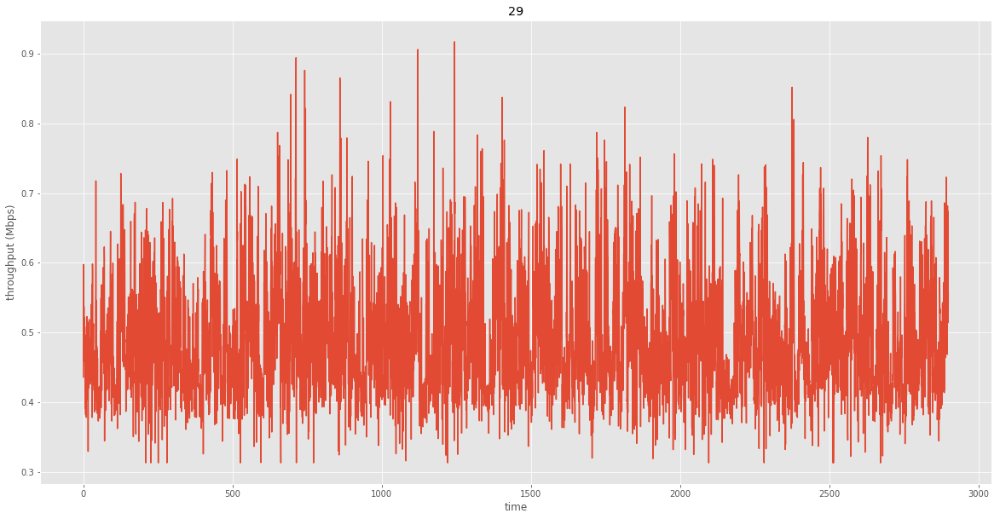

Mean: 0.493
Std: 0.084
Max: 0.917
Min: 0.314
Percentile (5): 0.384
Percentile (20): 0.422
Percentile (50): 0.479
Percentile (80): 0.560
Percentile (95): 0.650


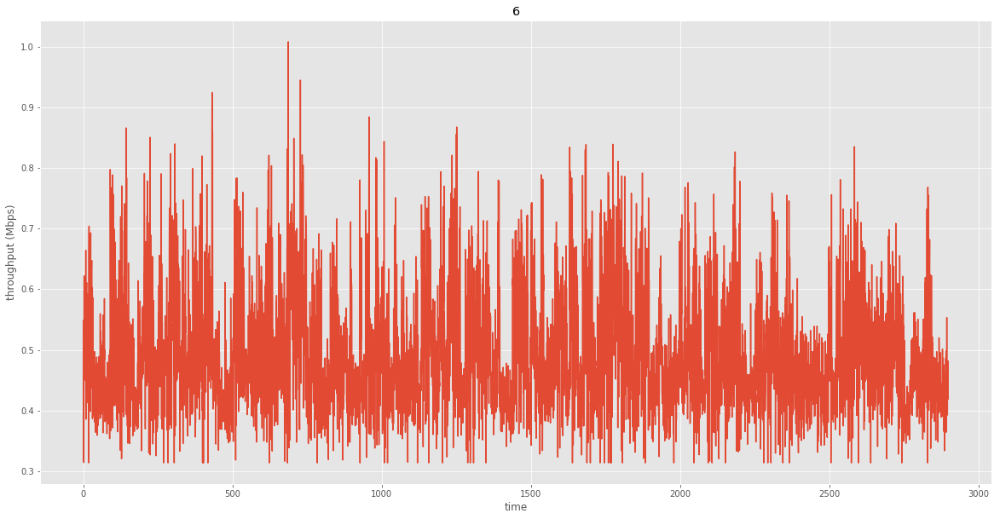

Mean: 0.495
Std: 0.096
Max: 1.009
Min: 0.314
Percentile (5): 0.369
Percentile (20): 0.416
Percentile (50): 0.476
Percentile (80): 0.570
Percentile (95): 0.678


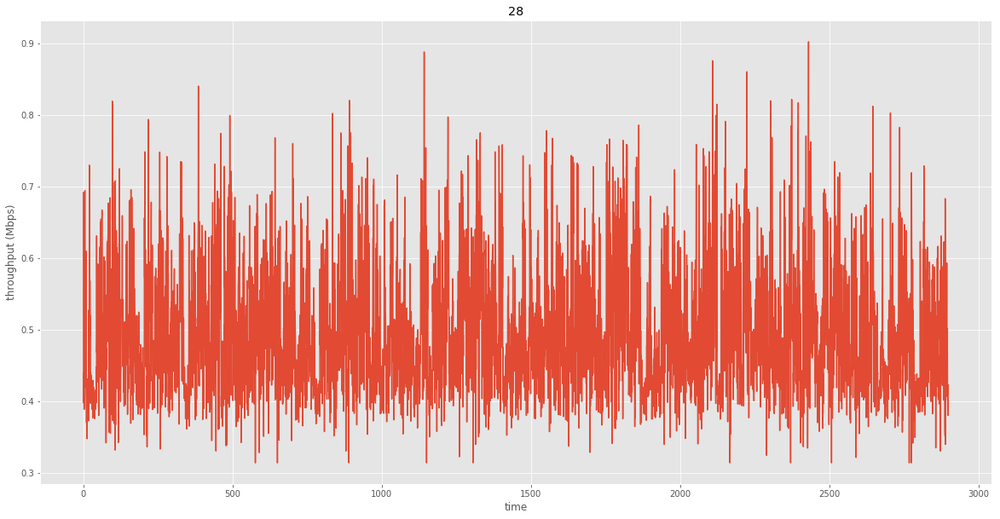

Mean: 0.496
Std: 0.085
Max: 0.902
Min: 0.314
Percentile (5): 0.388
Percentile (20): 0.422
Percentile (50): 0.480
Percentile (80): 0.565
Percentile (95): 0.655


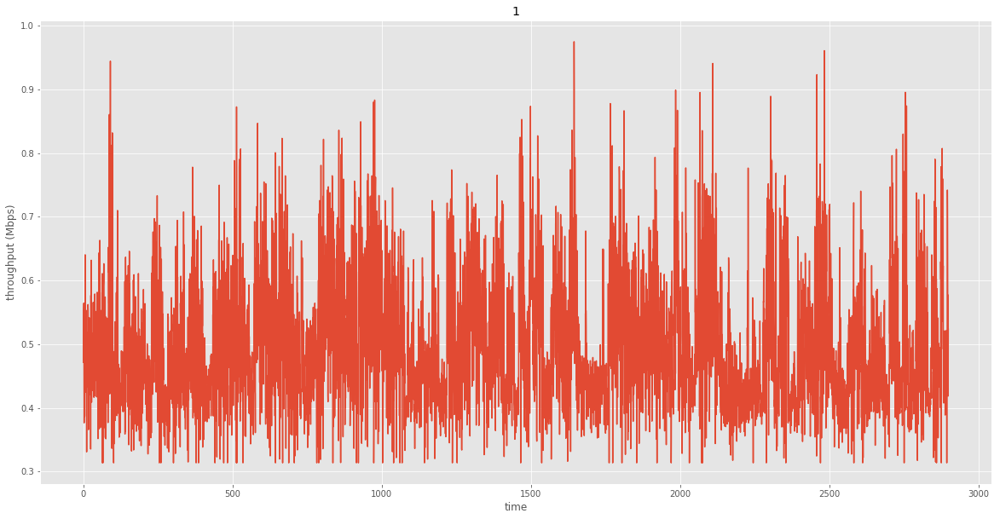

Mean: 0.498
Std: 0.098
Max: 0.975
Min: 0.314
Percentile (5): 0.369
Percentile (20): 0.416
Percentile (50): 0.482
Percentile (80): 0.576
Percentile (95): 0.684


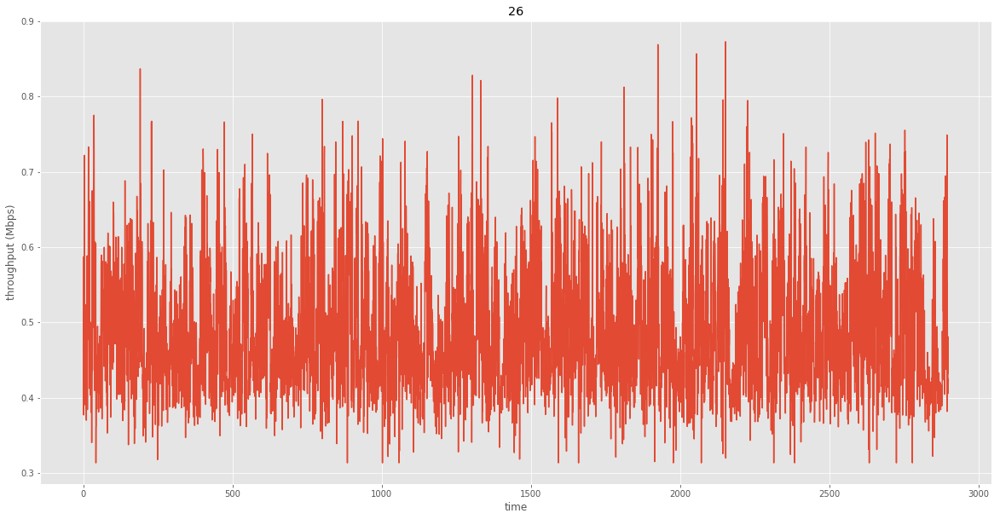

Mean: 0.491
Std: 0.082
Max: 0.873
Min: 0.314
Percentile (5): 0.384
Percentile (20): 0.421
Percentile (50): 0.477
Percentile (80): 0.557
Percentile (95): 0.645


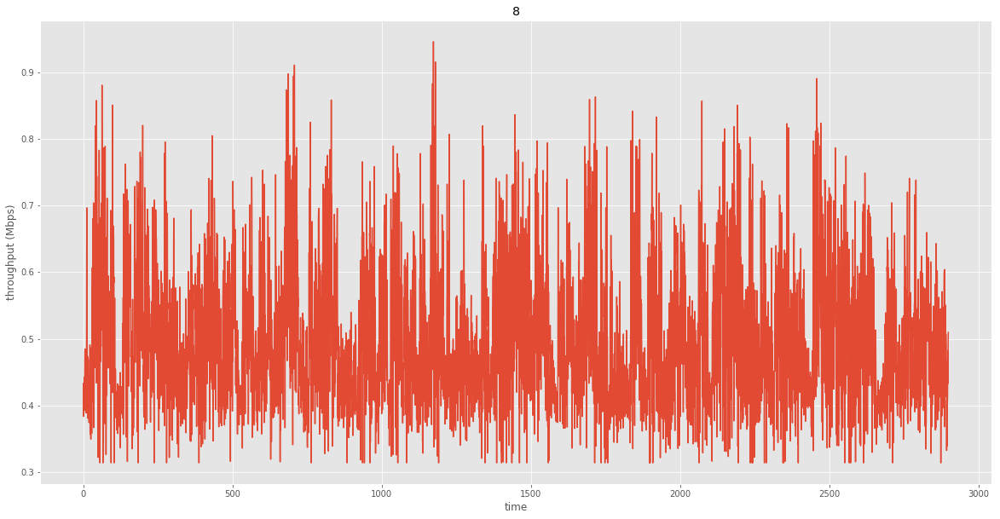

Mean: 0.500
Std: 0.100
Max: 0.946
Min: 0.314
Percentile (5): 0.368
Percentile (20): 0.416
Percentile (50): 0.481
Percentile (80): 0.577
Percentile (95): 0.689


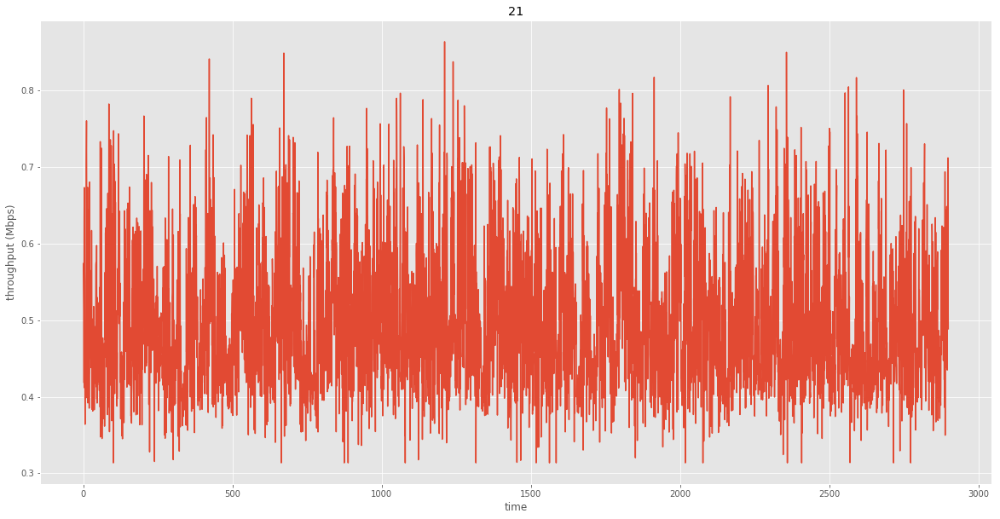

Mean: 0.501
Std: 0.087
Max: 0.864
Min: 0.314
Percentile (5): 0.386
Percentile (20): 0.427
Percentile (50): 0.486
Percentile (80): 0.573
Percentile (95): 0.667


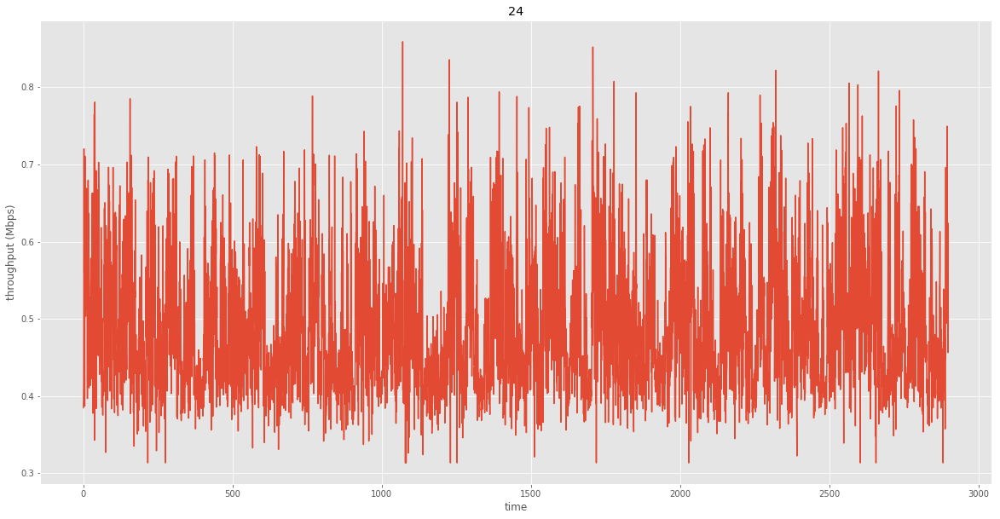

Mean: 0.492
Std: 0.085
Max: 0.859
Min: 0.314
Percentile (5): 0.385
Percentile (20): 0.418
Percentile (50): 0.472
Percentile (80): 0.564
Percentile (95): 0.657


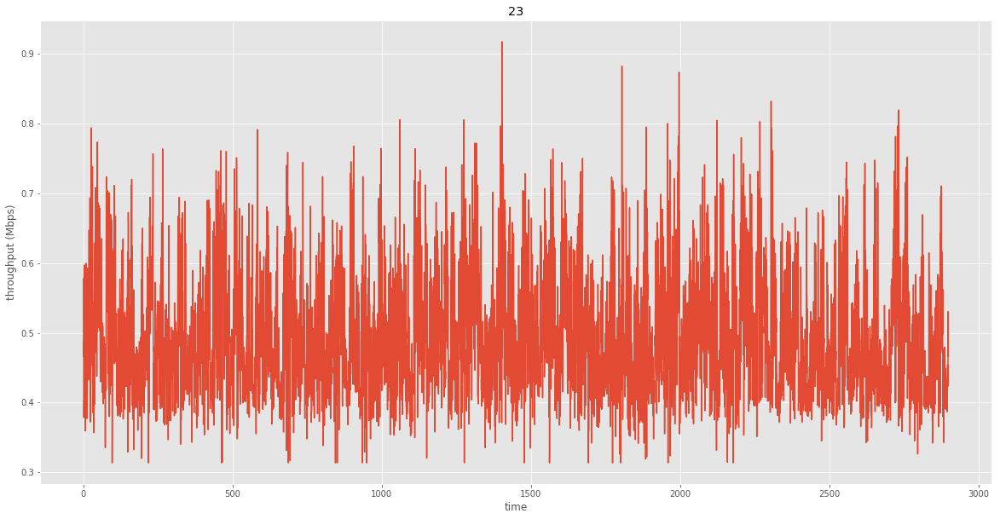

Mean: 0.496
Std: 0.085
Max: 0.918
Min: 0.314
Percentile (5): 0.386
Percentile (20): 0.423
Percentile (50): 0.481
Percentile (80): 0.563
Percentile (95): 0.658


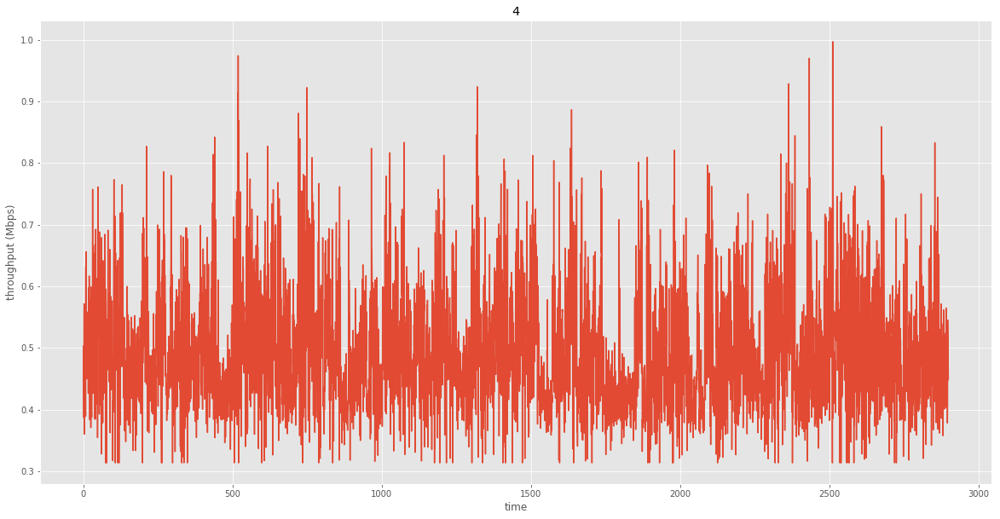

Mean: 0.497
Std: 0.094
Max: 0.997
Min: 0.314
Percentile (5): 0.373
Percentile (20): 0.420
Percentile (50): 0.481
Percentile (80): 0.572
Percentile (95): 0.674


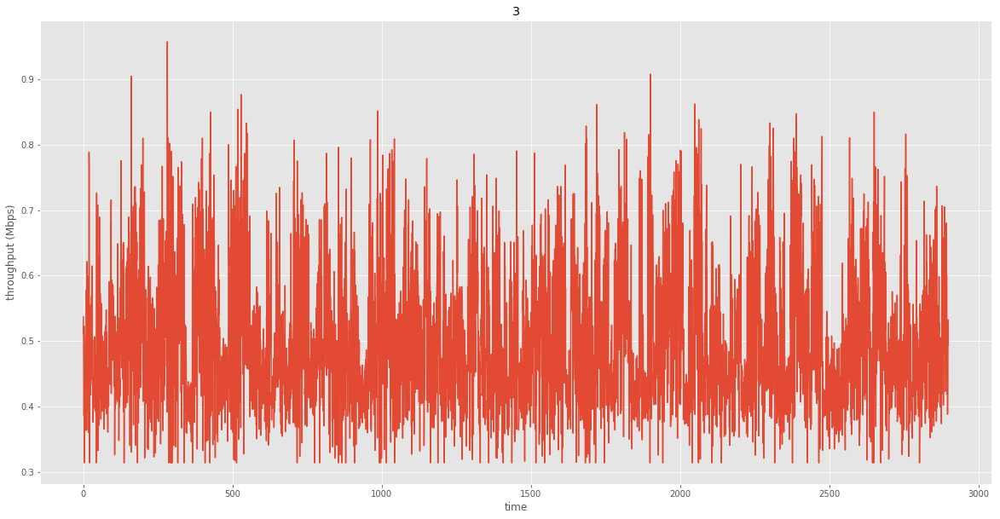

Mean: 0.501
Std: 0.099
Max: 0.957
Min: 0.314
Percentile (5): 0.368
Percentile (20): 0.417
Percentile (50): 0.485
Percentile (80): 0.583
Percentile (95): 0.688


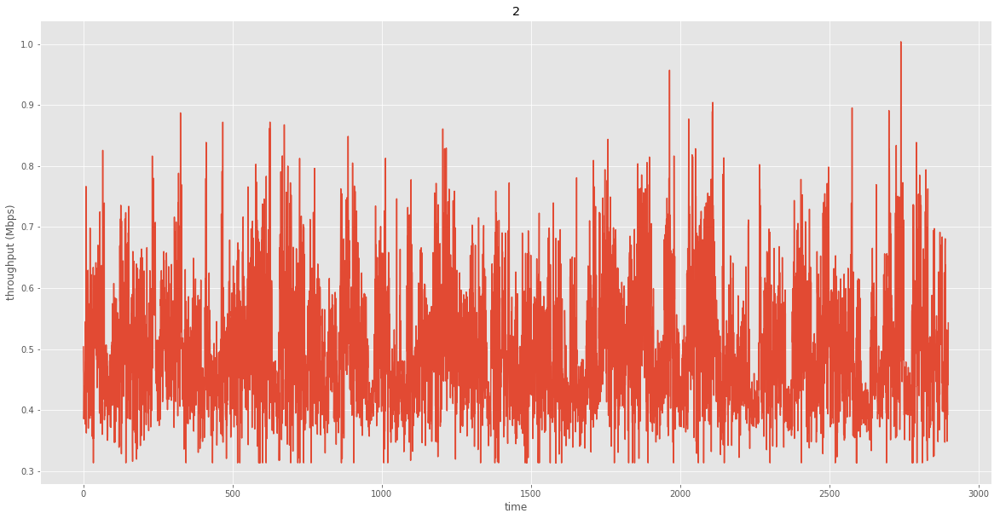

Mean: 0.501
Std: 0.098
Max: 1.004
Min: 0.314
Percentile (5): 0.372
Percentile (20): 0.417
Percentile (50): 0.486
Percentile (80): 0.581
Percentile (95): 0.688


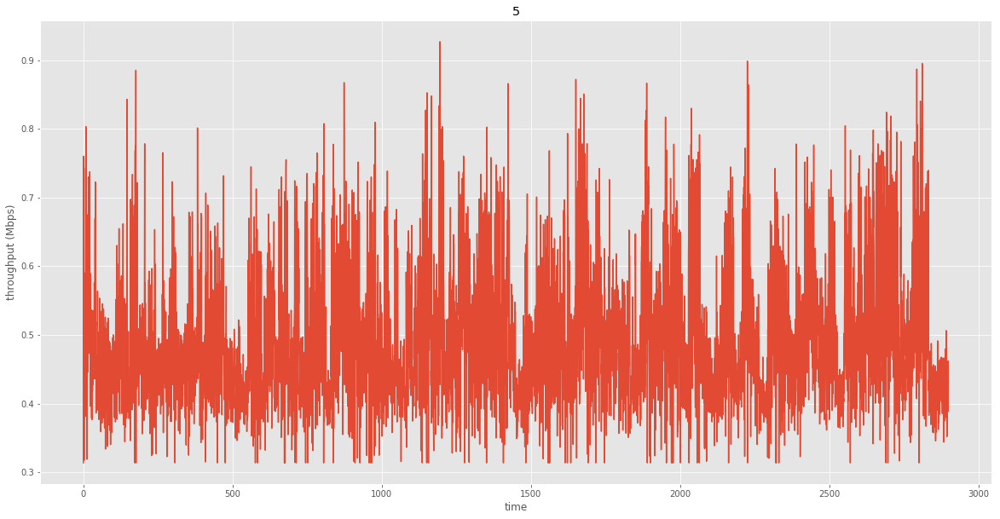

Mean: 0.495
Std: 0.096
Max: 0.927
Min: 0.314
Percentile (5): 0.372
Percentile (20): 0.415
Percentile (50): 0.476
Percentile (80): 0.569
Percentile (95): 0.681


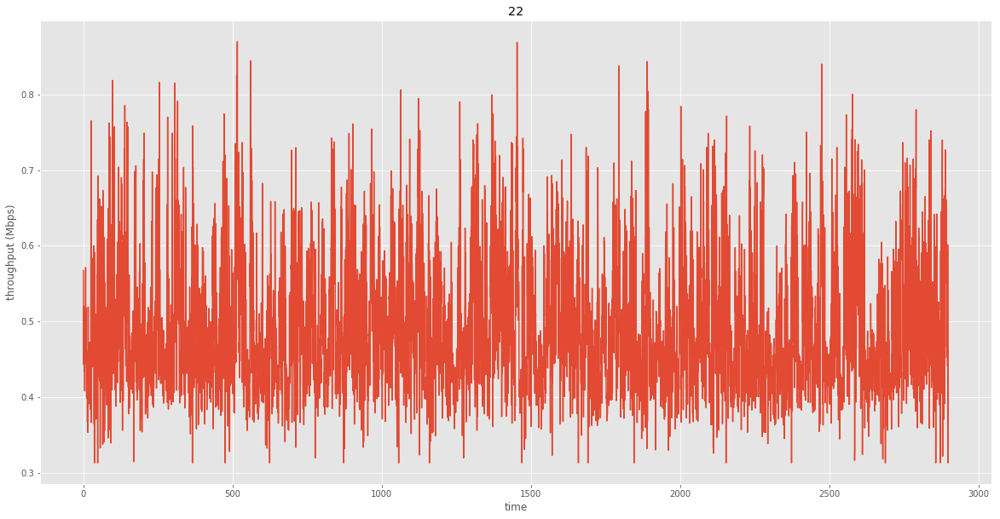

Mean: 0.494
Std: 0.086
Max: 0.869
Min: 0.314
Percentile (5): 0.385
Percentile (20): 0.422
Percentile (50): 0.477
Percentile (80): 0.564
Percentile (95): 0.658


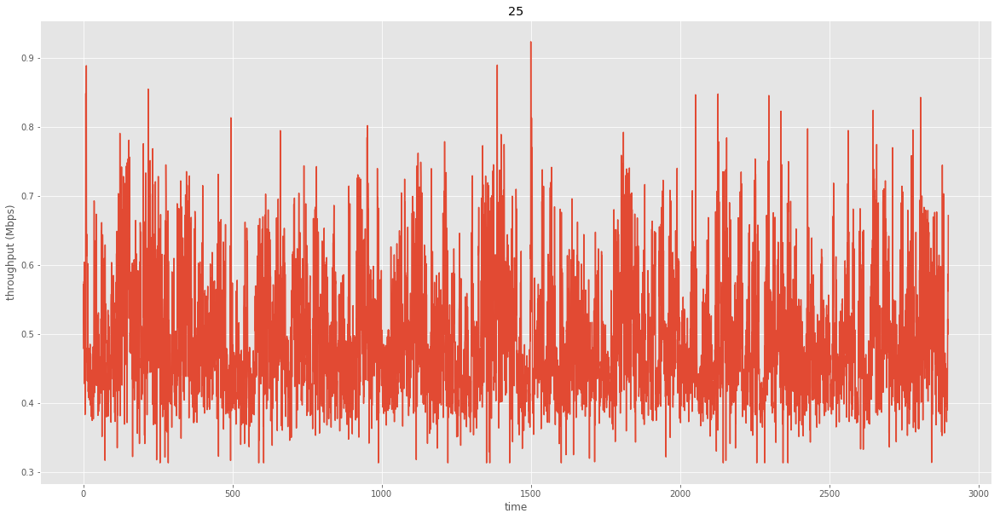

Mean: 0.498
Std: 0.088
Max: 0.923
Min: 0.314
Percentile (5): 0.385
Percentile (20): 0.424
Percentile (50): 0.481
Percentile (80): 0.569
Percentile (95): 0.667


In [117]:
get_analysis_result('network_trace/low/', scale=True)

## Video Trace Analysis
This trace contains the time and size of each frame captured on CDN. The format is:

| Timestamp (s)  | Frame Data Size (bit) | Is_I_frame_flag (0/1) |
| :---: | :---: | :---: |
| 00.0013  | 147800  | 1  |
| 00.0037  | 272301  | 0  |
| ...  | ...  | ...  |

In [24]:
def plot_frame_size(trace_file, title, LEN):
    frame_sizes = []
    frame_flags = []
    with open(trace_file, 'rb') as f:
        for line in f:
            parse = line.split()
            frame_sizes.append(float(parse[1]))
            frame_flags.append(int(parse[2]))
            
    frame_sizes = np.array(frame_sizes[:LEN])
    frame_flags = np.array(frame_flags[:LEN])
#     Iframes = np.argwhere(frame_flags)
#     Iframes = np.flatnonzero(frame_flags)
#     Iframes_size = 1
#     for dim in Iframes.shape:
#         Iframes_size *= dim
#     np.reshape(Iframes, Iframes_size)
#     print(Iframes)
               
    fig = plt.figure(figsize=(20,6))
    plt.plot(frame_sizes, marker='*', markersize=10, markevery=50)
    plt.xlabel('frame No.')
    plt.ylabel('frame data size (bit)')
    plt.title(title)
    plt.show()

In [107]:
def plot_gop_size(trace_file, title):
    gop_sizes = []
    with open(trace_file, 'rb') as f:
        gop_size = 0.0
        for line in f:
            parse = line.split()
#             print(parse)
            if int(parse[2]) == 1:
                gop_sizes.append(gop_size)
#                 print(gop_size)
                gop_size = float(parse[1])
            else:
                gop_size += float(parse[1])
    
    gop_sizes = np.array(gop_sizes) / 1000000
    
    fig = plt.figure(figsize=(20,6))
    plt.plot(gop_sizes)
    plt.xlabel('Gop No.')
    plt.ylabel('Gop data size (Mbits)')
    plt.title(title)
    plt.show()
    
    return gop_sizes

In [108]:
def get_analysis_result_video(path, flag, LEN):
    for root, dirnames, filenames in os.walk(os.path.abspath(path)):
        for filename in filenames:
            trace_file = os.path.join(root, filename)
            parse = trace_file.split('/')
            title = parse[-2] + '-' + parse[-1][-1]
            if flag == 'gop':
                gop_sizes = plot_gop_size(trace_file, title)
                print('mean gop size: ', np.mean(gop_sizes))
            elif flag == 'frame':
                plot_frame_size(trace_file, title, LEN)
            else:
                print('please check input of flag, only two choices: gop or flag')

## Game

### Frame level analysis

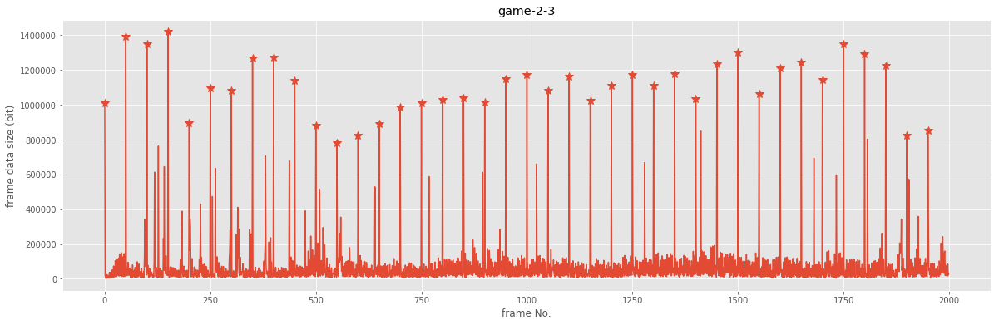

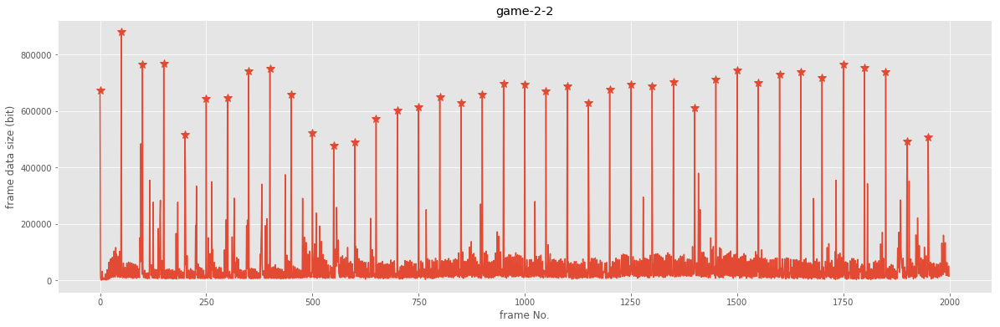

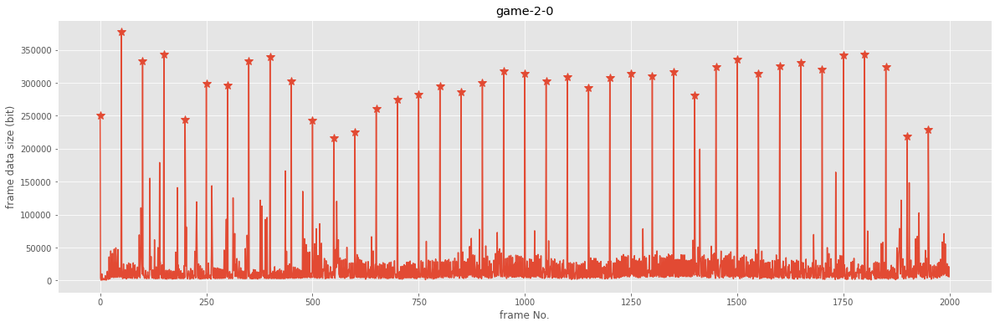

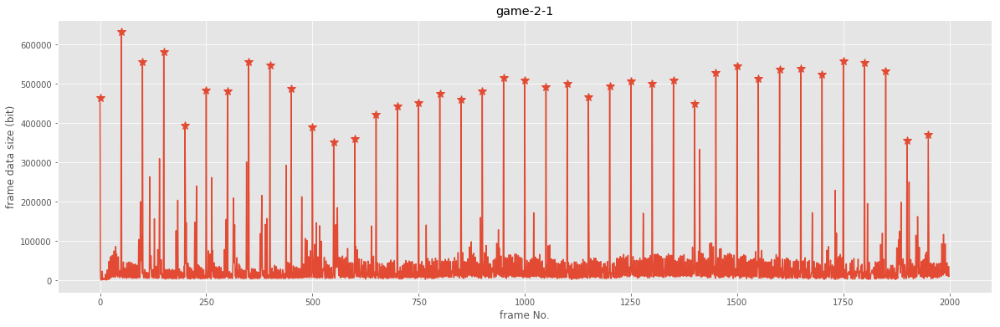

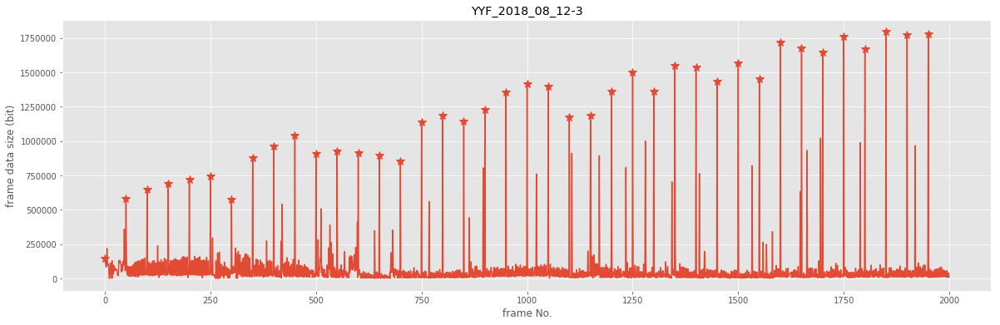

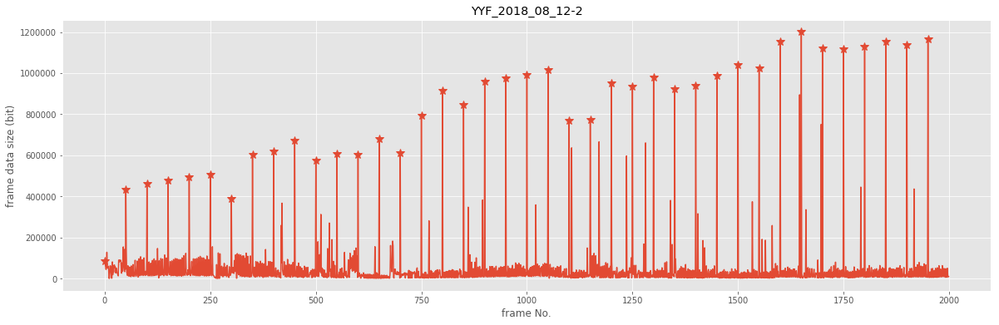

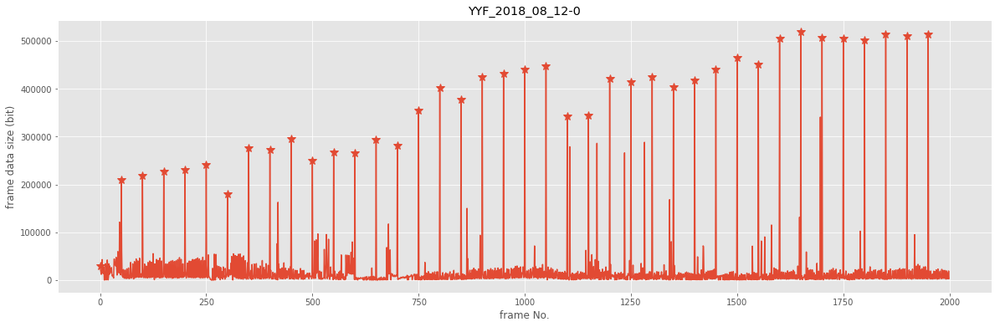

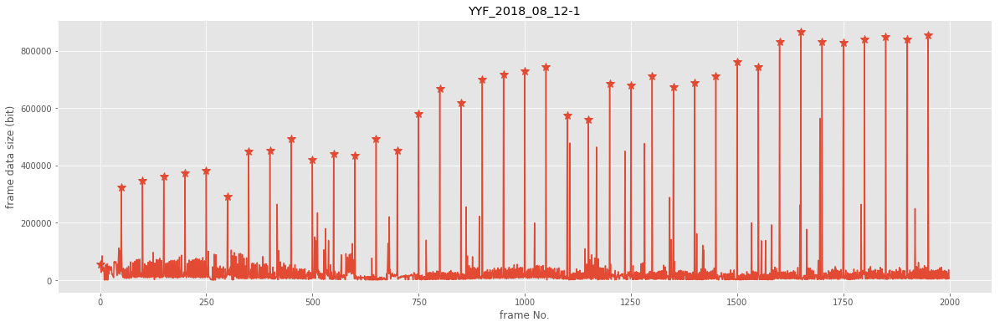

In [33]:
get_analysis_result_video('video_trace/game/', 'frame', 2000)

### Gop level analysis

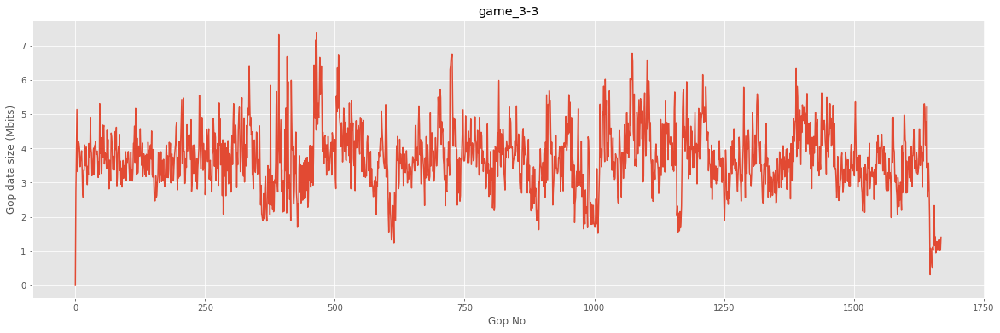

mean gop size:  3.7008816297183946


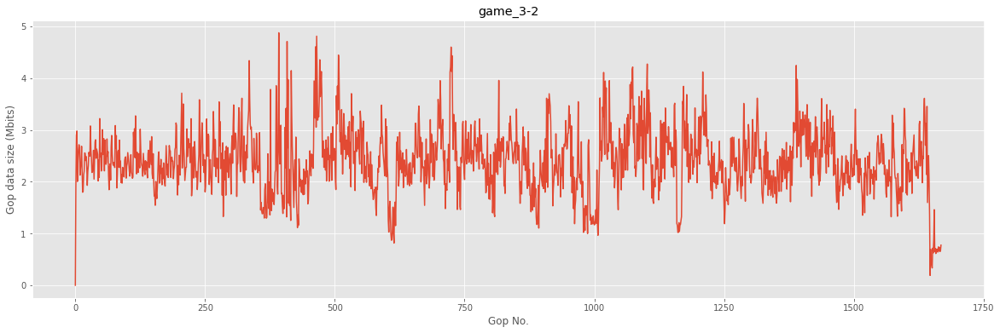

mean gop size:  2.3969827201917315


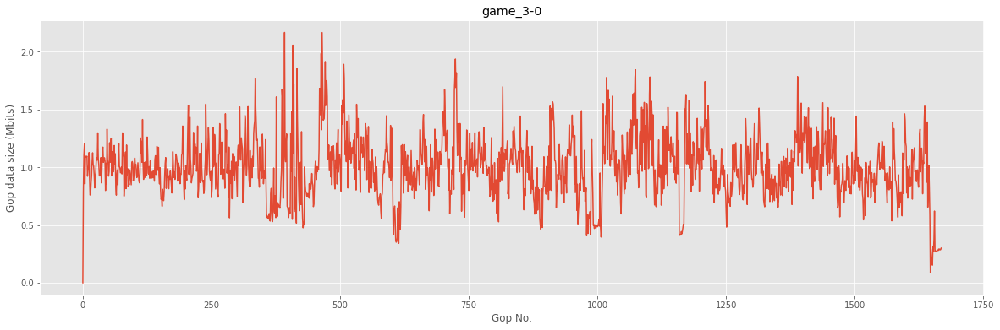

mean gop size:  0.9988678106650689


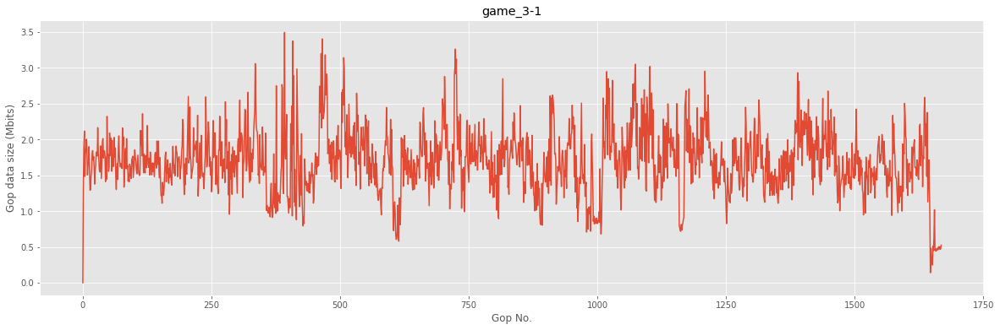

mean gop size:  1.6976779532654283


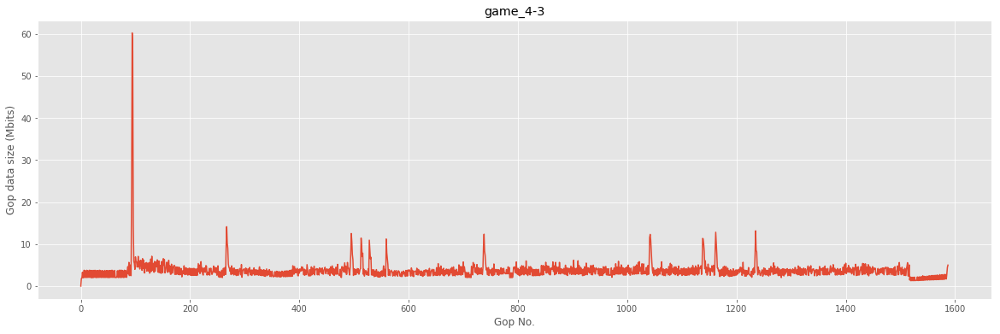

mean gop size:  3.652262322418135


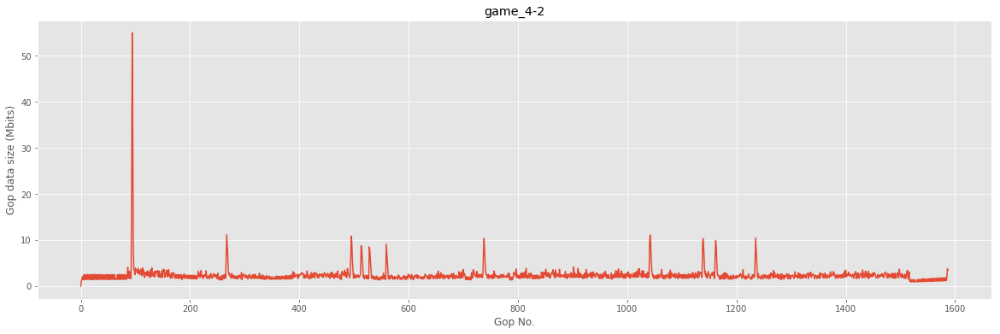

mean gop size:  2.368648005037784


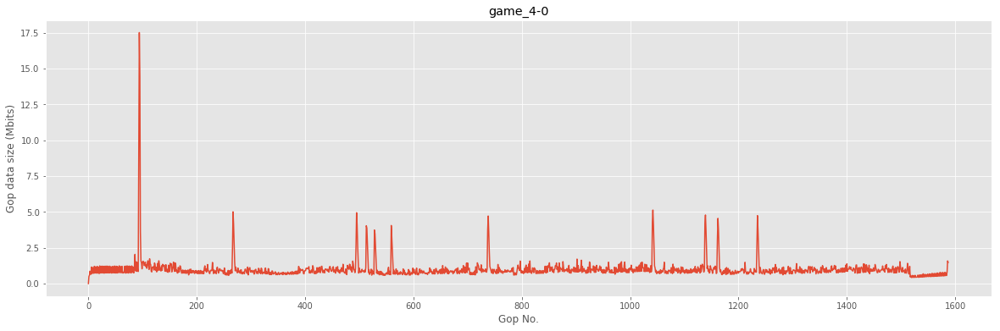

mean gop size:  0.9878767808564232


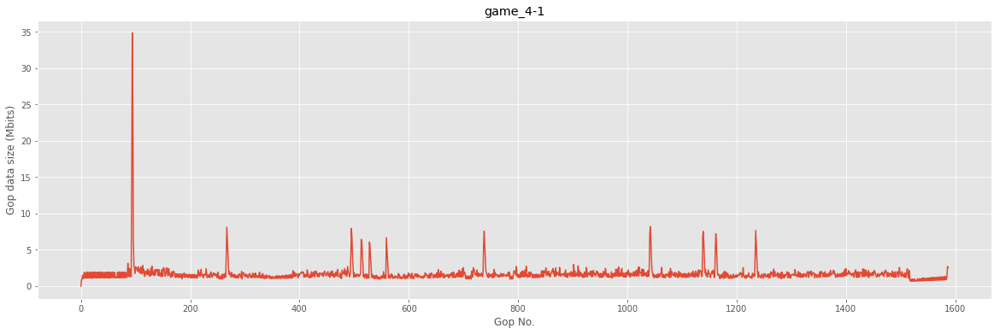

mean gop size:  1.6782997128463473


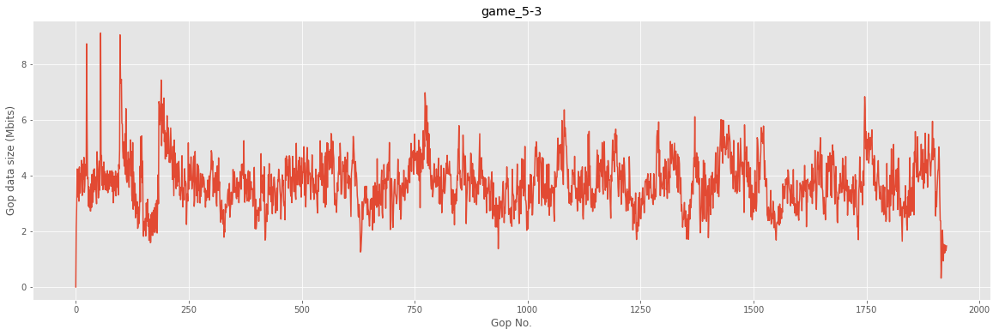

mean gop size:  3.716842174273859


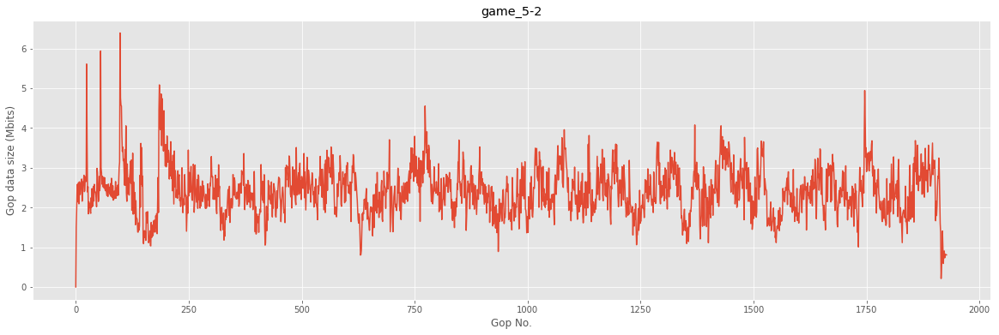

mean gop size:  2.408624755186722


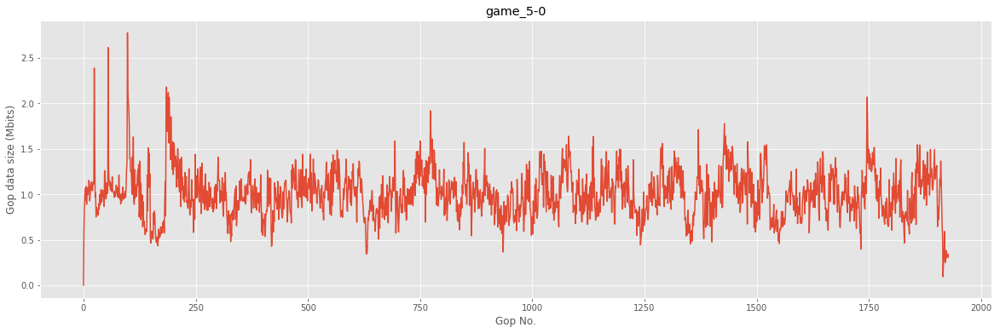

mean gop size:  1.003438531120332


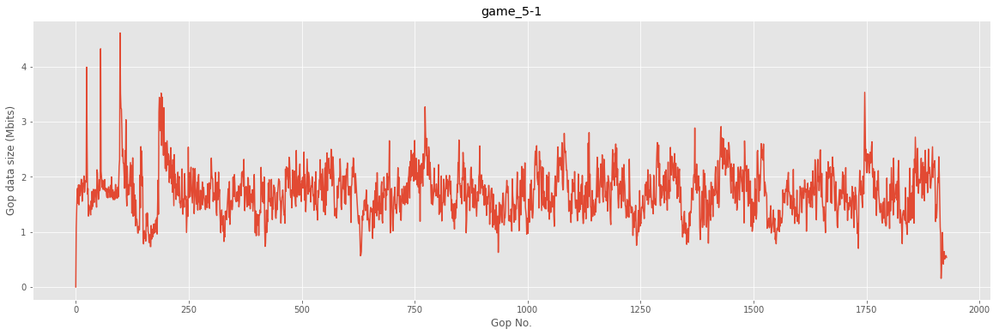

mean gop size:  1.705945124481328


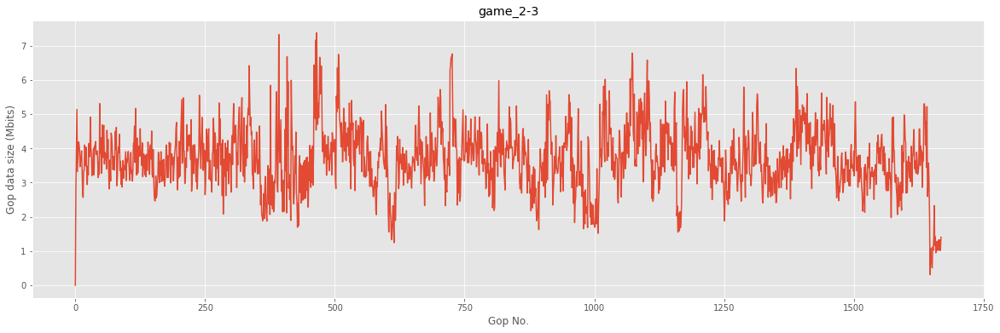

mean gop size:  3.7008816297183946


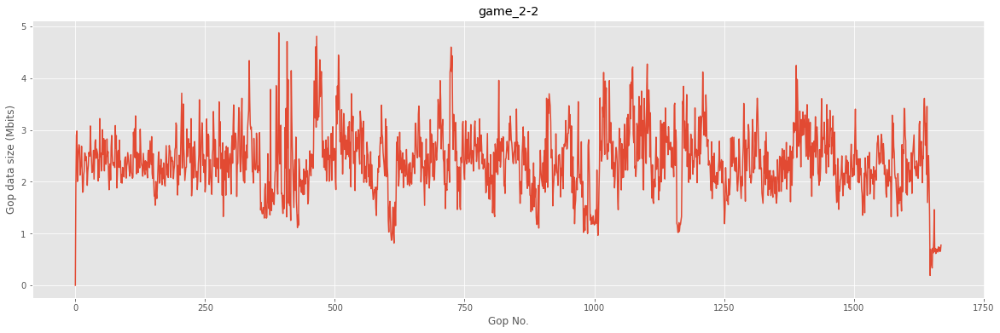

mean gop size:  2.3969827201917315


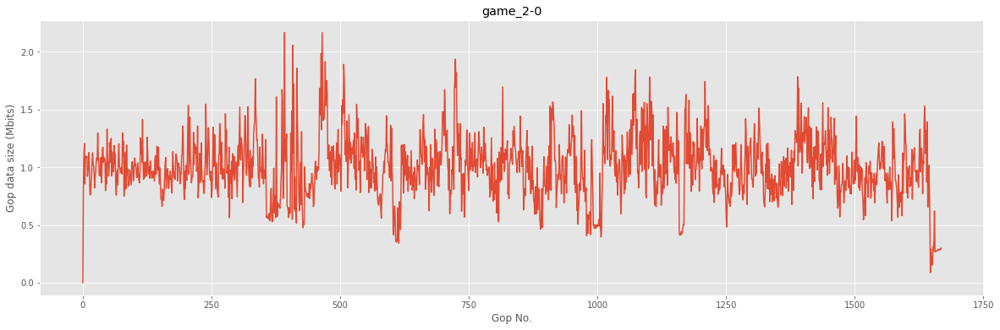

mean gop size:  0.9988678106650689


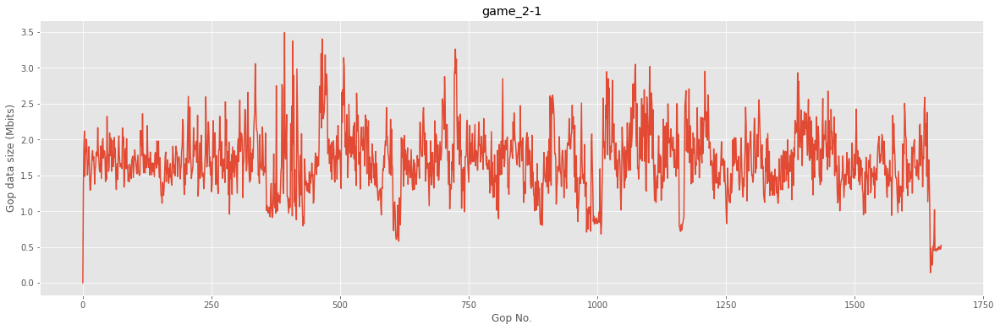

mean gop size:  1.6976779532654283


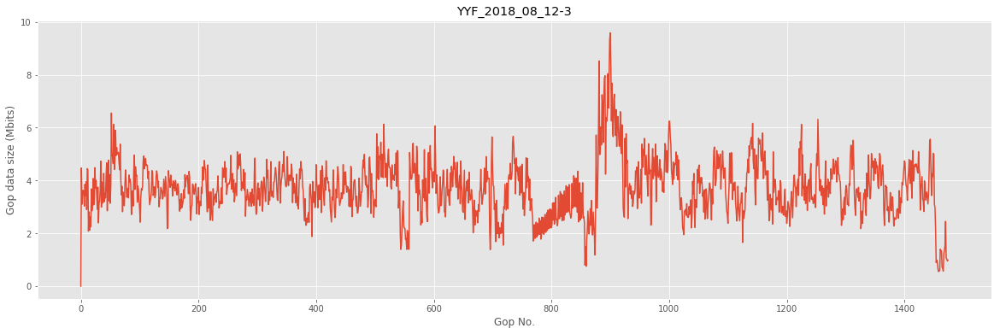

mean gop size:  3.710352515254237


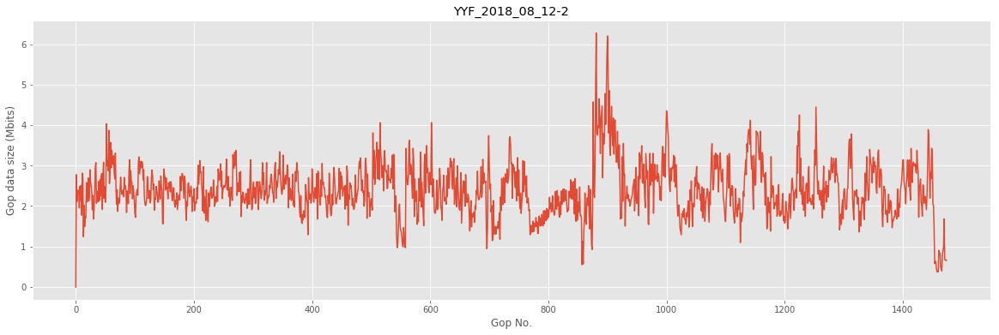

mean gop size:  2.4050245532203394


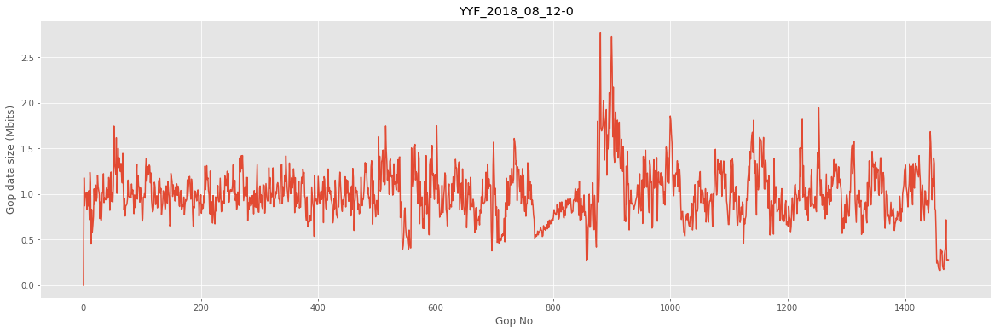

mean gop size:  1.0025779308474576


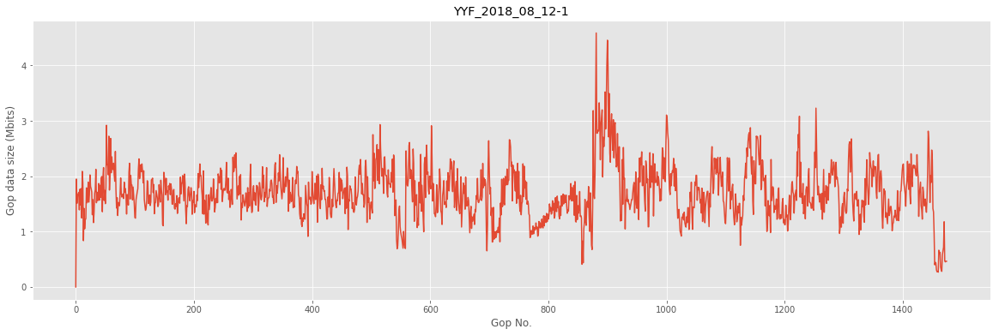

mean gop size:  1.7037781532203389


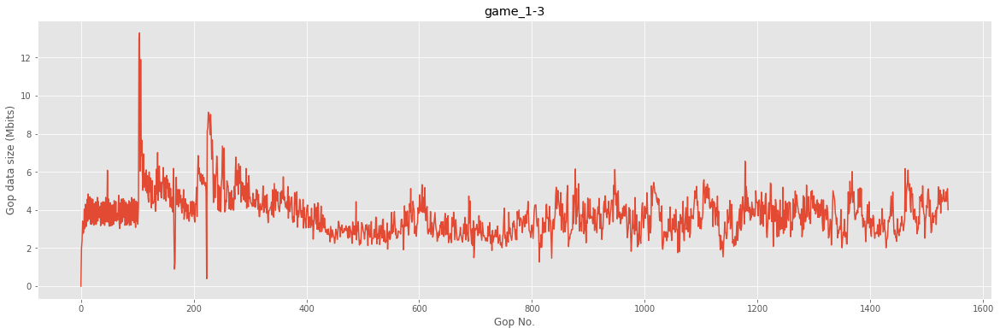

mean gop size:  3.749427545159194


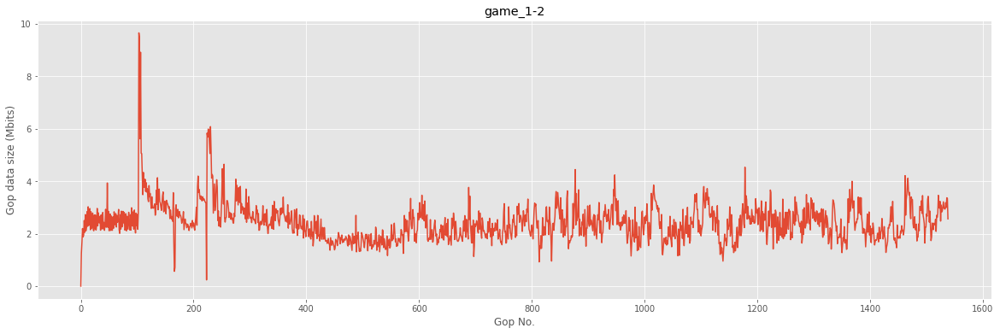

mean gop size:  2.432767729694607


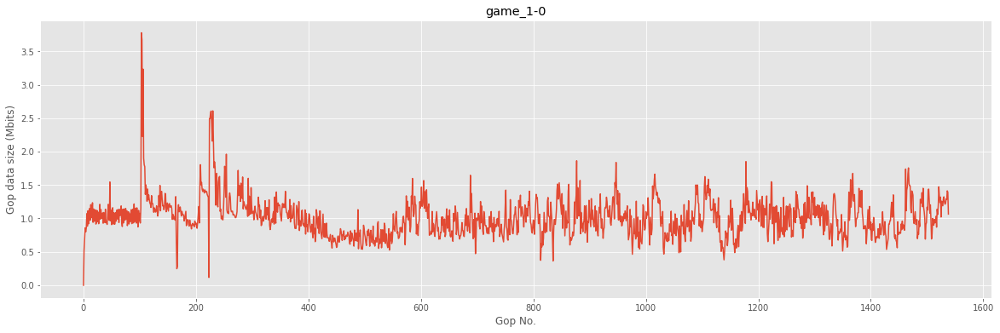

mean gop size:  1.0142715425601039


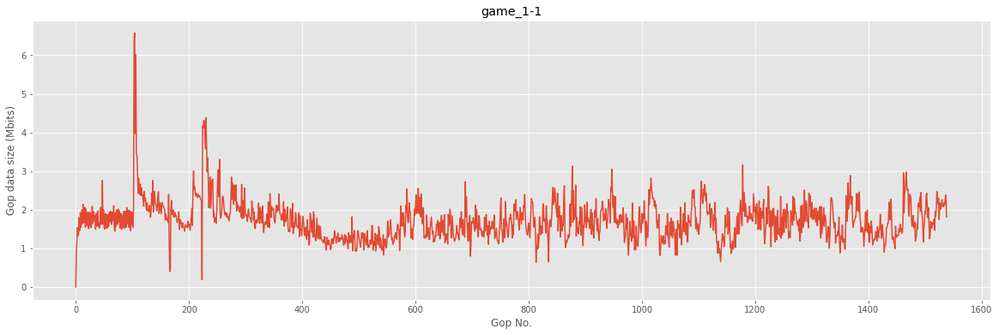

mean gop size:  1.7236562443144903


In [109]:
get_analysis_result_video('video_trace/game/', 'gop', 0)

## Room

### Frame level analysis

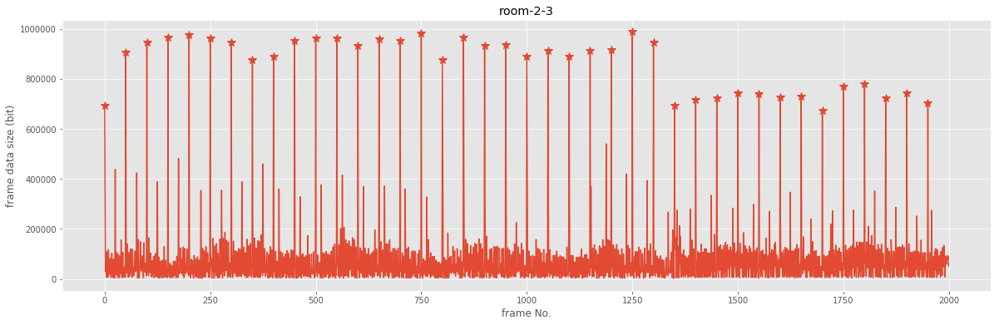

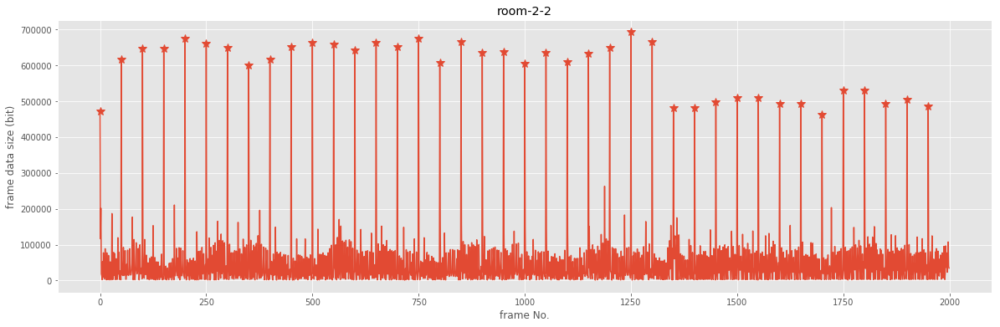

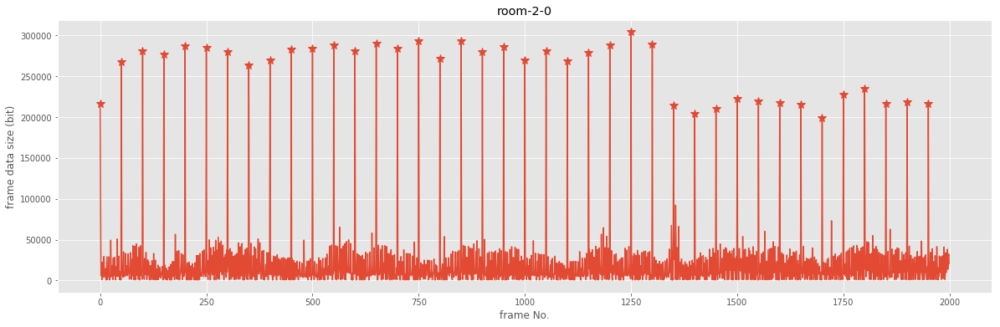

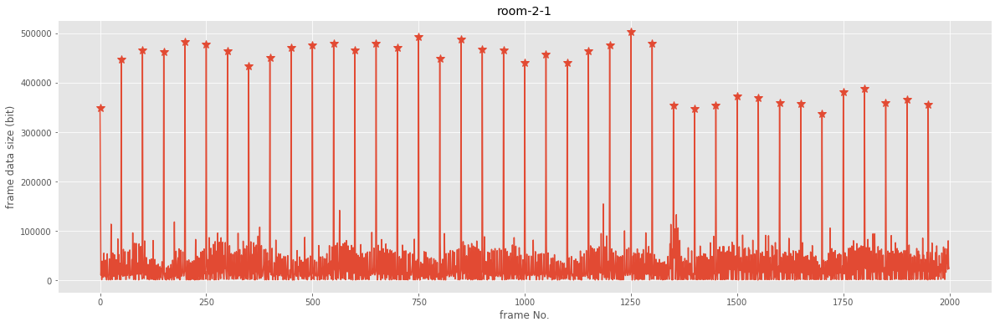

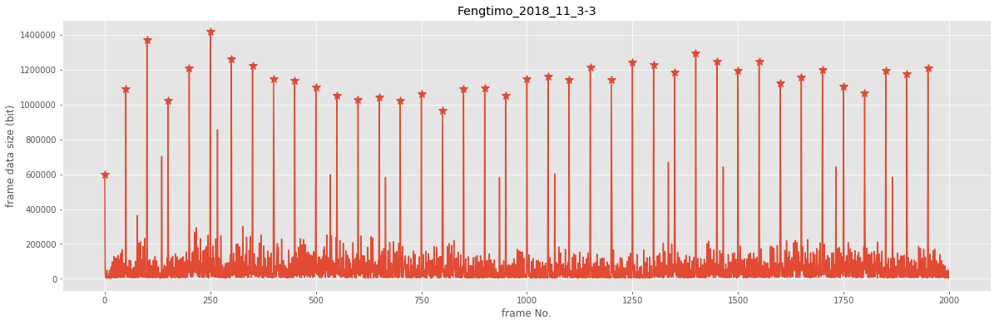

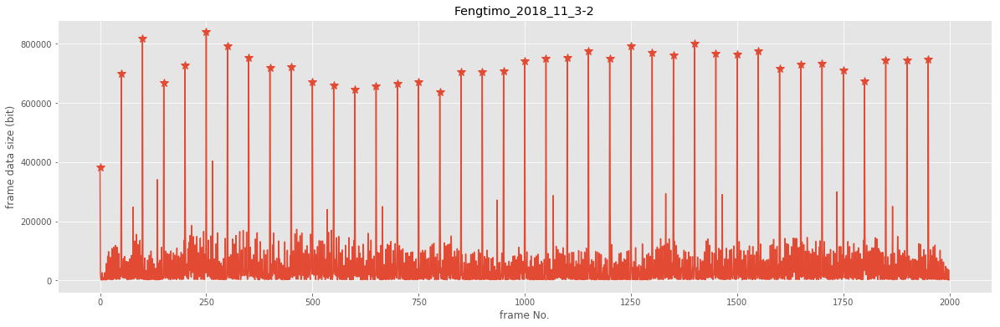

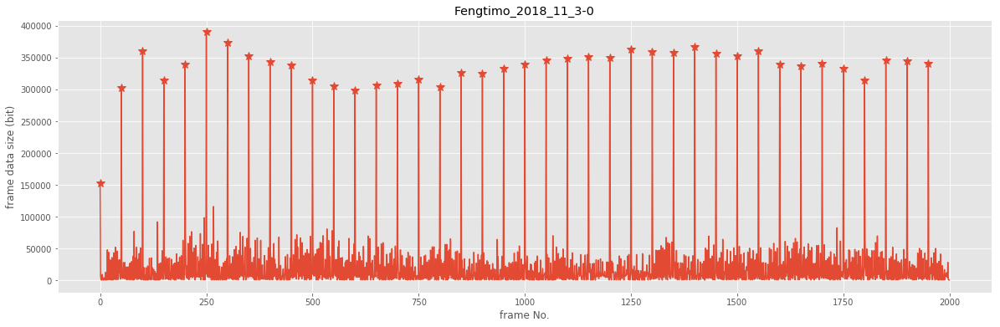

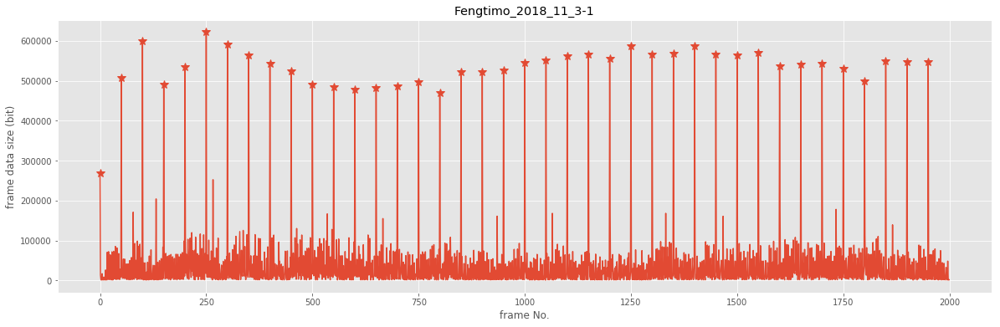

In [35]:
get_analysis_result_video('video_trace/room/', 'frame', 2000)

### Gop level analysis

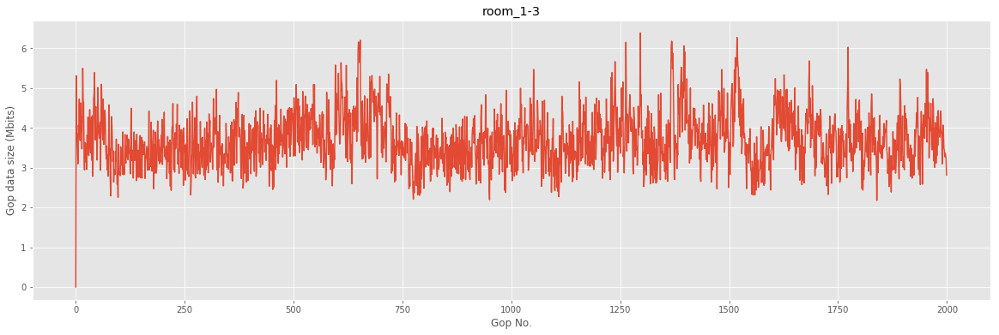

mean gop size:  3.690021748


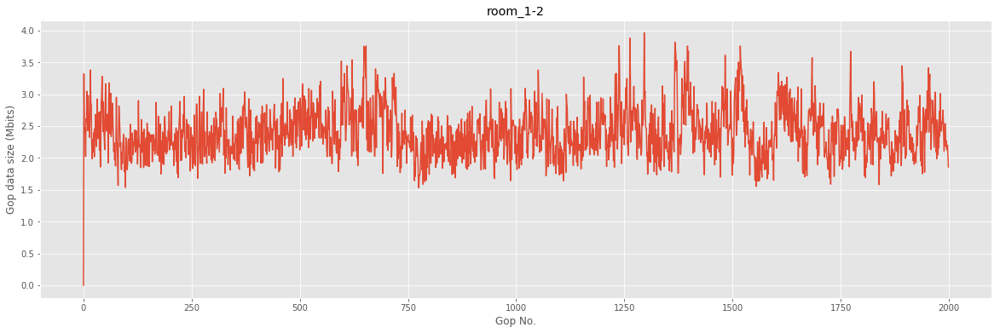

mean gop size:  2.396462372


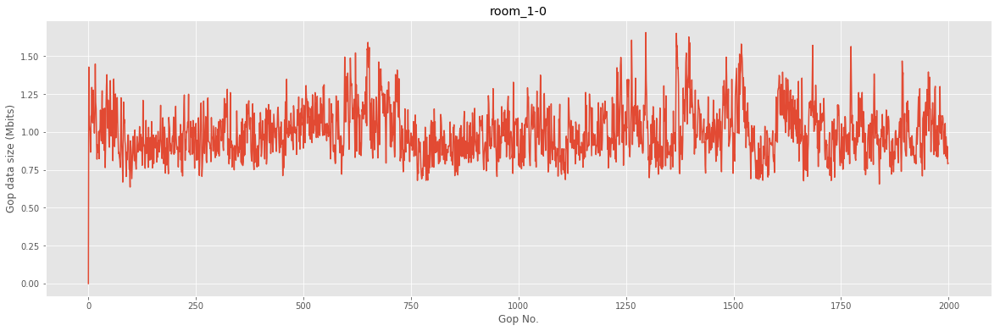

mean gop size:  0.998477908


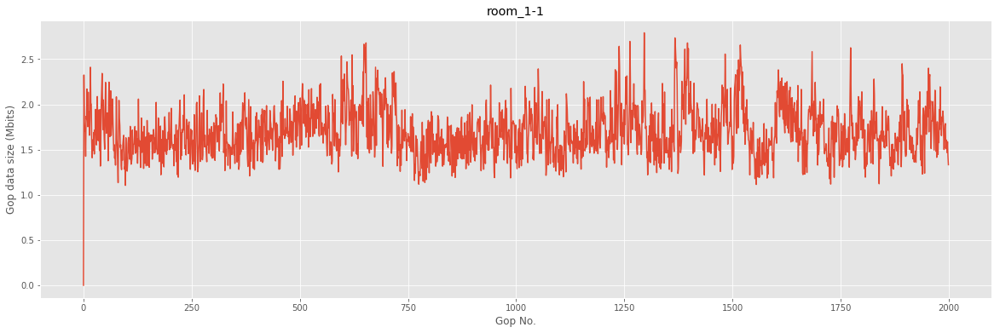

mean gop size:  1.6972059


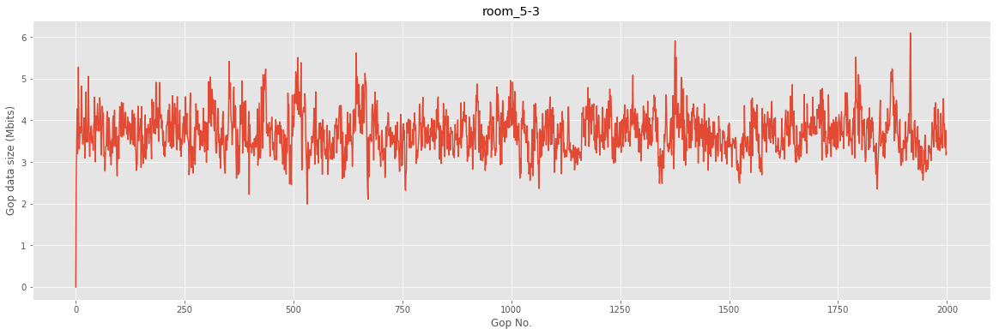

mean gop size:  3.699457276


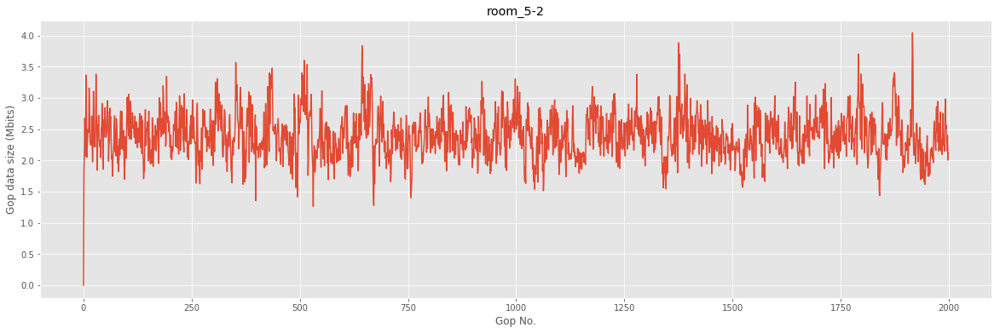

mean gop size:  2.40008758


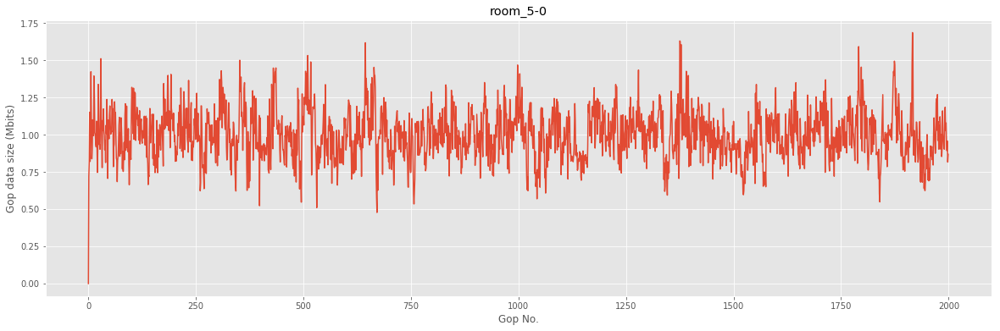

mean gop size:  0.99990342


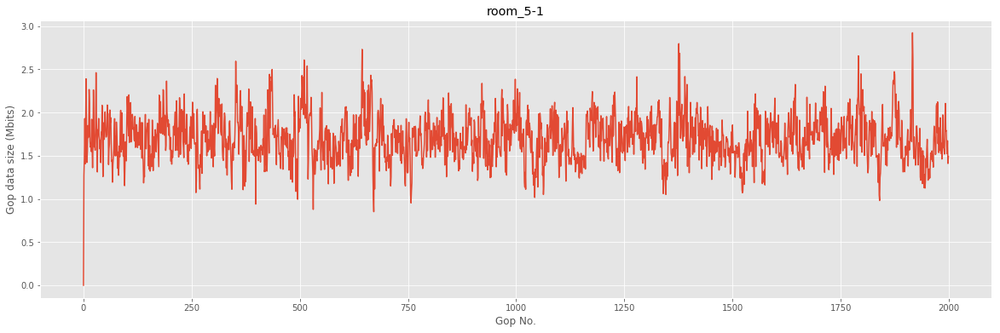

mean gop size:  1.700045616


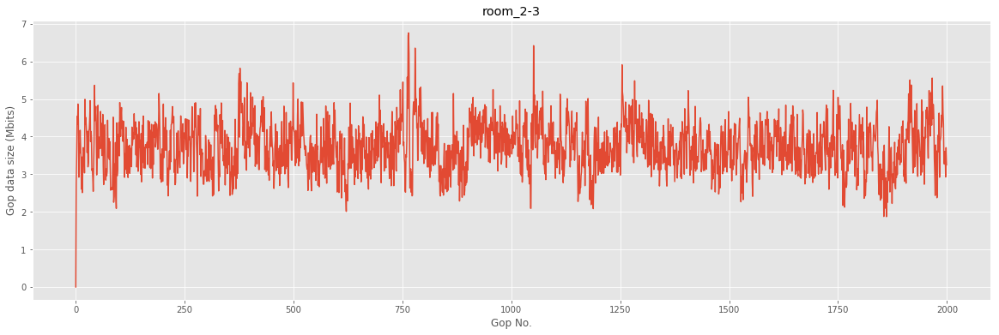

mean gop size:  3.71573432


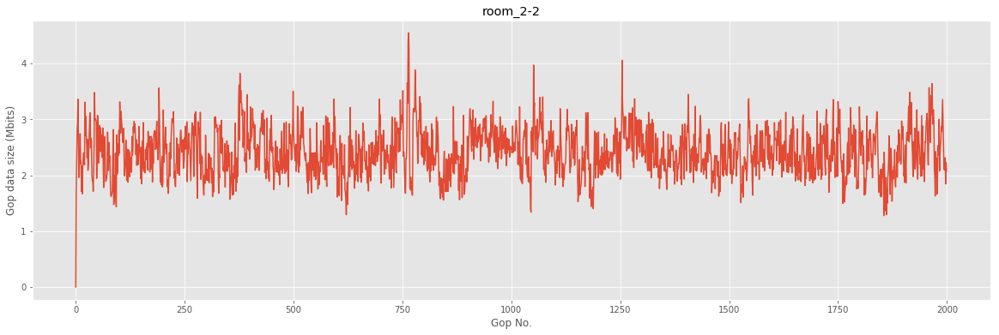

mean gop size:  2.4084091040000004


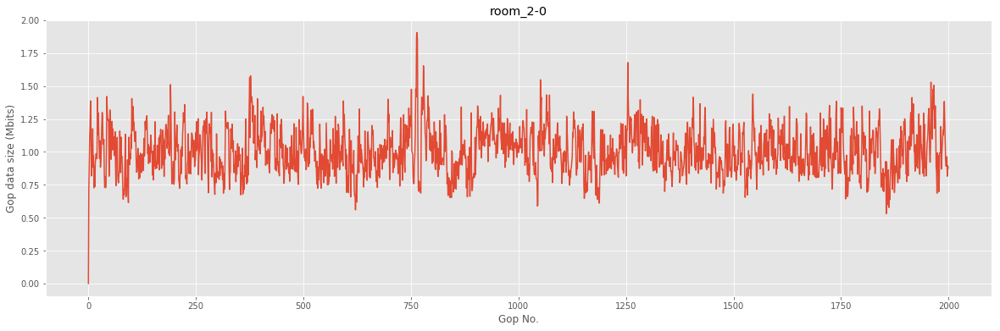

mean gop size:  1.0036375519999998


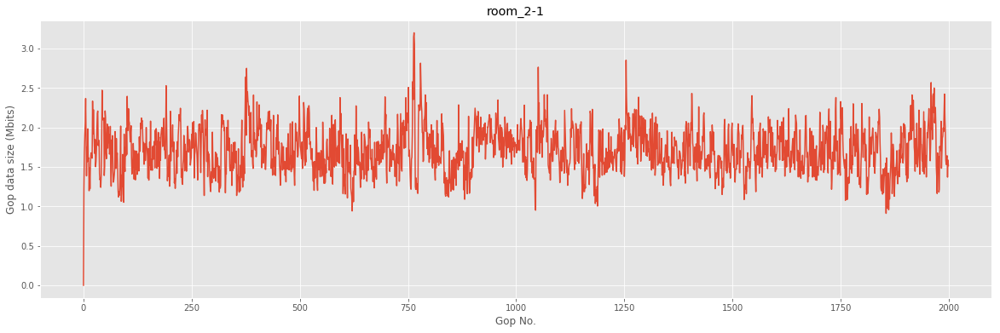

mean gop size:  1.706334912


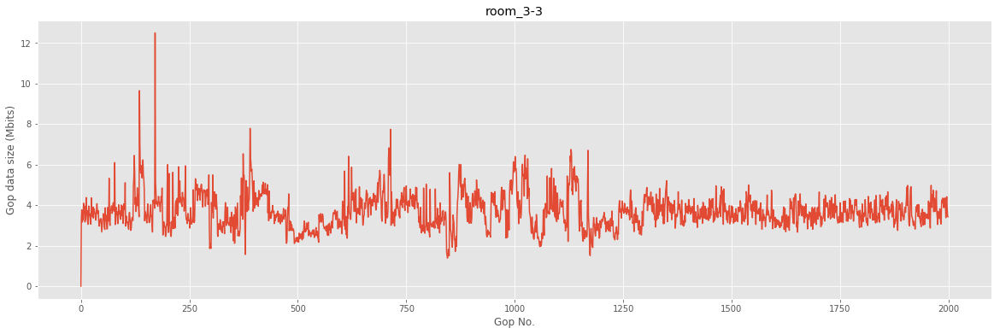

mean gop size:  3.688877496


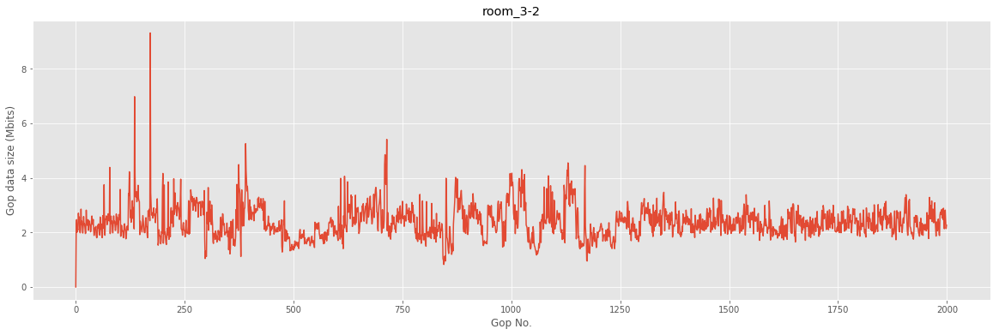

mean gop size:  2.3878089719999998


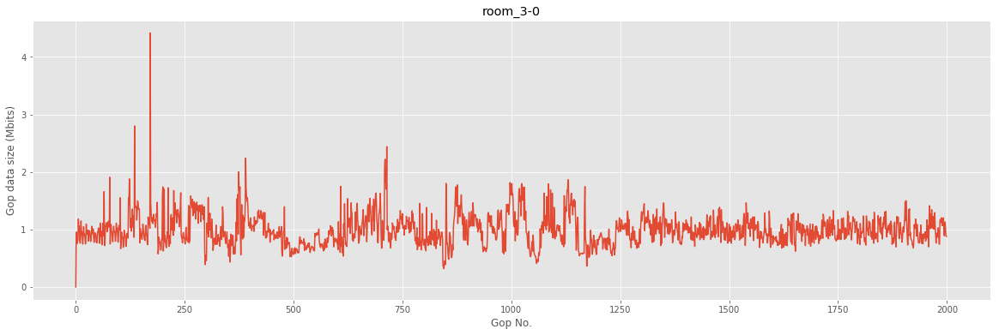

mean gop size:  0.992031364


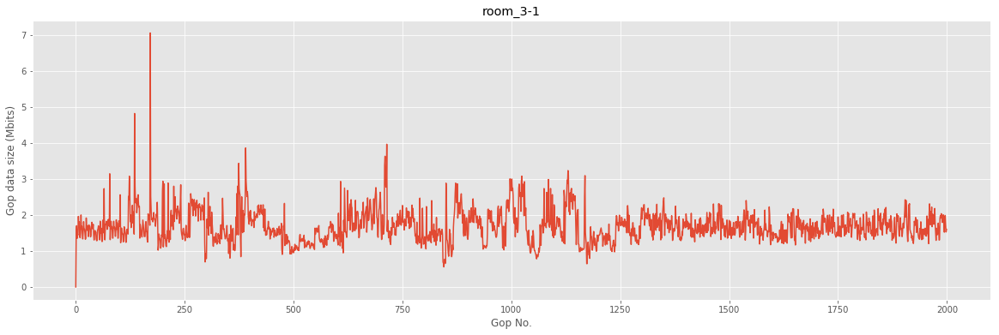

mean gop size:  1.68905576


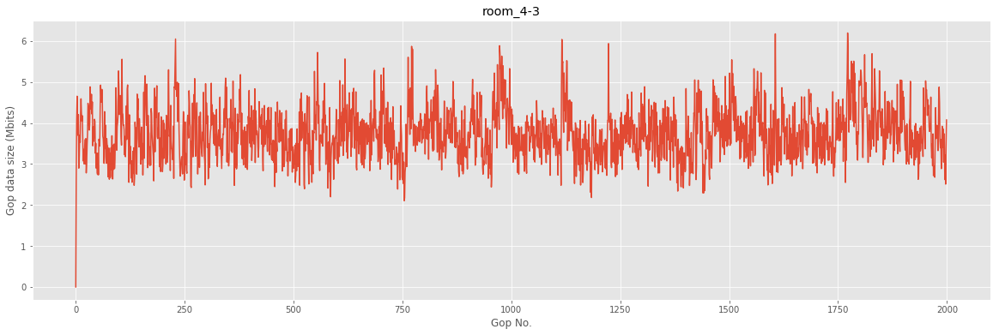

mean gop size:  3.7400509200000003


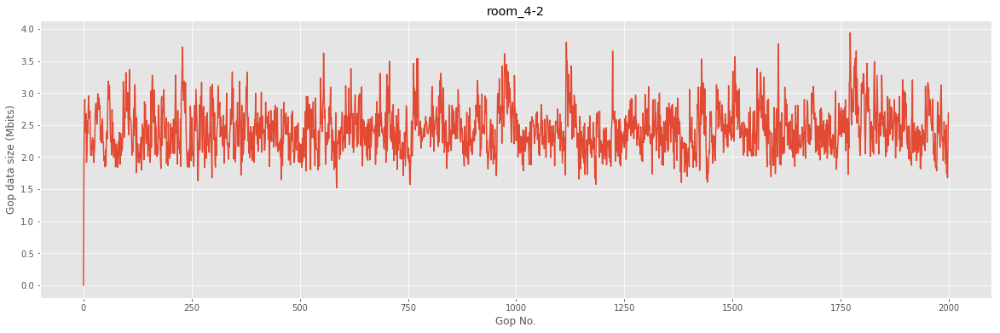

mean gop size:  2.421549148


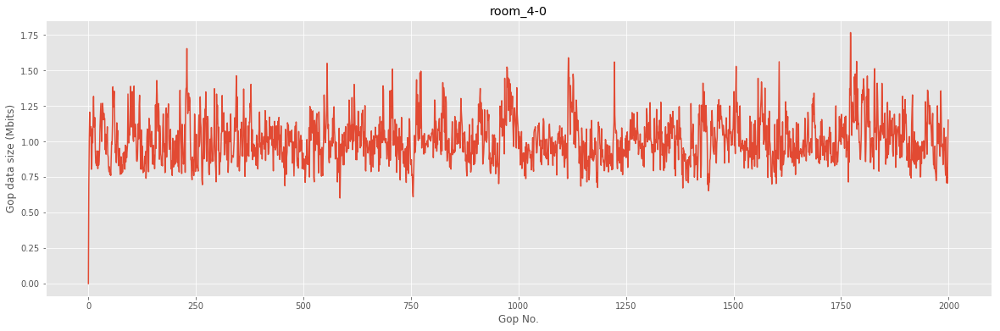

mean gop size:  1.009889468


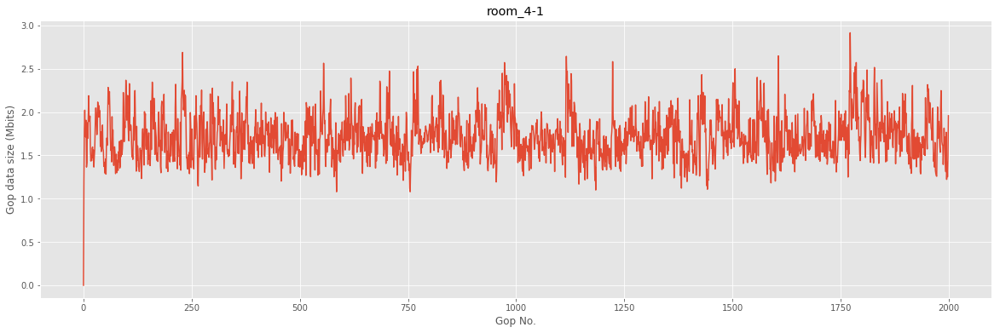

mean gop size:  1.7157363


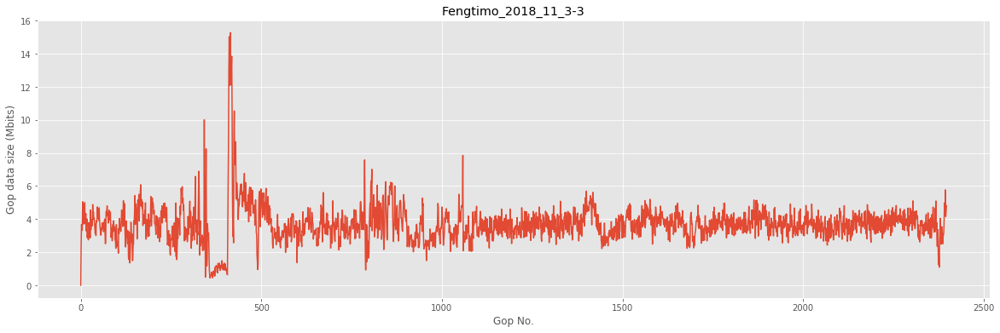

mean gop size:  3.6967846305254386


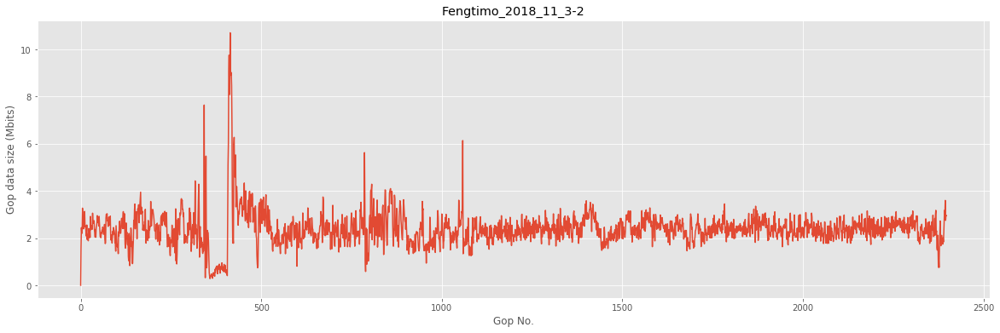

mean gop size:  2.397433097581318


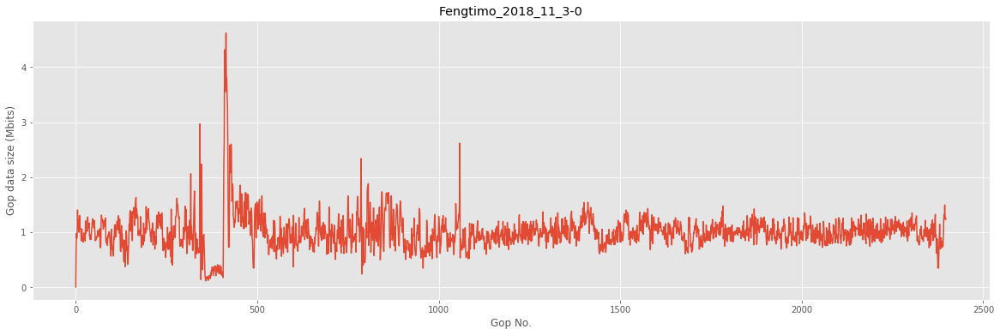

mean gop size:  0.9983488073394496


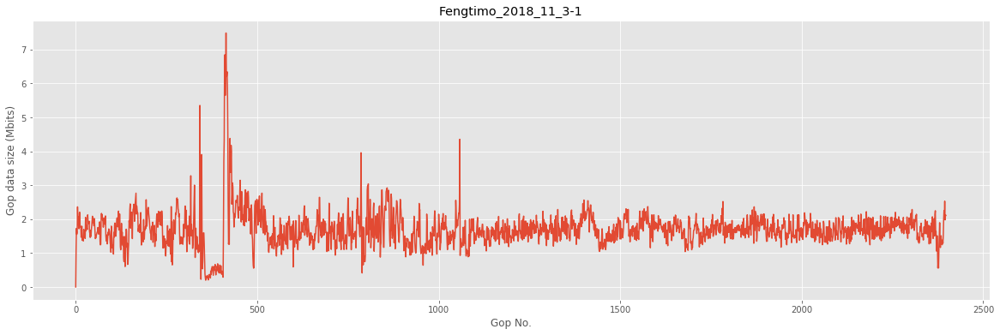

mean gop size:  1.6980858381984987


In [110]:
get_analysis_result_video('video_trace/room/', 'gop', 0)

## Sports

### Frame level analysis

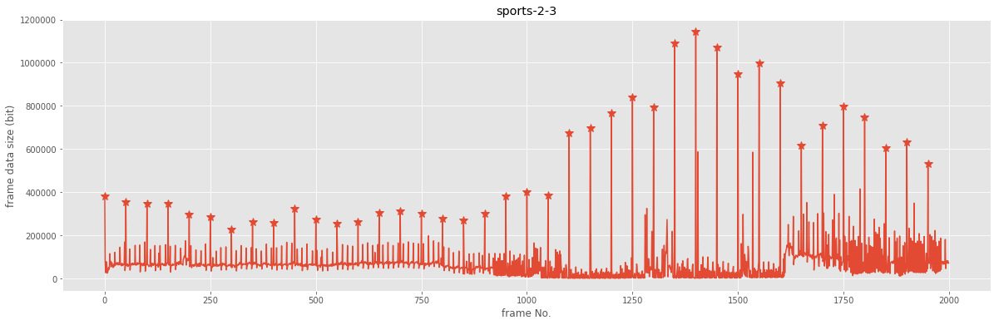

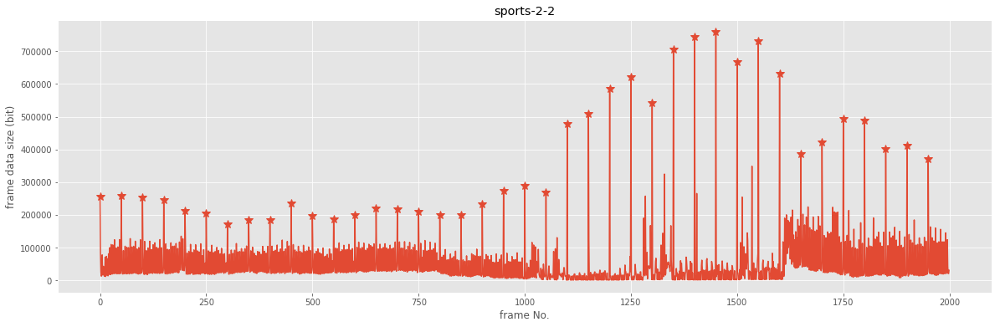

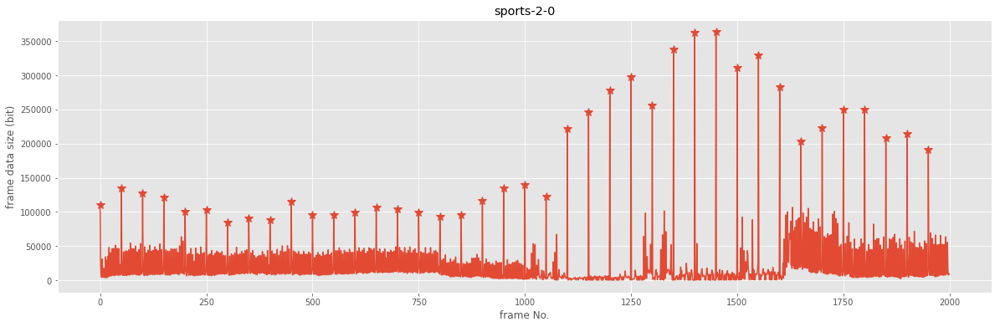

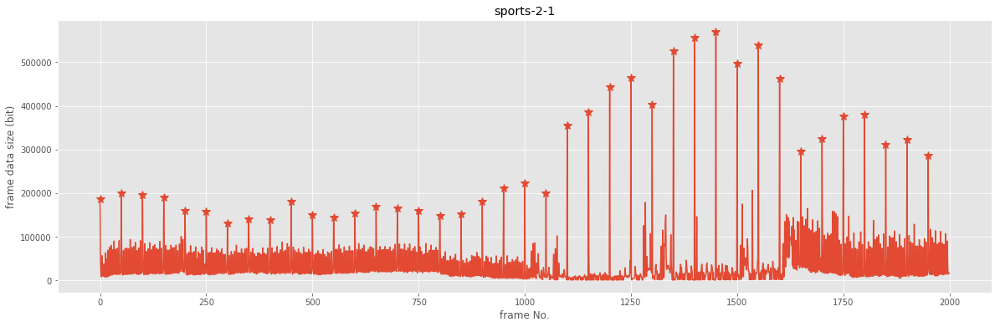

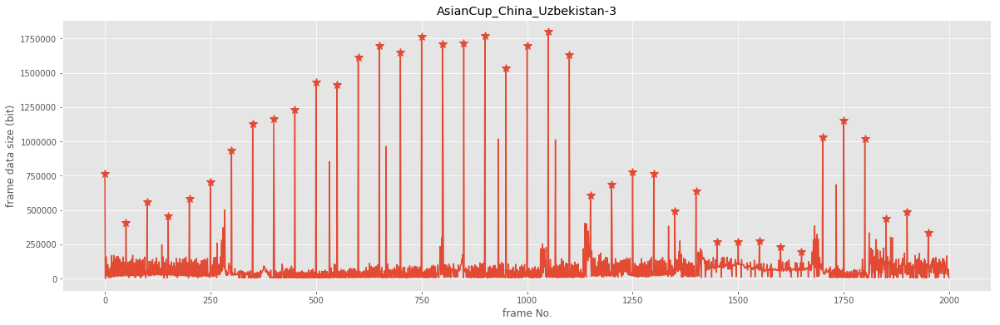

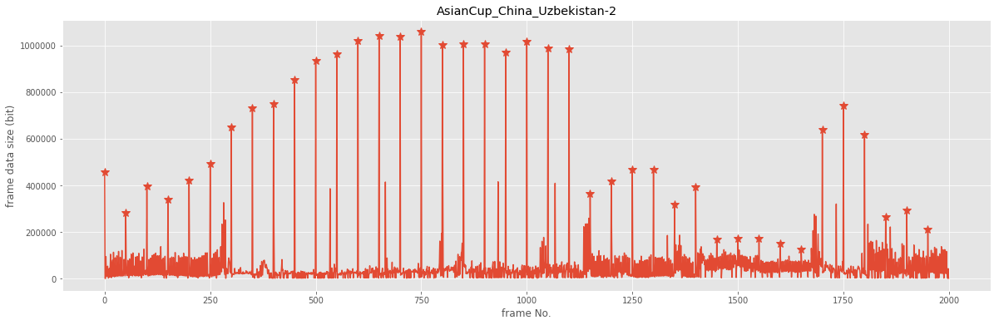

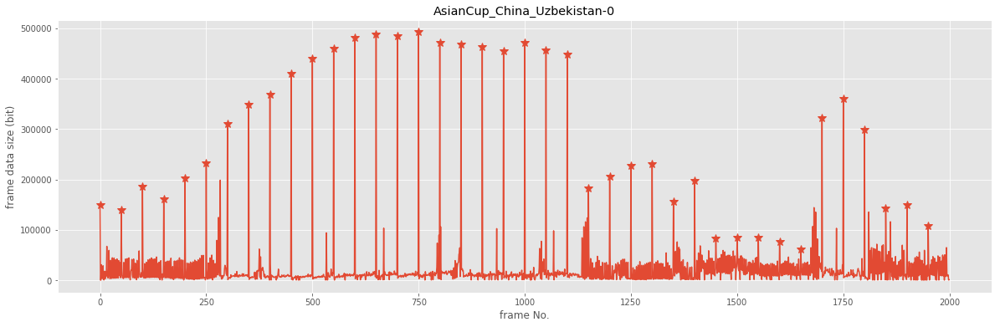

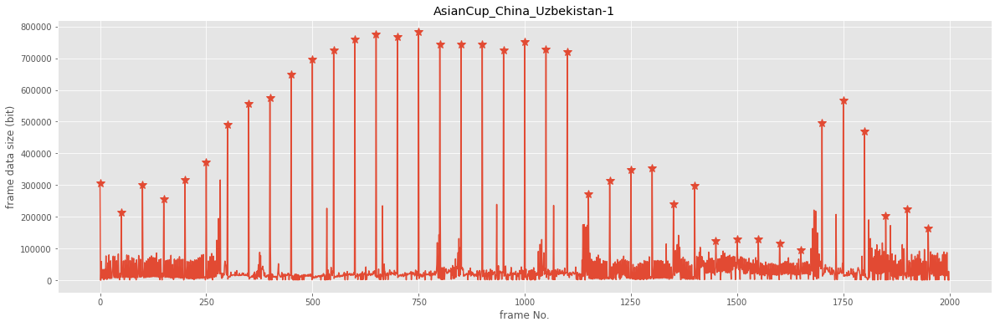

In [37]:
get_analysis_result_video('video_trace/sports/', 'frame', 2000)

### Gop level analysis

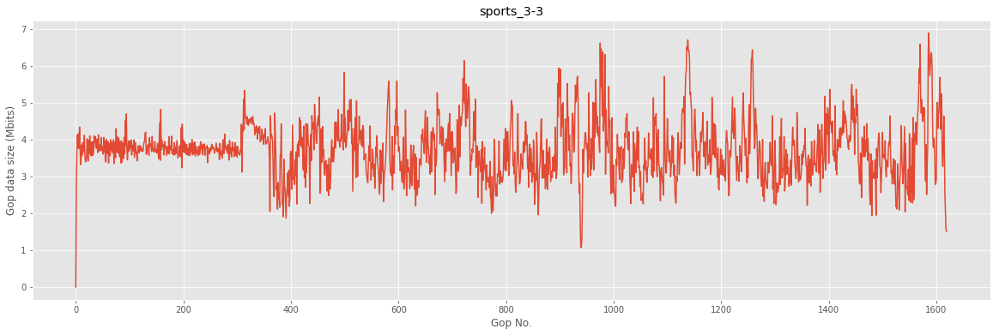

mean gop size:  3.725454666666667


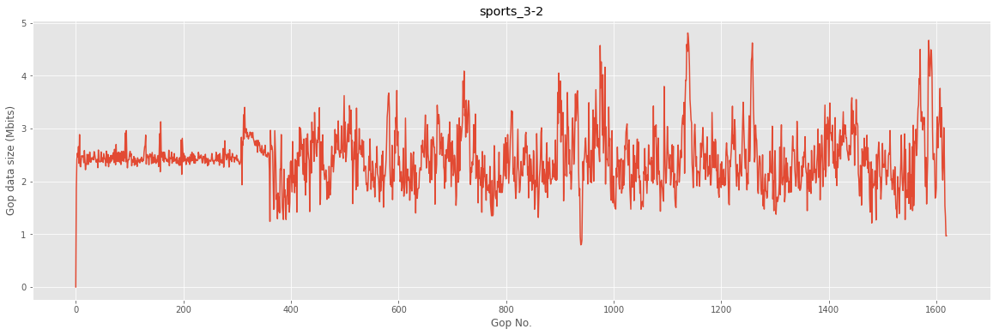

mean gop size:  2.4168820543209875


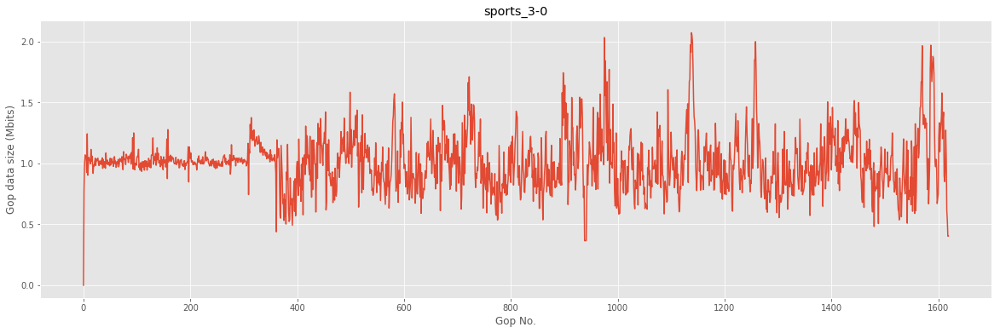

mean gop size:  1.0073019456790124


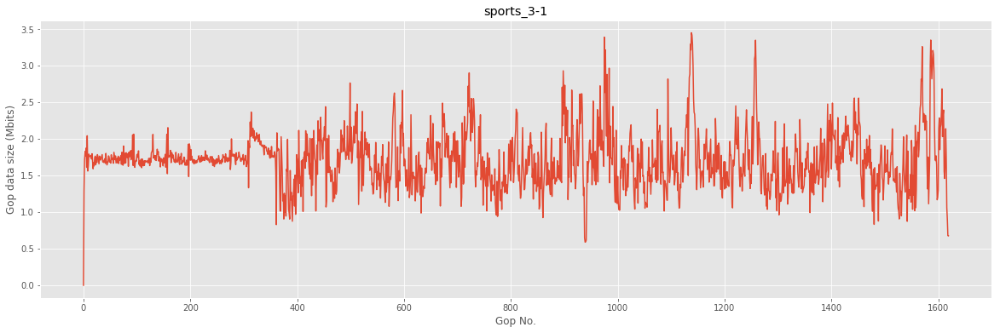

mean gop size:  1.7120804592592593


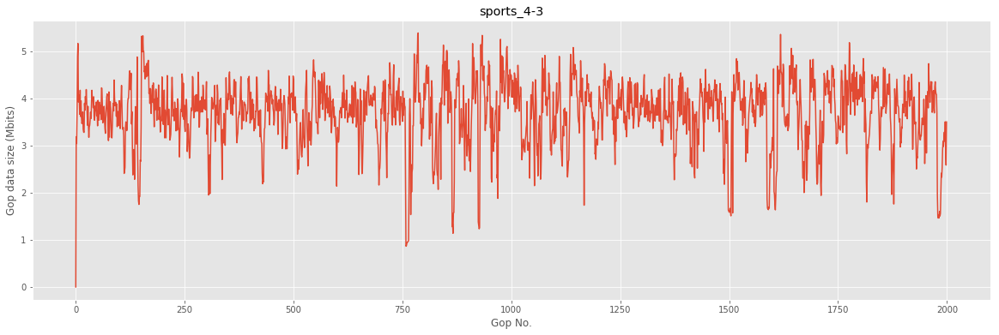

mean gop size:  3.692358436


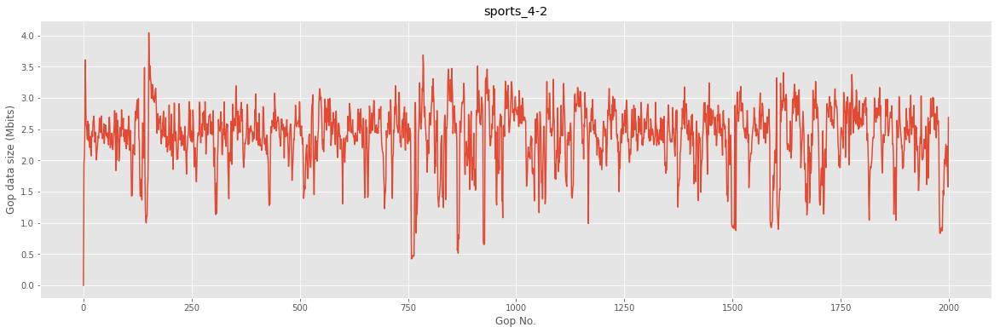

mean gop size:  2.3952731199999997


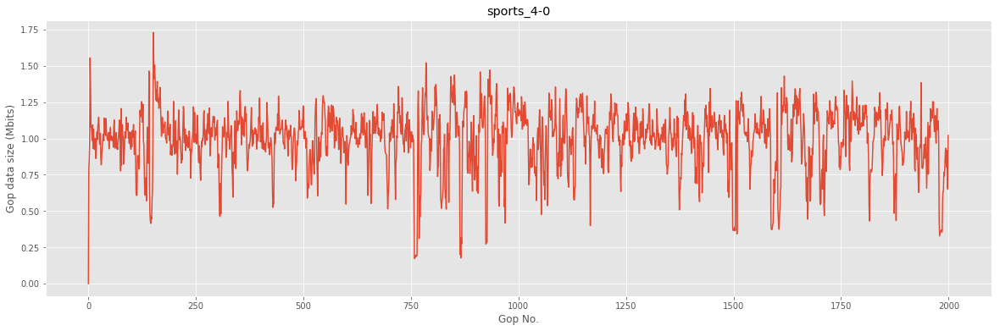

mean gop size:  0.998007972


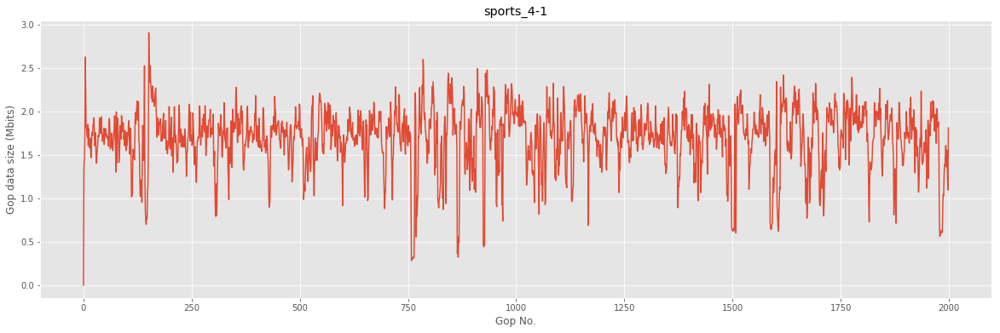

mean gop size:  1.696619332


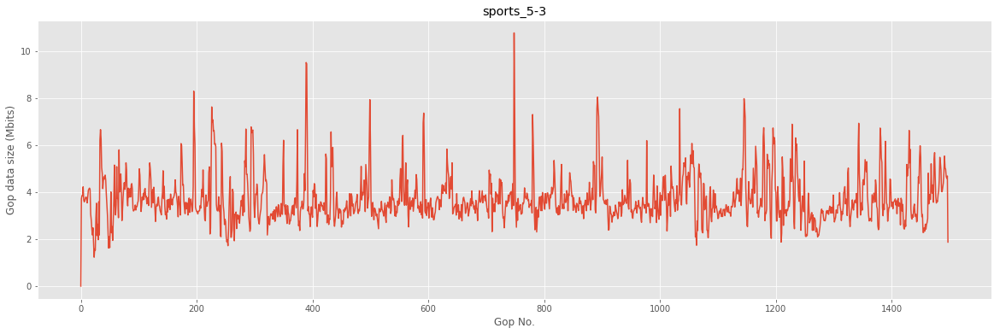

mean gop size:  3.7119626061415216


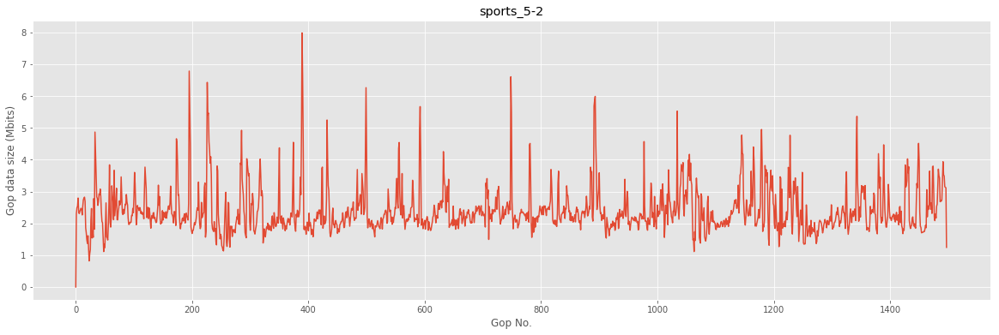

mean gop size:  2.410753036048064


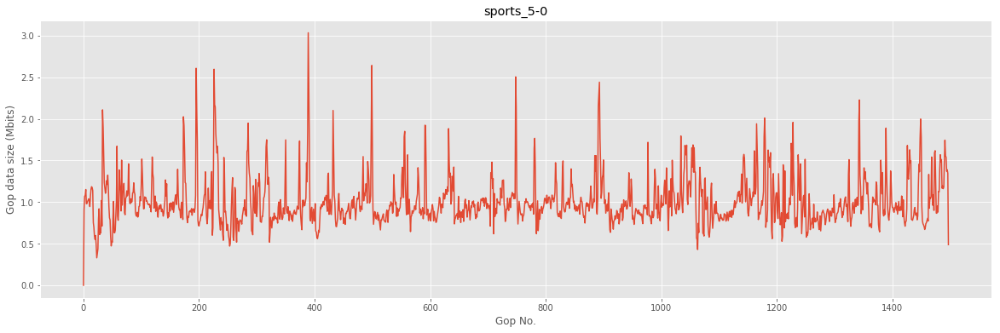

mean gop size:  1.005900598130841


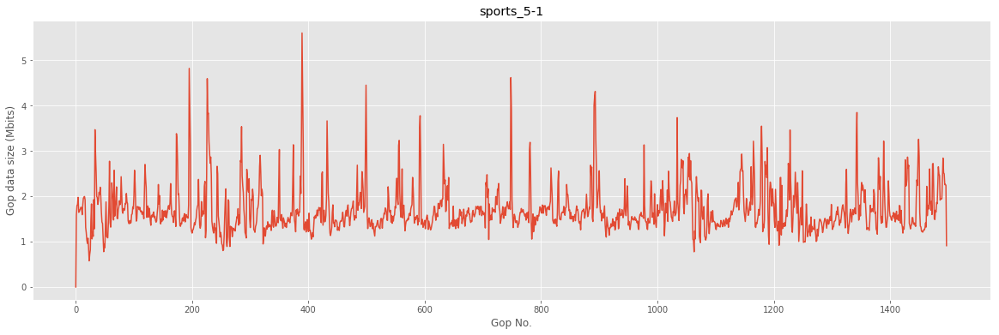

mean gop size:  1.7087847476635514


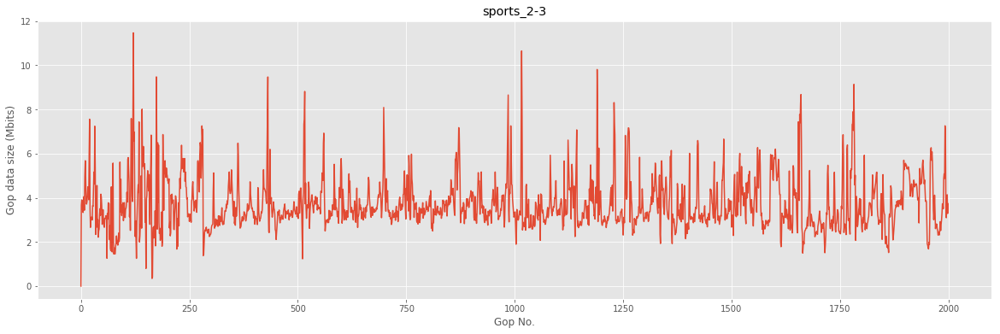

mean gop size:  3.7270945120000003


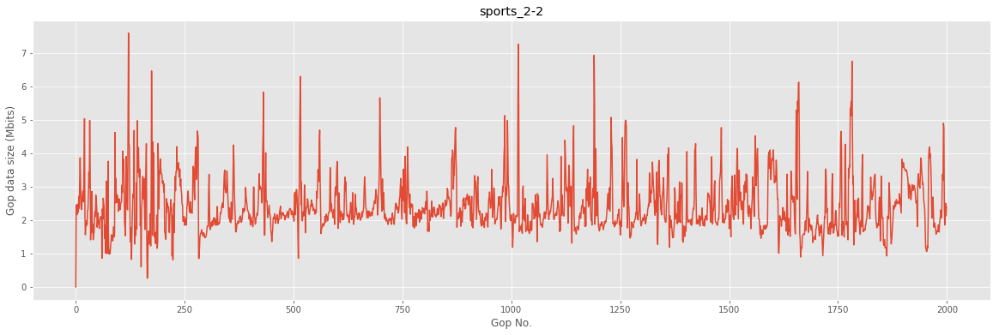

mean gop size:  2.4189925160000003


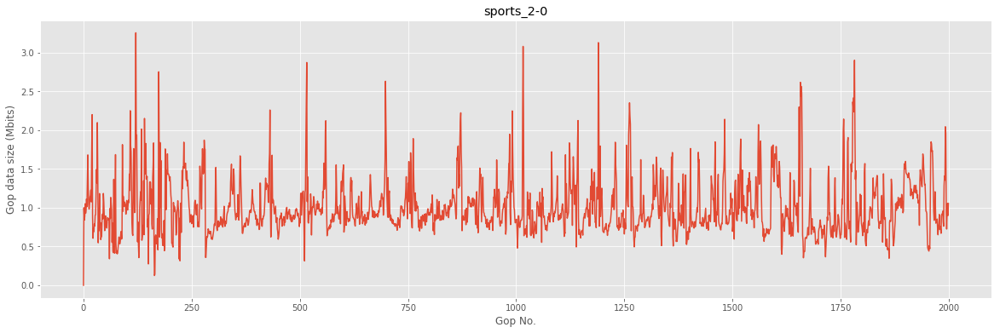

mean gop size:  1.009909964


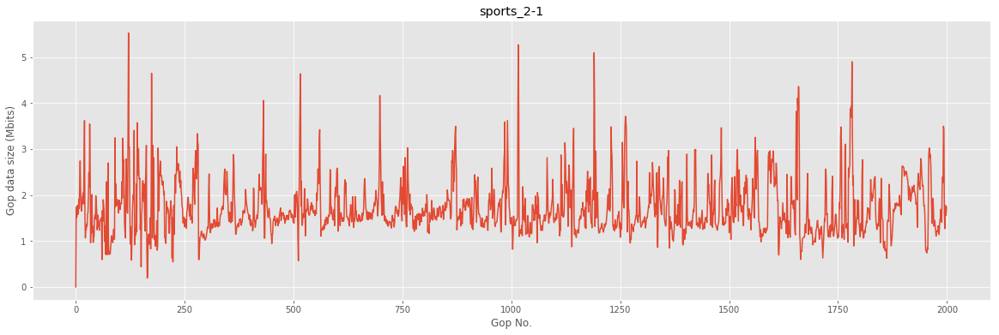

mean gop size:  1.71466642


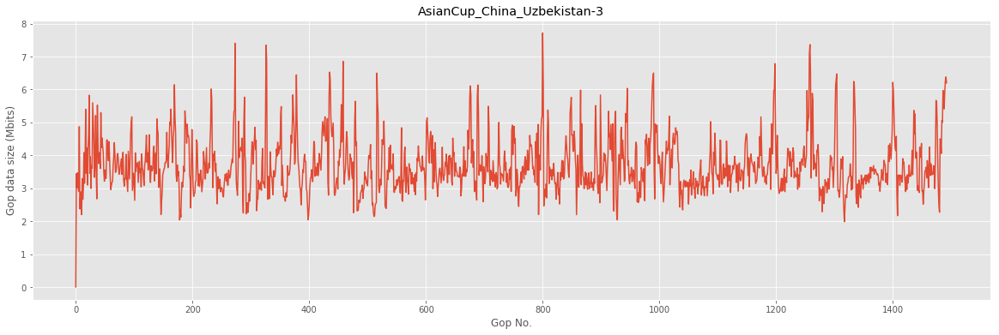

mean gop size:  3.700781711989283


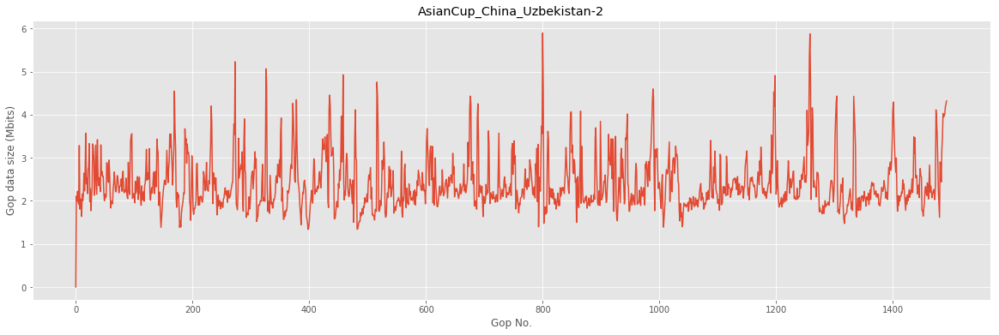

mean gop size:  2.404483761553918


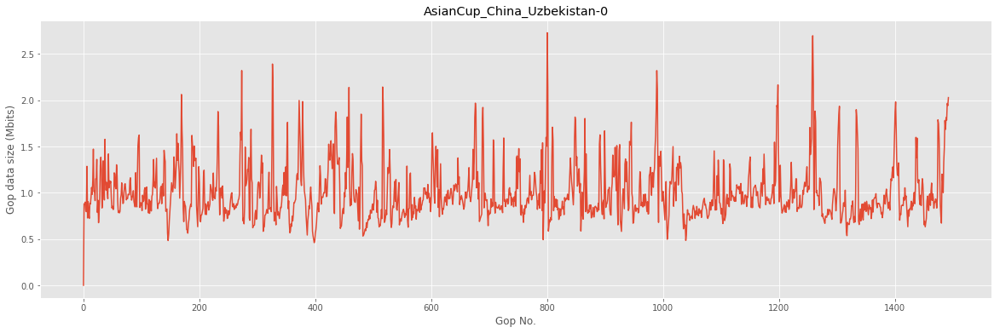

mean gop size:  1.0020873462826525


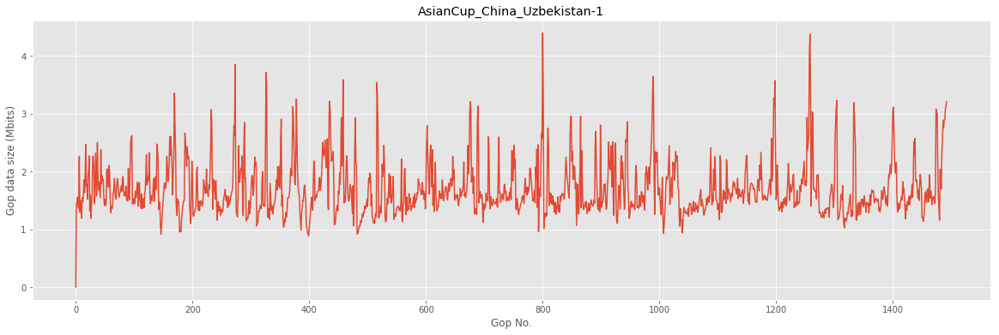

mean gop size:  1.7037968921634292


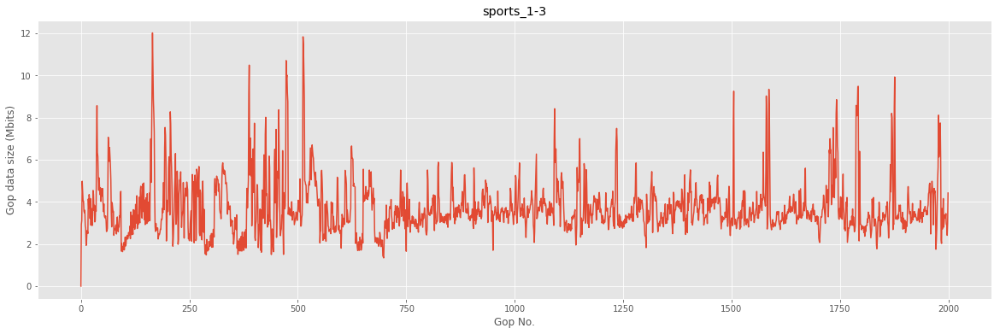

mean gop size:  3.7179246599999995


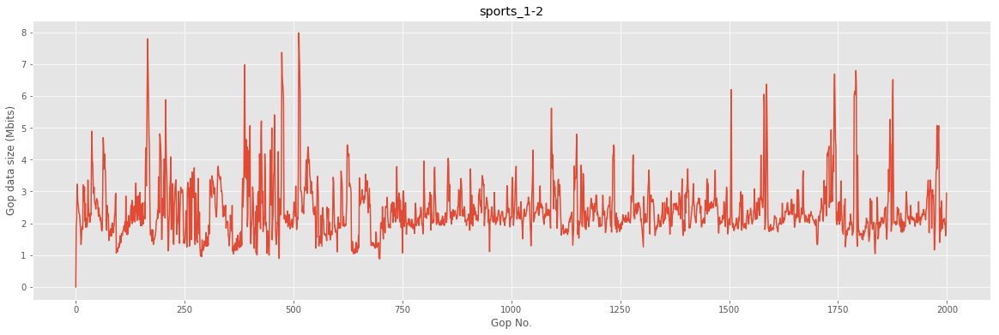

mean gop size:  2.410869828


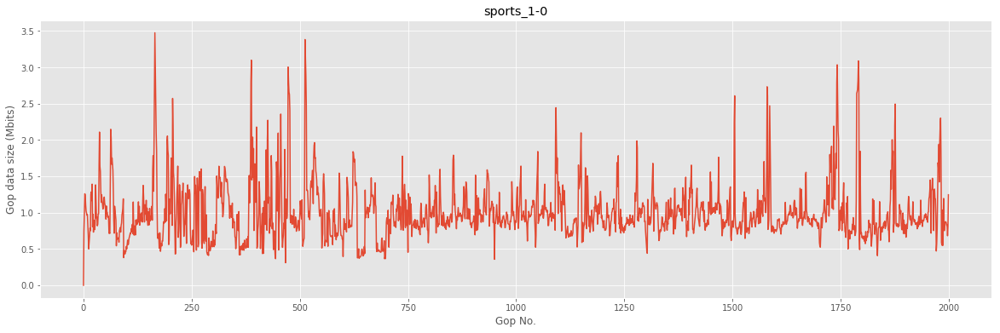

mean gop size:  1.005063744


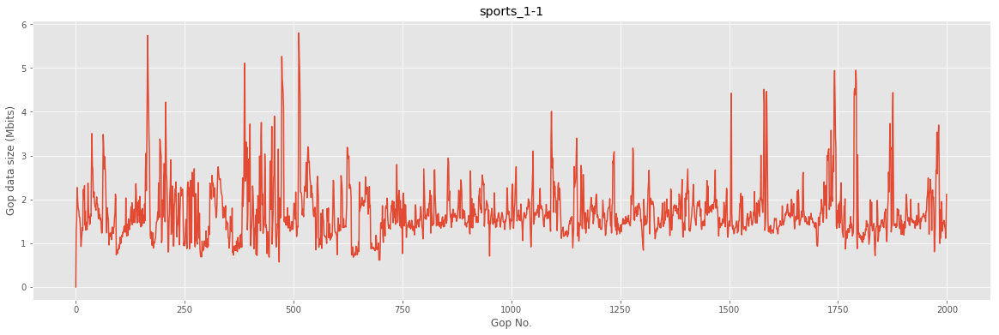

mean gop size:  1.708048064


In [111]:
get_analysis_result_video('video_trace/sports/', 'gop', 0)

### Video GoP size analysis

In [4]:
import numpy as np
def get_gop_size(trace_file):
    gop_sizes = []
    with open(trace_file, 'rb') as f:
        gop_size = 0.0
        for line in f:
            parse = line.split()
#             print(parse)
            if int(parse[2]) == 1:
                gop_sizes.append(gop_size)
#                 print(gop_size)
                gop_size = float(parse[1])
            else:
                gop_size += float(parse[1])
    
    gop_sizes = np.array(gop_sizes) / 1000000
    return gop_sizes

In [17]:
# video_trace = 'video_trace/YYF_2018_08_12/frame_trace_'
# video_trace ='video_trace/AsianCup_China_Uzbekistan/frame_trace_'
video_trace ='video_trace/Fengtimo_2018_11_3/frame_trace_'
gop_sizes_group = []
for i in range(4):
    gop_sizes_group.append(get_gop_size(video_trace + str(i)))

In [18]:
s0 = gop_sizes_group[0][1:-1]
s1 = gop_sizes_group[1][1:-1]
s2 = gop_sizes_group[2][1:-1]
s3 = gop_sizes_group[3][1:-1]

In [19]:
def quality_comparison(s_low, s_high):
    res = s_high / s_low
    print('Average: %.5f.' % np.average(res))
    print('Max: %.5f.' % np.max(res))
    print('Min: %.5f.' % np.min(res))

In [20]:
quality_comparison(s0, s1)

Average: 1.70641.
Max: 1.89800.
Min: 1.43304.


In [21]:
quality_comparison(s1, s2)

Average: 1.41329.
Max: 1.55115.
Min: 1.04483.


In [22]:
quality_comparison(s2, s3)

Average: 1.54425.
Max: 1.95626.
Min: 1.17937.


## Network Trace Preprocess
### Mix high, middle, and low together

In [75]:
import os
import shutil

In [78]:
for root, dirnames, filenames in os.walk(os.path.abspath('./network_trace/')):
    for filename in filenames:
        filename = os.path.join(root, filename)
        
        src_file = filename
        
        parse = filename.split('/')
        new_filename = parse[-2] + '-' + parse[-1]
        des_file = os.path.join(os.path.abspath('./network_trace/mix_trace/'), new_filename)
        
        if os.path.exists(des_file):
            continue
        else:
            shutil.copy(src_file, des_file)
            print('%s copied' % new_filename)

high-13 copied
high-17 copied
high-12 copied
high-3 copied
high-0 copied
high-16 copied
high-10 copied
high-11 copied
high-1 copied
high-18 copied
high-6 copied
high-4 copied
high-5 copied
high-19 copied
high-9 copied
high-14 copied
high-2 copied
high-7 copied
high-8 copied
high-15 copied
low-3 copied
low-0 copied
low-24 copied
low-1 copied
low-6 copied
low-21 copied
low-27 copied
low-20 copied
low-25 copied
low-4 copied
low-22 copied
low-5 copied
low-9 copied
low-28 copied
low-2 copied
low-23 copied
low-7 copied
low-29 copied
low-26 copied
low-8 copied
mix_trace-high-5 copied
mix_trace-high-0 copied
mix_trace-low-28 copied
mix_trace-high-19 copied
mix_trace-high-17 copied
mix_trace-high-9 copied
mix_trace-low-1 copied
mix_trace-low-0 copied
mix_trace-low-24 copied
mix_trace-high-7 copied
mix_trace-low-9 copied
mix_trace-high-10 copied
mix_trace-low-22 copied
mix_trace-low-3 copied
mix_trace-low-8 copied
mix_trace-low-23 copied
mix_trace-low-26 copied
mix_trace-high-12 copied
mix_trace

In [90]:
def copy_file(src, des):
    time_s = []
    thp_mbps = []
    with open(src, 'r') as f:
        for line in f:
            parse = line.split()
            if len(parse) == 2:
                try:
                    time_s.append(parse[0])
                    thp_mbps.append(float(parse[1]))
                except ValueError:
                    print('we got an error: ', parse[0], parse[1])
    thp_mbps = np.array(thp_mbps)
    thp_mbps = 0.65 + (0.095/0.52)*(thp_mbps-1.22)
    thp_mbps = thp_mbps.tolist()
    str_thp_mbps = [str(item) for item in thp_mbps]
#     print(time_s[:5])
#     print(str_thp_mbps[:5])
    with open(des, 'w') as f:
        for time, thp in zip(time_s, str_thp_mbps):
            f.write(time + ' ' + thp + '\n')
    

for root, dirnames, filenames in os.walk(os.path.abspath('./network_trace/low')):
    for filename in filenames:
        filename = os.path.join(root, filename)
        
        src_file = filename
        
        parse = filename.split('/')
        new_filename = parse[-1]
        des_file = os.path.join(os.path.abspath('./network_trace/xlow/'), new_filename)
        
        if os.path.exists(des_file):
            continue
        else:
            copy_file(src_file, des_file)
            print('%s copied' % new_filename)

27 copied
9 copied
0 copied
7 copied
29 copied
6 copied
28 copied
1 copied
26 copied
8 copied
21 copied
24 copied
23 copied
4 copied
3 copied
2 copied
5 copied
22 copied
25 copied


## Cat pensieve traces into bigger file

In [106]:
def write_file(thps, file):
    times = [str(x*0.5) for x in range(0, 5880)]
    assert len(thps) == 5880
    with open(file, 'w') as f:
        for time, thp in zip(times, thps):
            f.write(time + " " + thp + "\n")

thps = []
for root, dirnames, filenames in os.walk(os.path.abspath('./Pensieve-traces/test_sim_traces')):
    for filename in filenames:
        filename = os.path.join(root, filename)
        
        src_file = filename
        
        with open(src_file, 'r') as f:
            for line in f:
                parse = line.split()
                if len(parse) == 2:
                    try:
    #                   time_s.append(parse[0])
                        thps.append(str(float(parse[1])+0.1))
                    except ValueError:
                        print('we got an error: ', parse[0], parse[1])

count = 0
file_num = len(thps) // 5880
for file_count in range(0, file_num):
    new_filename = str(file_count+13)
    des_file = os.path.join(os.path.abspath('./cooked_trace/'), new_filename)
    if os.path.exists(des_file):
        continue
    else:
        write_file(thps[5880*file_count: 5880*file_count+5880], des_file)
        print('%s finished ' % new_filename)
#         parse = filename.split('/')
#         new_filename = parse[-1]
#         des_file = os.path.join(os.path.abspath('./network_trace/xlow/'), new_filename)
        
#         if os.path.exists(des_file):
#             continue
#         else:
#             copy_file(src_file, des_file)
#             print('%s copied' % new_filename)

13 finished 
14 finished 
15 finished 
16 finished 
